<a href="https://colab.research.google.com/github/JennyJihyunSeo/jennyjihyunseo.github.io/blob/main/Customer_Personality_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **1. Dataset Overview**
The dataset contains 2,240 unique customer records. The customers are distinguished by customer ID and each ID number is not repeated. There 24 null values in the ‘Income’ variable among the total 2240 rows. The dataset consists of 5 distinct components. First, it includes customers’ demographics, such as educational level, income and the number of children. Specifically, there are separate columns for ‘Kids at home’ and ‘Teenagers at home’. I decided to combine them into a single categorical variable by assigning ‘1’ if customers said ‘yes’ in either column and ‘0’ if they answered ‘no’ in both columns to avoid overlaps that could occur when customers check both columns, even with only one kid or teenager at home, as no age range is specified in the dataset. Second, there are columns indicating the amount spent on products such as meat, fish, wines and so on. These products are primarily necessities but wines and gold products are categorized as luxury items. I summed all spending columns and created a new ‘Spending’ column to make it as the dependent variable for CART regression to segment customers into distinct spending groups to identify target spending groups for future marketing campaigns. Third, there are categorical variables related to marketing campaign acceptance by customers encoded by ‘1’ (Response Yes) and ‘0’ (No response). There are 6 variables and they indicate the customer acceptance for campaigns from the 1st to the 6th (the last) campaign. Customer responses for the most recent campaign is included in the ‘Response’ variable which serves as the dependent variable for classifying customers into responders and non-responders during predictive modeling. Fourth, the dataset lists the purchasing channels chosen by customers. The number of purchases through different purchasing channels such as in-store, online or other purchasing methods are specified. Lastly, there are some variables related to this company such as customer enrollment date (Dt_customer), the number of days since their last purchase (recency) and whether customers complained within the last 2 years (Complaints).

## **2. Project Goal**

Understanding customers is crucial for creating effective marketing strategies by predicting high-potential customers who are most likely to respond to marketing campaigns while optimizing limited resources. I aim to improve campaign efficiency by classifying customers into distinct spending groups and accurately predicting customer responses to the most recent marketing campaign using historical marketing campaign response data and customer demographic information. To achieve this goal, I separated data analysis into 2 different parts. First, I used CART regression and K-means clustering for customer segmentation depending on their spending on products. I analyzed customer data from the retail industry to segment customers on their spending behavior. This segmentation identifies which spending groups are more likely to respond to marketing campaigns and highlights effective marketing channels for targeting specific groups. Second, I used several machine learning models to predict customer responses to the last marketing campaign. I divided the entire dataset into a train and test dataset to evaluate each model performance and select the best-performing model based on several metrics such as accuracy, precision and recall.

## **3. Exploratoy Data Analysis & Data Preprocessing**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats

In [3]:
path='/content/drive/MyDrive/Dataset/marketing_campaign (1).csv'
df=pd.read_csv(path, sep="\t")

In [4]:
pd.set_option('display.max_columns',30)

In [5]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [6]:
df.tail()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0
2239,9405,1954,PhD,Married,52869.0,1,1,15-10-2012,40,84,3,61,2,1,21,3,3,1,4,7,0,0,0,0,0,0,3,11,1


In [7]:
df = df.drop(['Z_CostContact', 'Z_Revenue'], axis=1)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [9]:
df.isna().sum()

,0
ID,0
Year_Birth,0
Education,0
Marital_Status,0
Income,24
Kidhome,0
Teenhome,0
Dt_Customer,0
Recency,0
MntWines,0


In [10]:
df.isna().mean()

,0
ID,0.000000
Year_Birth,0.000000
Education,0.000000
Marital_Status,0.000000
Income,0.010714
Kidhome,0.000000
Teenhome,0.000000
Dt_Customer,0.000000
Recency,0.000000
MntWines,0.000000


In [11]:
df=df.dropna(subset=['Income'])

- 'Income' column has 24 missing values out of a total of 2240 rows (approximately 1.07%). I dropped missing values due to the fact that this is a very small proportion indicating that the impact on dataset's integrity and representativeness will be minimal.

In [12]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,5588.353339,1968.820397,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,27.028881,43.965253,2.323556,4.085289,2.671029,5.800993,5.319043,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,0.150271
std,3249.376275,11.985554,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,41.072046,51.815414,1.923716,2.740951,2.926734,3.250785,2.425359,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.357417
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2814.750000,1959.000000,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,8.000000,24.500000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,8421.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


**Scatter Plot between MntMeatProducts and NumCatalogPurchases**
- Even if the two variables seem to be linearly correlated, the scatter plot between them represents there would be outliers pulling the regression line upward.
- If those outliers are removed, the rest of the data points are not strongly correlated with each other.

<ipython-input-13-e20839edfd1b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=df['ID'].value_counts().index[:num_ids_to_display],


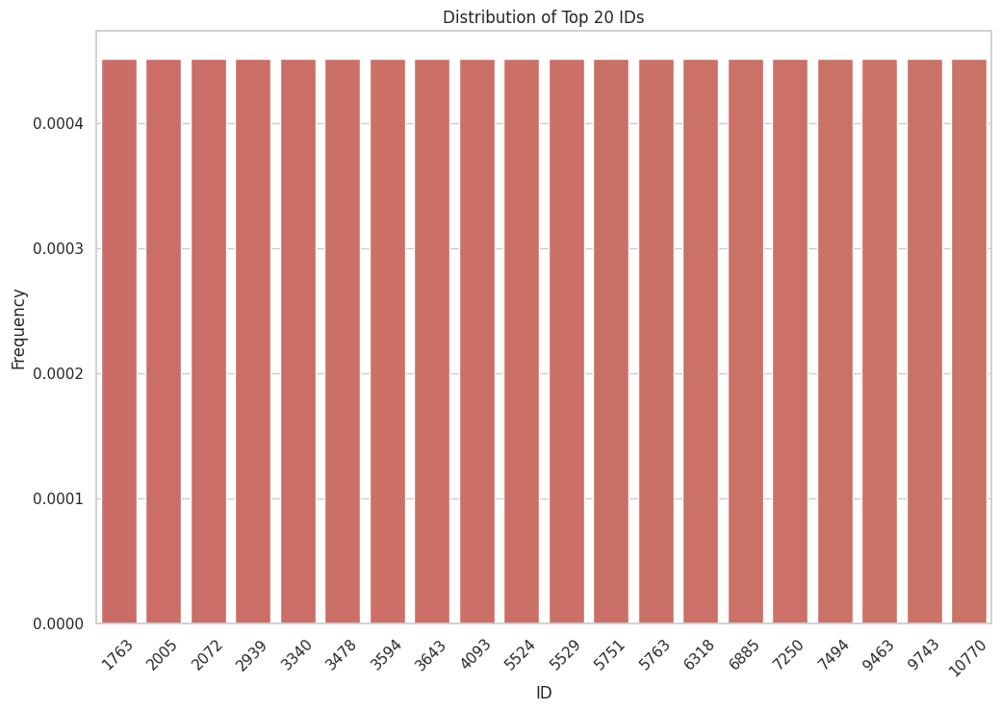

In [13]:
cm=sns.color_palette('hls', len(df['ID'].unique()))
sns.set_theme(style='whitegrid')
num_ids_to_display = 20
total_ids = df['ID'].value_counts().sum()
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=df['ID'].value_counts().index[:num_ids_to_display],
                 y=df['ID'].value_counts()[:num_ids_to_display] / total_ids,
                 palette=cm[:num_ids_to_display])
ax.set(xlabel='ID', ylabel='Frequency', title='Distribution of Top 20 IDs')
plt.xticks(rotation=45)
plt.show()

In [14]:
df['ID'].nunique()

2216

In [15]:
len(df['ID'].unique())

2216

<ipython-input-16-8b319429b5e7>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=df['Year_Birth'].value_counts().index,


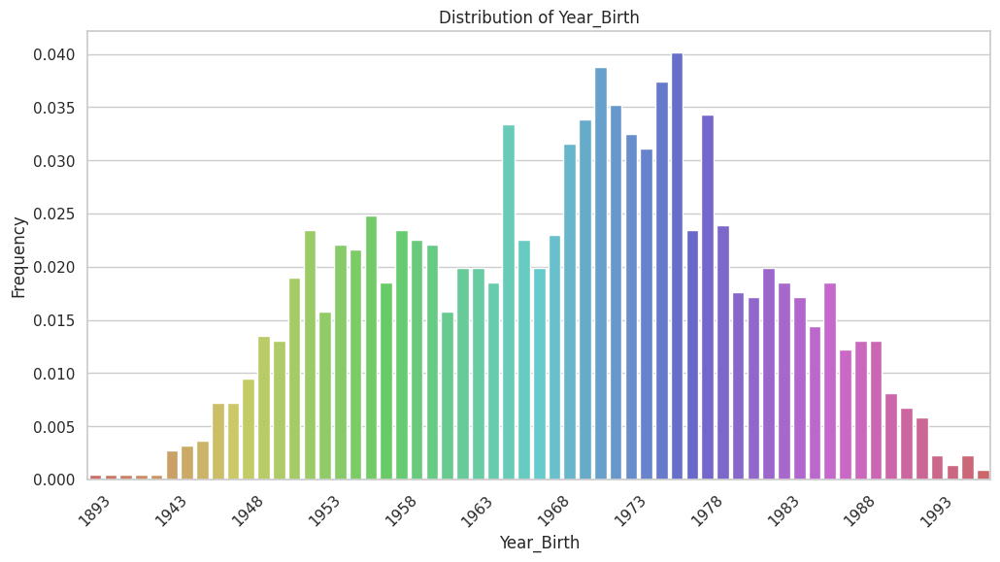

In [16]:
cm = sns.color_palette('hls', len(df['Year_Birth'].unique()))

sns.set_theme(style='whitegrid')

total_birth = df['Year_Birth'].value_counts().sum()
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=df['Year_Birth'].value_counts().index,
                 y=df['Year_Birth'].value_counts() / total_birth,
                 palette=cm)
ax.set(xlabel='Year_Birth', ylabel='Frequency', title='Distribution of Year_Birth')

plt.xticks(rotation=45)

every_nth = 5
for n, label in enumerate(ax.xaxis.get_ticklabels()):
    if n % every_nth != 0:
        label.set_visible(False)

plt.show()

<ipython-input-17-0912971e4cad>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['Year_Birth'], palette='viridis')


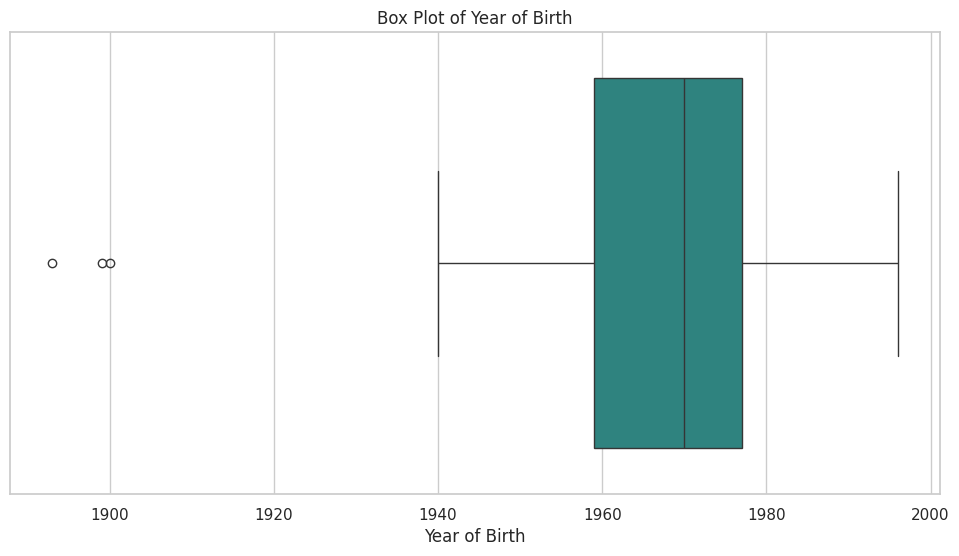

Q1 (25th percentile): 1959.0
Median (50th percentile): 1970.0
Q3 (75th percentile): 1977.0
IQR (Interquartile Range): 18.0
Lower Whisker: 1932.0
Upper Whisker: 2004.0


In [17]:
plt.figure(figsize=(12, 6))

sns.boxplot(x=df['Year_Birth'], palette='viridis')
plt.title('Box Plot of Year of Birth')
plt.xlabel('Year of Birth')

plt.show()

q1 = df['Year_Birth'].quantile(0.25)
median = df['Year_Birth'].quantile(0.50)
q3 = df['Year_Birth'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

Box Plot of 'Year_birth' variable.

- Q1 is 1959 meaning that 25% of customers were born before this year.
- Median is 1970 indicating that the half of the customers were born before 1970 and the rest of the customers were born after this year.
- Q3 is 1977 meaning that 75% of customers were born before 1977.
- Whiskers extend from 1932 to 2004 and any birth years outside this range can be considered outliers.


In [18]:
2024-df['Year_Birth']

,Year_Birth
0,67
1,70
2,59
3,40
4,43
...,...
2235,57
2236,78
2237,43
2238,68


In [19]:
df['age']=2024-df['Year_Birth']

<ipython-input-20-fc8ebbde7ae4>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=df['age'].value_counts().index,


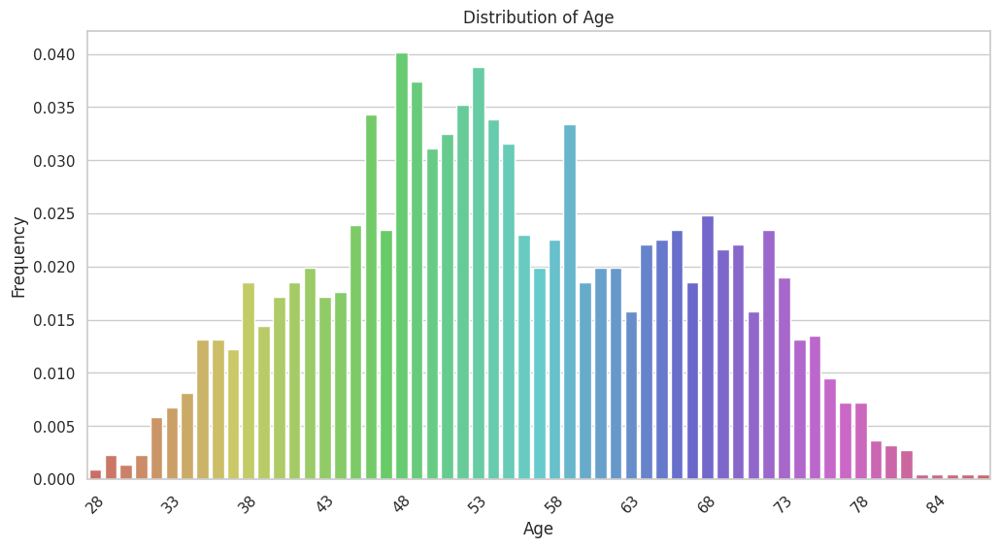

In [20]:
cm = sns.color_palette('hls', len(df['age'].unique()))

sns.set_theme(style='whitegrid')

total_birth = df['age'].value_counts().sum()
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=df['age'].value_counts().index,
                 y=df['age'].value_counts() / total_birth,
                 palette=cm)
ax.set(xlabel='Age', ylabel='Frequency', title='Distribution of Age')

plt.xticks(rotation=45)

every_nth = 5
for n, label in enumerate(ax.xaxis.get_ticklabels()):
    if n % every_nth != 0:
        label.set_visible(False)

plt.show()

<ipython-input-21-d7777abf2c9d>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['age'], palette='viridis')


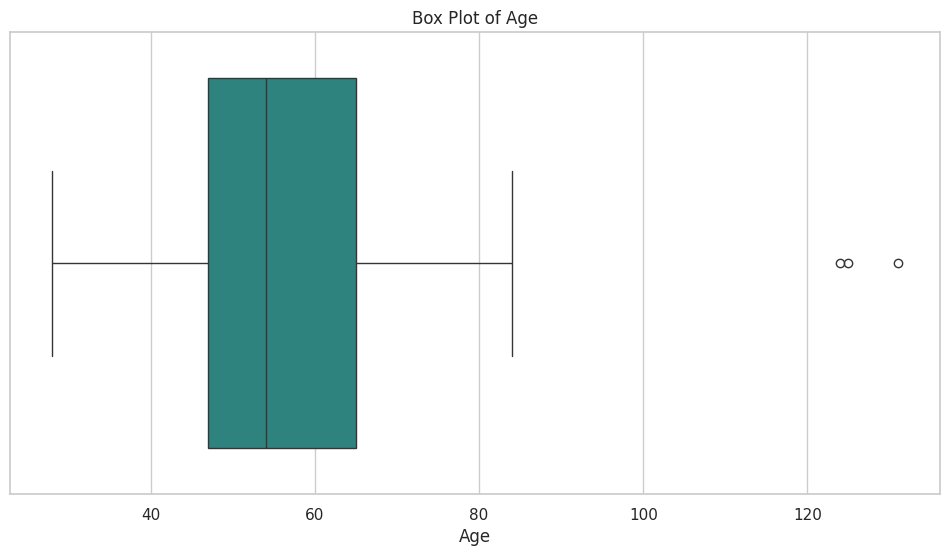

Q1 (25th percentile): 47.0
Median (50th percentile): 54.0
Q3 (75th percentile): 65.0
IQR (Interquartile Range): 18.0
Lower Whisker: 20.0
Upper Whisker: 92.0


In [21]:
plt.figure(figsize=(12, 6))

sns.boxplot(x=df['age'], palette='viridis')
plt.title('Box Plot of Age')
plt.xlabel('Age')

plt.show()

q1 = df['age'].quantile(0.25)
median = df['age'].quantile(0.50)
q3 = df['age'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

Box Plot of 'Age' variable.

- Q1 is 47 meaning that 25% of customers were 47 years old in 2024.
- Median is 54 indicating that the half of the customers became 54 years old in 2024 and the rest of the customers were more that 54 years old this year.
- Q3 is 65 meaning that 75% of customers became 65 years old in 2024.
- Whiskers extend from 20 to 92 and any ages outside this range can be considered outliers.


In [22]:
df = df.drop(columns=['Year_Birth'])

In [23]:
# Identifying outliers
outliers = df[(df['age'] < lower_whisker) | (df['age'] > upper_whisker)]

# Sorting outliers
sorted_outliers = outliers.sort_values(by='age')

# Displaying sorted outliers
print("Sorted Outliers:")
print(sorted_outliers)

# Code to decide whether to remove them or not
print("\nDecision to remove:")
if len(outliers) > 0:
    print(f"There are {len(outliers)} outliers in the 'age' column.")
    print("Analyze the context and relevance of these outliers.")
    print("If they are data entry errors or irrelevant for analysis, consider removing them:")
    print("df = df[(df['age'] >= lower_whisker) & (df['age'] <= upper_whisker)]")
else:
    print("No outliers detected.")

Sorted Outliers:
        ID Education Marital_Status   Income  Kidhome  Teenhome Dt_Customer  \
192   7829  2n Cycle       Divorced  36640.0        1         0  26-09-2013   
339   1150       PhD       Together  83532.0        0         0  26-09-2013   
239  11004  2n Cycle         Single  60182.0        0         1  17-05-2014   

     Recency  MntWines  MntFruits  MntMeatProducts  MntFishProducts  \
192       99        15          6                8                7   
339       36       755        144              562              104   
239       23         8          0                5                7   

     MntSweetProducts  MntGoldProds  NumDealsPurchases  NumWebPurchases  \
192                 4            25                  1                2   
339                64           224                  1                4   
239                 0             2                  1                1   

     NumCatalogPurchases  NumStorePurchases  NumWebVisitsMonth  AcceptedCmp3  \


In [24]:
# Remove rows with outliers and update the original DataFrame
df = df[(df['age'] >= lower_whisker) & (df['age'] <= upper_whisker)]

# Display the updated dataset
print("Data after removing outliers:")
print(df)

# Save the cleaned dataset if needed
# df.to_csv("cleaned_dataset.csv", index=False)

Data after removing outliers:
         ID   Education Marital_Status   Income  Kidhome  Teenhome  \
0      5524  Graduation         Single  58138.0        0         0   
1      2174  Graduation         Single  46344.0        1         1   
2      4141  Graduation       Together  71613.0        0         0   
3      6182  Graduation       Together  26646.0        1         0   
4      5324         PhD        Married  58293.0        1         0   
...     ...         ...            ...      ...      ...       ...   
2235  10870  Graduation        Married  61223.0        0         1   
2236   4001         PhD       Together  64014.0        2         1   
2237   7270  Graduation       Divorced  56981.0        0         0   
2238   8235      Master       Together  69245.0        0         1   
2239   9405         PhD        Married  52869.0        1         1   

     Dt_Customer  Recency  MntWines  MntFruits  MntMeatProducts  \
0     04-09-2012       58       635         88              54

In [25]:
df['Marital_Status'].nunique()

8

In [26]:
df['Marital_Status'].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [27]:
df['Marital_Status'].value_counts()

,count
Marital_Status,
Married,857
Together,572
Single,470
Divorced,231
Widow,76
Alone,3
Absurd,2
YOLO,2


In [28]:
values_to_drop = ['Widow', 'Alone', 'Absurd', 'YOLO']

# Calculate the proportion of each category
original_proportions = df['Marital_Status'].value_counts(normalize=True)
dropped_proportions = df['Marital_Status'].isin(values_to_drop).mean()

print("Original Proportions:")
print(original_proportions)
print("\nProportion of Dropped Categories:")
print(dropped_proportions)

Original Proportions:
Marital_Status
Married     0.387257
Together    0.258473
Single      0.212381
Divorced    0.104383
Widow       0.034343
Alone       0.001356
Absurd      0.000904
YOLO        0.000904
Name: proportion, dtype: float64

Proportion of Dropped Categories:
0.03750564844103028


<ipython-input-29-3c073ebcb395>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette=cm)
<ipython-input-29-3c073ebcb395>:7: UserWarning: The palette list has more values (59) than needed (8), which may not be intended.
  sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette=cm)
<ipython-input-29-3c073ebcb395>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=dropped_counts.index, y=dropped_counts.values, ax=axes[1], palette=cm)
<ipython-input-29-3c073ebcb395>:13: UserWarning: The palette list has more values (59) than needed (4), which may not be intended.
  sns.barplot(x=dropped_counts.index,

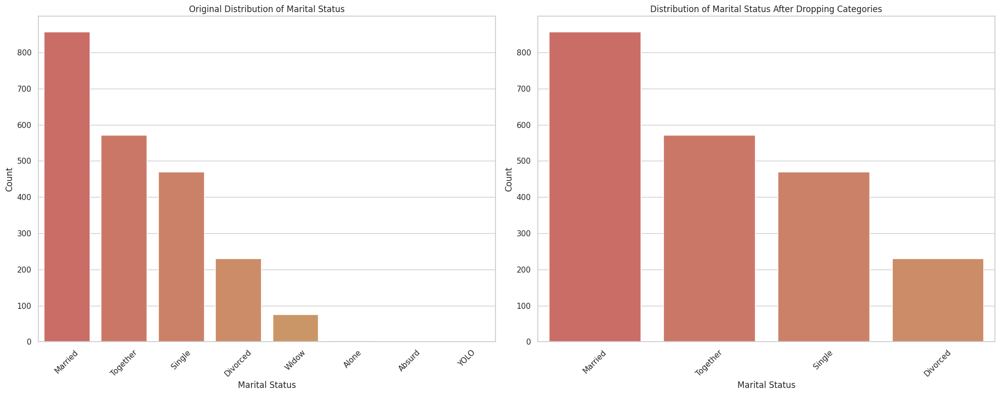

Original distribution of 'Marital_Status':
Marital_Status
Married     857
Together    572
Single      470
Divorced    231
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

Distribution of 'Marital_Status' after dropping categories:
Marital_Status
Married     857
Together    572
Single      470
Divorced    231
Name: count, dtype: int64


In [29]:
original_counts = df['Marital_Status'].value_counts()
categories_to_drop = ['Absurd', 'Alone', 'YOLO', 'Widow']
df_dropped = df[~df['Marital_Status'].isin(categories_to_drop)]
dropped_counts = df_dropped['Marital_Status'].value_counts()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
# Original distribution
sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette=cm)
axes[0].set_title('Original Distribution of Marital Status')
axes[0].set_xlabel('Marital Status')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)
# Distribution after dropping categories
sns.barplot(x=dropped_counts.index, y=dropped_counts.values, ax=axes[1], palette=cm)
axes[1].set_title('Distribution of Marital Status After Dropping Categories')
axes[1].set_xlabel('Marital Status')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()
print("Original distribution of 'Marital_Status':")
print(original_counts)
print("\nDistribution of 'Marital_Status' after dropping categories:")
print(dropped_counts)

**Justifiation for Dropping Categories of 'Marital_Status'** :
- The distribution of 'Martial_Status' after dropping categories has more balanced distribution for more robust analysis due to the fact that the categories 'Widow', 'Alone', 'Absurd', and 'YOLO' have significantly lower counts compared to other categories.


In [30]:
drop_categories = ['Widow','Alone','Absurd', 'YOLO']
df = df[~df['Marital_Status'].isin(drop_categories)]

In [31]:
print("Updated Distribution:\n", df['Marital_Status'].value_counts())

Updated Distribution:
 Marital_Status
Married     857
Together    572
Single      470
Divorced    231
Name: count, dtype: int64


In [32]:
df['Education'].value_counts()

,count
Education,
Graduation,1079
PhD,453
Master,352
2n Cycle,193
Basic,53


<ipython-input-33-260f71cae35e>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['Education'].value_counts().index, y=df['Education'].value_counts(), palette=cm)


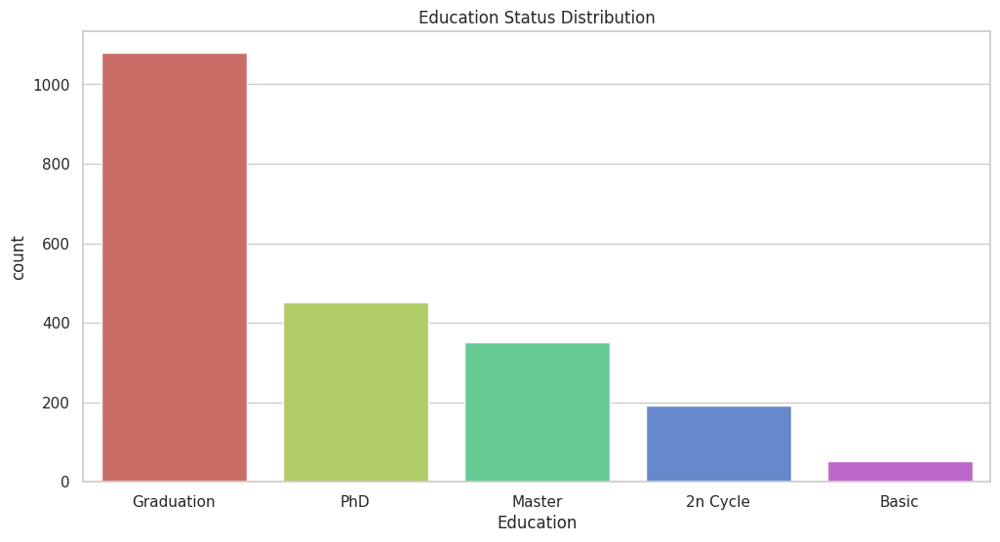

In [33]:
cm=sns.color_palette('hls', len(df['Education'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['Education'].value_counts().index, y=df['Education'].value_counts(), palette=cm)
ax.set(xlabel='Education', ylabel='count', title='Education Status Distribution')
plt.show()

In [34]:
# Calculate the count of each education level
education_counts = df['Education'].value_counts()

# Calculate the proportions (percentage) of each education level
education_proportions = (education_counts / len(df)) * 100

# Display the proportions
print("Proportions of Education Levels:")
print(education_proportions)

Proportions of Education Levels:
Education
Graduation    50.657277
PhD           21.267606
Master        16.525822
2n Cycle       9.061033
Basic          2.488263
Name: count, dtype: float64


In [35]:
# Before transformation
print("Original Distribution:\n", df['Education'].value_counts())

# Apply the transformation
transformation_categories = df['Education'].replace({
    'Graduation': 'Graduation',
    'PhD': 'Advanced Degree',
    'Master': 'Advanced Degree',
    '2n Cycle': 'Other',
    'Basic': 'Other'
})

# Count the transformed categories
transformed_distribution = transformation_categories.value_counts()

# After transformation
print("\nTransformed Distribution:\n", transformed_distribution)


Original Distribution:
 Education
Graduation    1079
PhD            453
Master         352
2n Cycle       193
Basic           53
Name: count, dtype: int64

Transformed Distribution:
 Education
Graduation         1079
Advanced Degree     805
Other               246
Name: count, dtype: int64


<ipython-input-36-6a481af3fdcb>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette='viridis')
<ipython-input-36-6a481af3fdcb>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=transformation_counts.index, y=transformation_counts.values, ax=axes[1], palette='viridis')


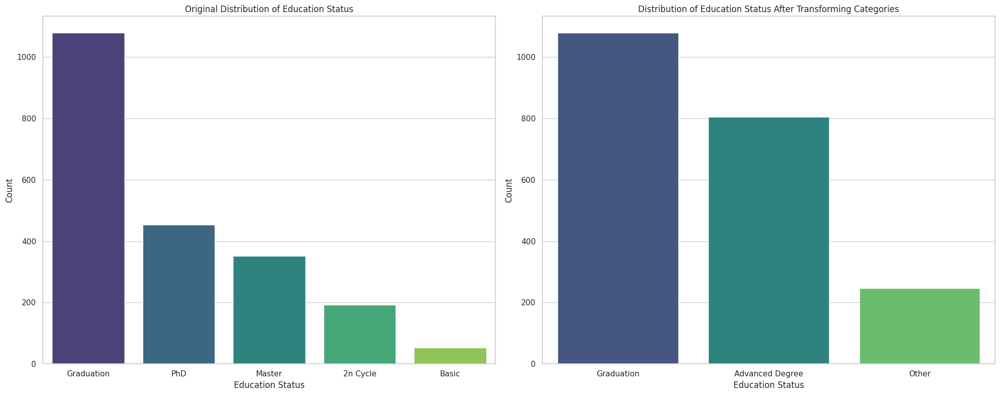

Original distribution of 'Education Status':
Education
Graduation    1079
PhD            453
Master         352
2n Cycle       193
Basic           53
Name: count, dtype: int64

Distribution of 'Education_Status' after transforming categories:
Education
Graduation         1079
Advanced Degree     805
Other               246
Name: count, dtype: int64


In [36]:
# Count the original distribution of education levels
original_counts = df['Education'].value_counts()

# Transform the education categories into 3 groups
transformation_categories = df['Education'].replace({
    'Graduation': 'Graduation',
    'PhD': 'Advanced Degree',
    'Master': 'Advanced Degree',
    '2n Cycle': 'Other',
    'Basic': 'Other'
})

# Count the transformed distribution
transformation_counts = transformation_categories.value_counts()

# Create side-by-side bar plots for comparison
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))

# Original distribution bar plot
sns.barplot(x=original_counts.index, y=original_counts.values, ax=axes[0], palette='viridis')
axes[0].set_title('Original Distribution of Education Status')
axes[0].set_xlabel('Education Status')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=0)

# Transformed distribution bar plot
sns.barplot(x=transformation_counts.index, y=transformation_counts.values, ax=axes[1], palette='viridis')
axes[1].set_title('Distribution of Education Status After Transforming Categories')
axes[1].set_xlabel('Education Status')
axes[1].set_ylabel('Count')
axes[1].tick_params(axis='x', rotation=0)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Print the distributions for verification
print("Original distribution of 'Education Status':")
print(original_counts)
print("\nDistribution of 'Education_Status' after transforming categories:")
print(transformation_counts)


**Justifiation for Transforming Categories of 'Education_Status'**
- Reducing the number of categories to adjust the inital imbalance among categories for reducing the risk of overfitting for rare categories while enhancing model performance

In [37]:
df['Education']=df['Education'].replace({'2n Cycle': 'Other', 'Basic': 'Other','PhD': 'Advanced degree', 'Master': 'Advanced degree'})

**Justification for combining educational levels:**

  - Basic and 2nd cycle were relatively assgined to low educational levels. I determined graduation as a bachelor degree, which was deviated from these elementary educational levels and decided not to merge these levels into the graduation category.
  - The proportion of these levels exceeds over 10% of the dataset and I determined this proportions are significant enough retain these levels rather than removing data to avoid the exclusion of a meaningful and substantial portion of the dataset.

In [38]:
df['Kidhome'].nunique()

3

In [39]:
df['Kidhome'].unique()

array([0, 1, 2])

In [40]:
df['Kidhome'].value_counts()

,count
Kidhome,
0,1219
1,865
2,46


<ipython-input-41-77fc1bf54dc9>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['Kidhome'].value_counts().index, y=df['Kidhome'].value_counts(), palette=cm)


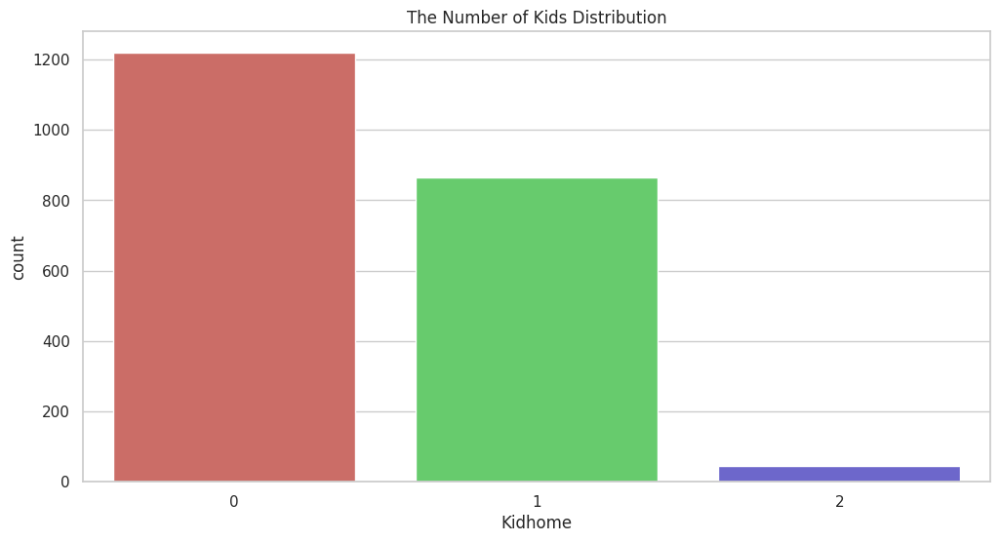

In [41]:
cm=sns.color_palette('hls', len(df['Kidhome'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['Kidhome'].value_counts().index, y=df['Kidhome'].value_counts(), palette=cm)
ax.set(xlabel='Kidhome', ylabel='count', title='The Number of Kids Distribution')
plt.show()

In [42]:
df['Teenhome'].unique()

array([0, 1, 2])

In [43]:
df['Teenhome'].nunique()

3

In [44]:
df['Teenhome'].value_counts()

,count
Teenhome,
0,1114
1,966
2,50


<ipython-input-45-7a96f136b441>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['Teenhome'].value_counts().index, y=df['Teenhome'].value_counts(), palette=cm)


[Text(0.5, 0, 'Teenhome'),
 Text(0, 0.5, 'count'),
 Text(0.5, 1.0, 'The Number of Teenagers Distribution')]

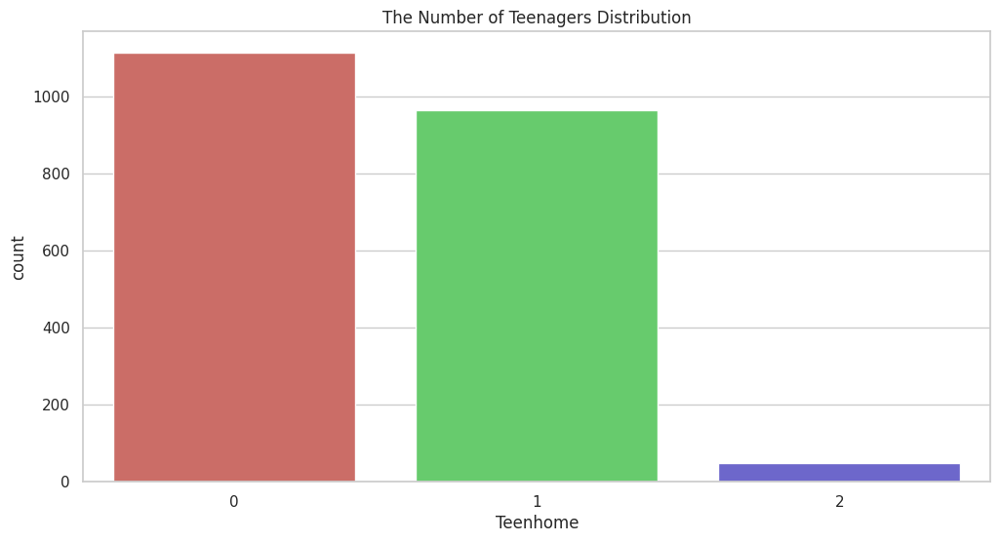

In [45]:
cm=sns.color_palette('hls', len(df['Teenhome'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['Teenhome'].value_counts().index, y=df['Teenhome'].value_counts(), palette=cm)
ax.set(xlabel='Teenhome', ylabel='count', title='The Number of Teenagers Distribution')

In [46]:
# Create a new column 'Has_Kids_Teenagers' with values 'Yes' or 'No'
df['Has_Kids_Teenagers'] = df.apply(lambda row: 'Yes' if row['Kidhome'] > 0 or row['Teenhome'] > 0 else 'No', axis=1)
df.head()

,ID,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,age,Has_Kids_Teenagers
0,5524,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,67,No
1,2174,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,70,Yes
2,4141,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,59,No
3,6182,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,40,Yes
4,5324,Advanced degree,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,43,Yes


In [47]:
df['Has_Kids_Teenagers'].value_counts()

,count
Has_Kids_Teenagers,
Yes,1526
No,604


<ipython-input-48-5a1d6ef5b175>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['Has_Kids_Teenagers'].value_counts().index, y=df['Has_Kids_Teenagers'].value_counts(), palette=cm)


[Text(0.5, 0, 'Has Kids or Teenagers'),
 Text(0, 0.5, 'Count'),
 Text(0.5, 1.0, 'The Distribution of Households with Kids or Teenagers')]

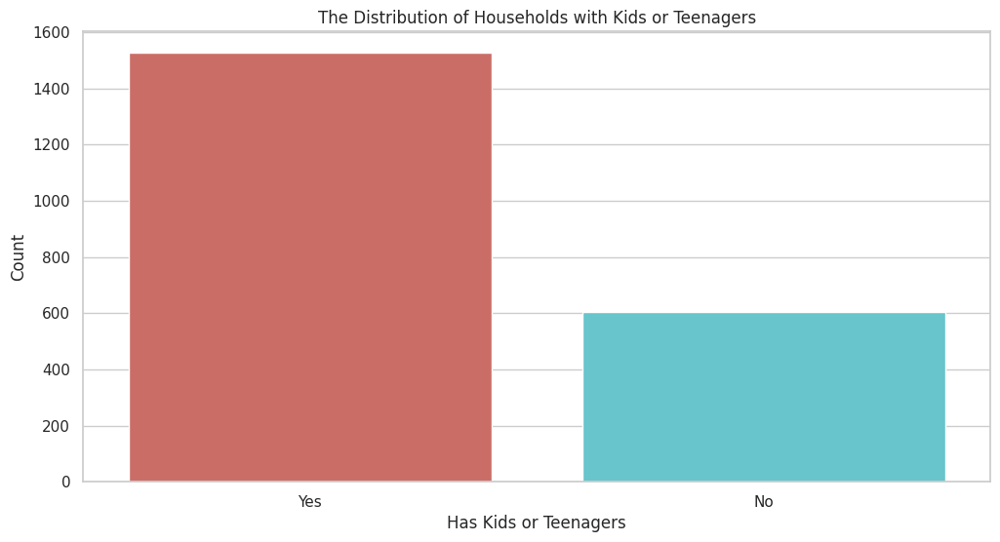

In [48]:
cm=sns.color_palette('hls', len(df['Has_Kids_Teenagers'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['Has_Kids_Teenagers'].value_counts().index, y=df['Has_Kids_Teenagers'].value_counts(), palette=cm)
ax.set(xlabel='Has Kids or Teenagers', ylabel='Count', title='The Distribution of Households with Kids or Teenagers')

In [49]:
# Summary statistics for the new column 'Has_Kids_Teenagers'
has_kids_teenagers_summary = df['Has_Kids_Teenagers'].value_counts()
print("Has_Kids_Teenagers Summary:")
print(has_kids_teenagers_summary)

# Contingency table for 'Has_Kids_Teenagers' and 'Response'
contingency_table = pd.crosstab(df['Has_Kids_Teenagers'], df['Response'])
print("\nContingency Table:")
print(contingency_table)

# Chi-square test to check the significance
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
print("\nChi-square Statistic:", chi2)
print("p-value:", p)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)

Has_Kids_Teenagers Summary:
Has_Kids_Teenagers
Yes    1526
No      604
Name: count, dtype: int64

Contingency Table:
Response               0    1
Has_Kids_Teenagers           
No                   446  158
Yes                 1372  154

Chi-square Statistic: 88.0711870408844
p-value: 6.314070133117859e-21
Degrees of Freedom: 1
Expected Frequencies:
[[ 515.52676056   88.47323944]
 [1302.47323944  223.52676056]]


**Justification for creating a new variable 'Has_Kids_Teenagers'**
1. Imbalance Among Values:
- The original columns 'Kidhome' and 'Teenhome' exhibit significant imbalance. Specifically, the value '2' has the smallest frequency. The imbalance can introduce bias into modeling processes, as models may overfit or underfit these rare occurrences.
2. Lack of Clear Age Distinction:
- The dataset does not provide clear age ranges to distinguish between kids and teenagers. This ambiguity can lead to significant errors when summing the 'Kidhone' and 'Teenhome' values, as some respondents may have checked both columns even if they have only one child. This overlap complicates the analysis and increases the risk of inaccuracies.
3. Creating a Simplified Categorical Column:
- To address the isseus of imbalance and overlapping, a new categorical column 'Has_Kids_Teenagers' was created with two values: 'Yes' and 'No'.
 - 'Yes' indicates households with either kids or teenagers.
 - 'No' indicates households with neither kids or teenagers.
4. Statistical Significance:
- The new column 'Has_Kids_Teenagers' shows a statistically significant association with the response variable due to the p-value indicating the presence of kids or teenagers in a household has a meaningful impact on the customers' response.

In [50]:
# Drop 'Kidhome' and 'Teenhome' columns from the dataset
df = df.drop(columns=['Kidhome', 'Teenhome'])

In [51]:
# Dt_Customer: Date of customer's enrollment with the company
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')
df['length']=2024-df['Dt_Customer'].dt.year

In [52]:
df['length'].value_counts()

,count
length,
11,1134
10,530
12,466


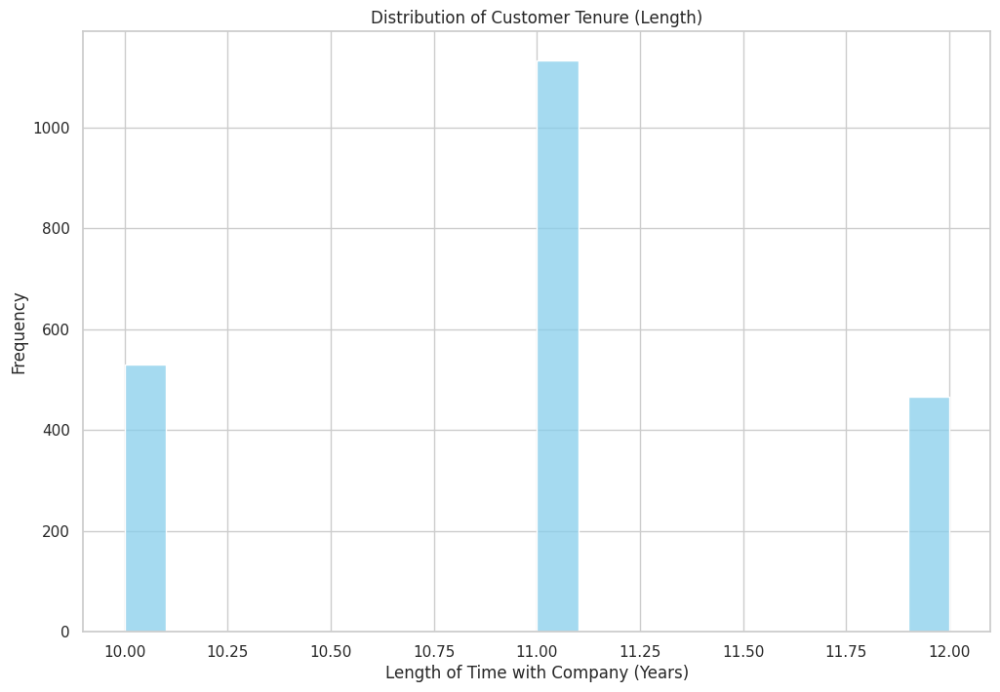

In [53]:
plt.figure(figsize=(12, 8))
sns.histplot(df['length'], bins=20, kde=False, color='skyblue')
plt.title('Distribution of Customer Tenure (Length)')
plt.xlabel('Length of Time with Company (Years)')
plt.ylabel('Frequency')
plt.show()

**The Distribution of Bar Plot**
1. Categories: The bar plot shows three distinct categories for the tenure length: 10years, 11 years, and 12 years.
2. Frequencies:
- 11 years: The highest frequency, with 1136 customers
- 10 years: The next highest frequency with 531 customers
- 12 years: The lowest frequency among the three, with 466 customers.

- This distribution suggests that most customers have been with the company for around 11 years, followed by 10 years and then 12 years. The sharp peak at these sepcific years indicate that a significant portion of the customers base joined the company within a specific time frame, likely around 2012 to 2014.

In [54]:
df=df.drop(columns=['Dt_Customer'], axis=1)

<ipython-input-55-a14d9091f965>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumDealsPurchases'].value_counts().index, y=df['NumDealsPurchases'].value_counts(), palette=cm)


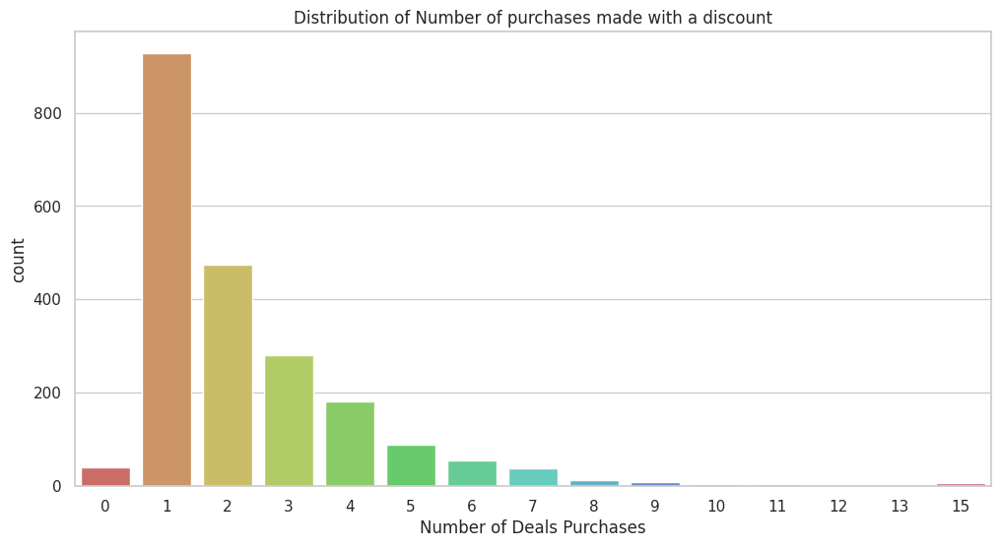

In [55]:
cm=sns.color_palette('hls', len(df['NumDealsPurchases'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumDealsPurchases'].value_counts().index, y=df['NumDealsPurchases'].value_counts(), palette=cm)
ax.set(xlabel='Number of Deals Purchases', ylabel='count', title='Distribution of Number of purchases made with a discount')
plt.show()

<ipython-input-56-3d48532fadfa>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumDealsPurchases'], palette='viridis')


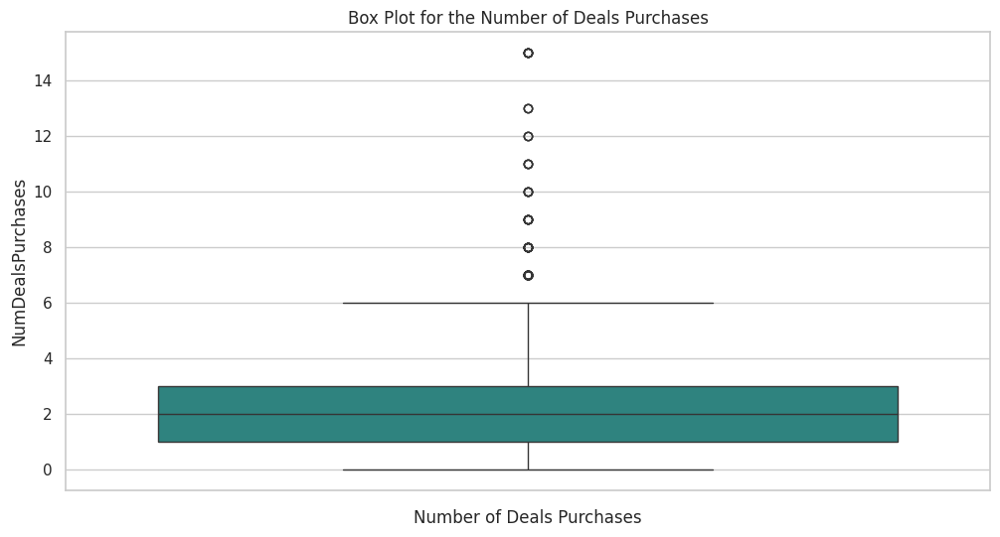

Q1 (25th percentile): 1.0
Median (50th percentile): 2.0
Q3 (75th percentile): 3.0
IQR (Interquartile Range): 2.0
Lower Whisker: -2.0
Upper Whisker: 6.0


In [56]:
# Plotting the Box Plot for 'NumDealsPurchases'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumDealsPurchases'], palette='viridis')
plt.title('Box Plot for the Number of Deals Purchases')
plt.xlabel('Number of Deals Purchases')
plt.show()

# Calculating Quartiles and IQR for 'NumDealsPurchases'
q1 = df['NumDealsPurchases'].quantile(0.25)
median = df['NumDealsPurchases'].quantile(0.50)
q3 = df['NumDealsPurchases'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumDealsPurchases'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")


Box Plot of 'NumDealsPurchases' variable.

- Q1 is 1.0 meaning that 25% of customers made 1 or fewer discounted purchases.
- Median is 2.0 indicating that customers made 2 or fewer discounted purchases
- Whiskers indicates that the majority of the purchases made with a discount range between 0 and 6.


<ipython-input-57-e05f85305118>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumWebPurchases'].value_counts().index, y=df['NumWebPurchases'].value_counts(), palette=cm)


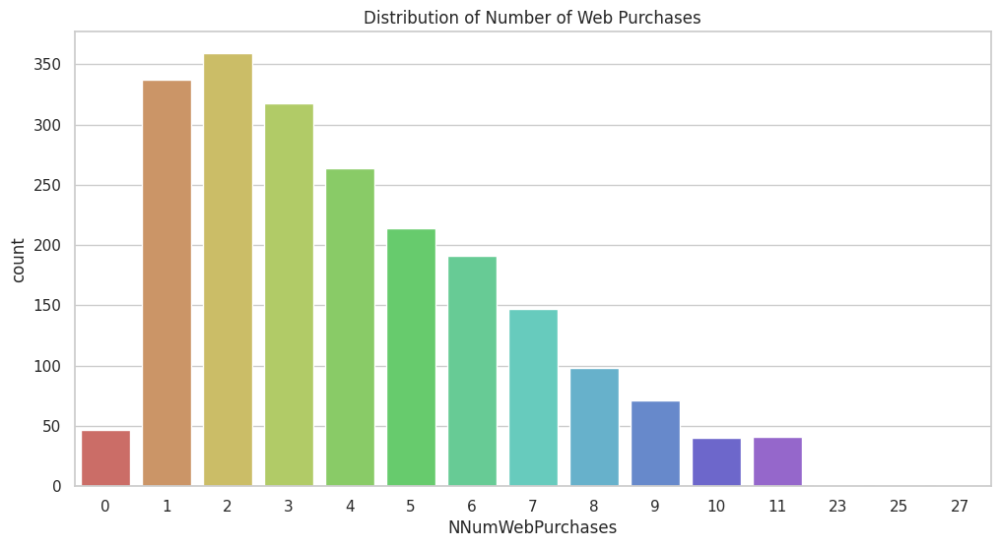

In [57]:
cm=sns.color_palette('hls', len(df['NumWebPurchases'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumWebPurchases'].value_counts().index, y=df['NumWebPurchases'].value_counts(), palette=cm)
ax.set(xlabel='NNumWebPurchases', ylabel='count', title='Distribution of Number of Web Purchases')
plt.show()

<ipython-input-58-f5e04c525c57>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumWebPurchases'], palette='viridis')


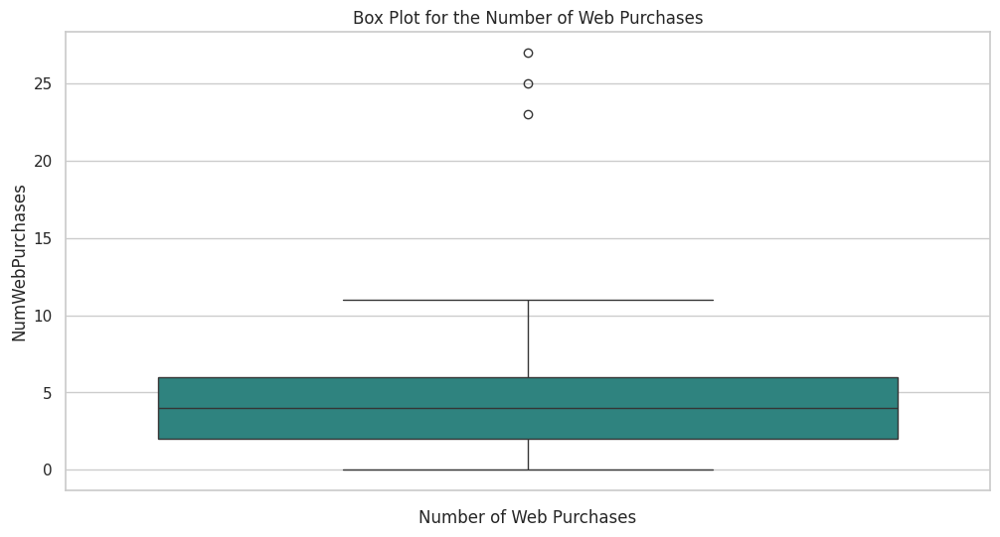

Q1 (25th percentile): 2.0
Median (50th percentile): 4.0
Q3 (75th percentile): 6.0
IQR (Interquartile Range): 4.0
Lower Whisker: -4.0
Upper Whisker: 12.0


In [58]:
# Plotting the Box Plot for 'NumWebPurchases'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumWebPurchases'], palette='viridis')
plt.title('Box Plot for the Number of Web Purchases')
plt.xlabel('Number of Web Purchases')
plt.show()

# Calculating Quartiles and IQR for 'NumWebPurchases'
q1 = df['NumWebPurchases'].quantile(0.25)
median = df['NumWebPurchases'].quantile(0.50)
q3 = df['NumWebPurchases'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumWebPurchases'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")


<ipython-input-59-5af4a949e5fb>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumCatalogPurchases'].value_counts().index, y=df['NumCatalogPurchases'].value_counts(), palette=cm)


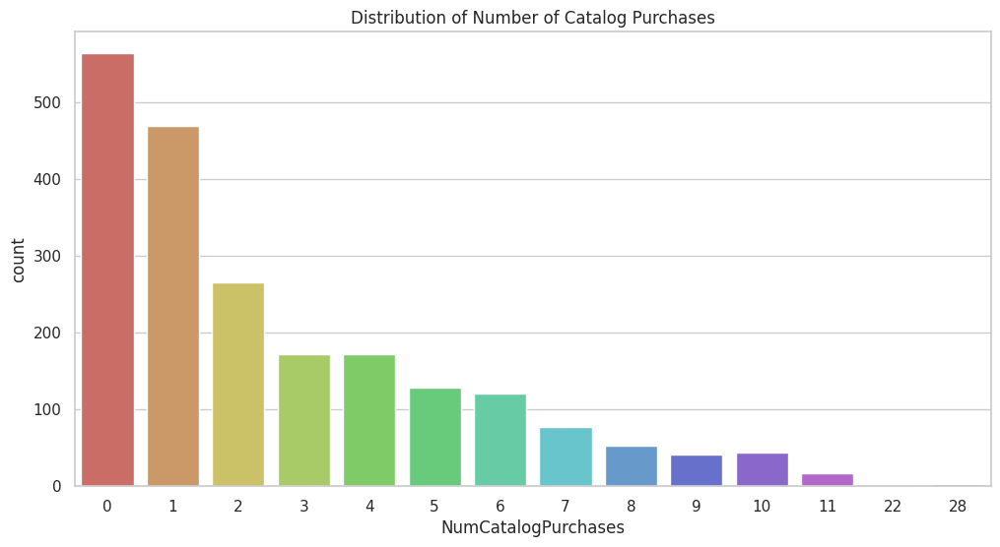

In [59]:
cm=sns.color_palette('hls', len(df['NumCatalogPurchases'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumCatalogPurchases'].value_counts().index, y=df['NumCatalogPurchases'].value_counts(), palette=cm)
ax.set(xlabel='NumCatalogPurchases', ylabel='count', title='Distribution of Number of Catalog Purchases')
plt.show()

<ipython-input-60-8c190430ef48>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumCatalogPurchases'], palette='viridis')


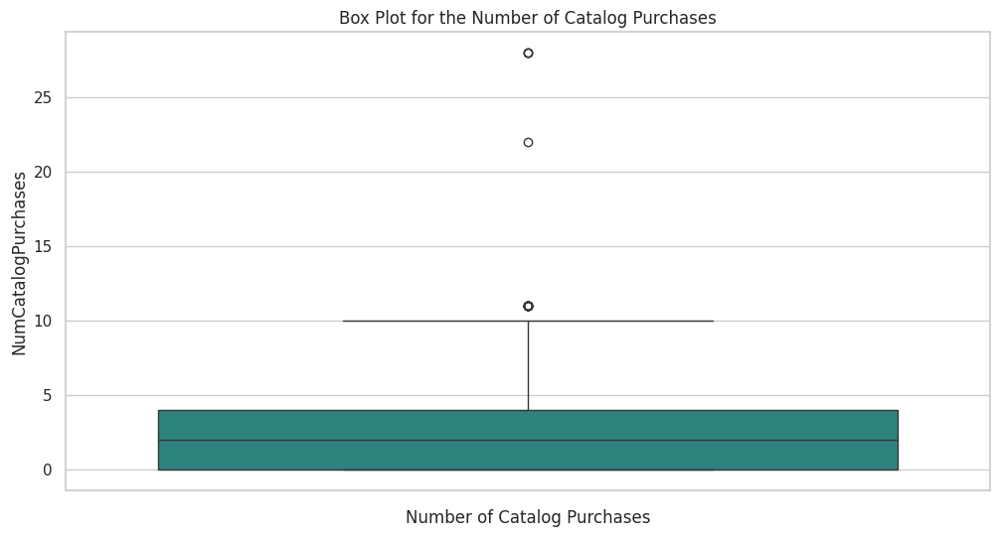

Q1 (25th percentile): 0.0
Median (50th percentile): 2.0
Q3 (75th percentile): 4.0
IQR (Interquartile Range): 4.0
Lower Whisker: -6.0
Upper Whisker: 10.0


In [60]:
# Plotting the Box Plot for 'NumCatalogPurchases'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumCatalogPurchases'], palette='viridis')
plt.title('Box Plot for the Number of Catalog Purchases')
plt.xlabel('Number of Catalog Purchases')
plt.show()

# Calculating Quartiles and IQR for 'NumCatalogPurchases'
q1 = df['NumCatalogPurchases'].quantile(0.25)
median = df['NumCatalogPurchases'].quantile(0.50)
q3 = df['NumCatalogPurchases'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumCatalogPurchases'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

<ipython-input-61-cb80c6c1f32b>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumStorePurchases'].value_counts().index, y=df['NumStorePurchases'].value_counts(), palette=cm)


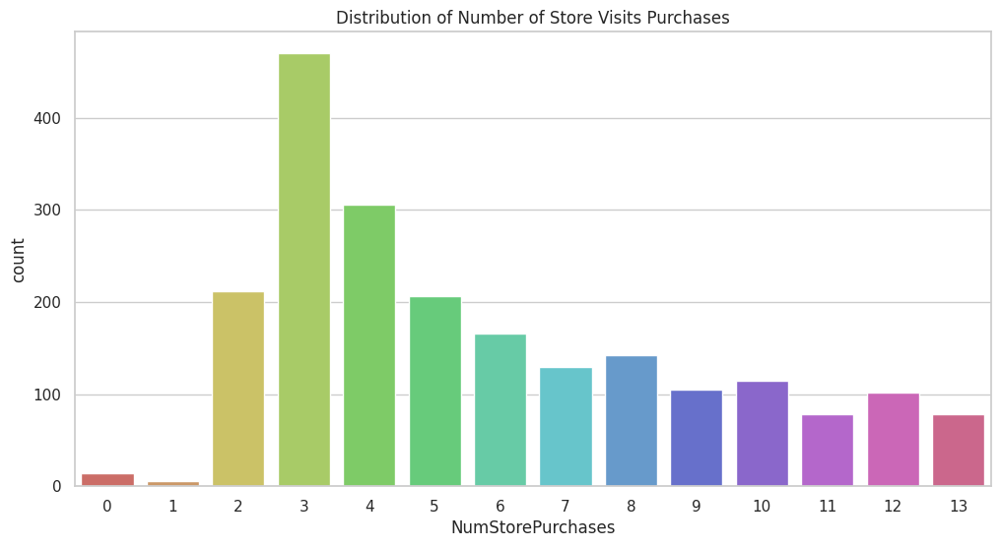

In [61]:
cm=sns.color_palette('hls', len(df['NumStorePurchases'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumStorePurchases'].value_counts().index, y=df['NumStorePurchases'].value_counts(), palette=cm)
ax.set(xlabel='NumStorePurchases', ylabel='count', title='Distribution of Number of Store Visits Purchases')
plt.show()

<ipython-input-62-296a0c781df3>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumStorePurchases'], palette='viridis')


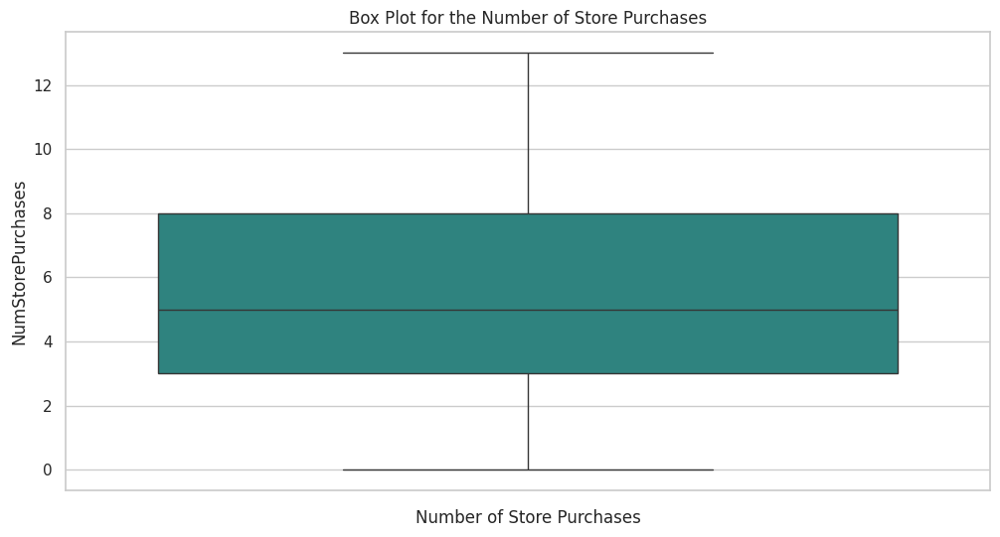

Q1 (25th percentile): 3.0
Median (50th percentile): 5.0
Q3 (75th percentile): 8.0
IQR (Interquartile Range): 5.0
Lower Whisker: -4.5
Upper Whisker: 15.5


In [62]:
# Plotting the Box Plot for 'NumStorePurchases'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumStorePurchases'], palette='viridis')
plt.title('Box Plot for the Number of Store Purchases')
plt.xlabel('Number of Store Purchases')
plt.show()

# Calculating Quartiles and IQR for 'NumStorePurchases'
q1 = df['NumStorePurchases'].quantile(0.25)
median = df['NumStorePurchases'].quantile(0.50)
q3 = df['NumStorePurchases'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumStorePurchases'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

<ipython-input-63-fdaa62211051>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.barplot(x=df['NumWebVisitsMonth'].value_counts().index, y=df['NumWebVisitsMonth'].value_counts(), palette=cm)


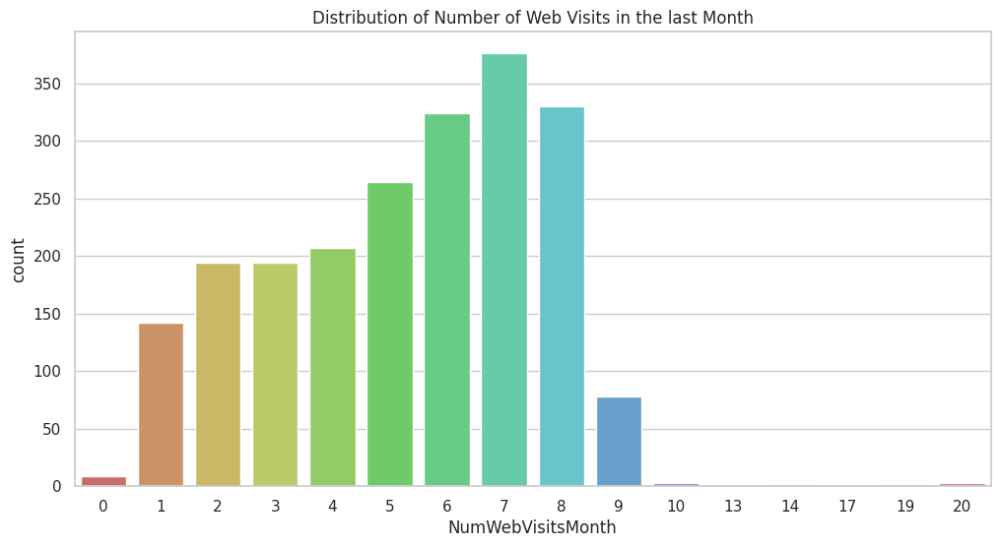

In [63]:
cm=sns.color_palette('hls', len(df['NumWebVisitsMonth'].unique()))
sns.set_theme(style='whitegrid')
plt.figure(figsize=(12, 6))
ax=sns.barplot(x=df['NumWebVisitsMonth'].value_counts().index, y=df['NumWebVisitsMonth'].value_counts(), palette=cm)
ax.set(xlabel='NumWebVisitsMonth', ylabel='count', title='Distribution of Number of Web Visits in the last Month')
plt.show()

<ipython-input-64-acee04f2fc3b>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumWebVisitsMonth'], palette='viridis')


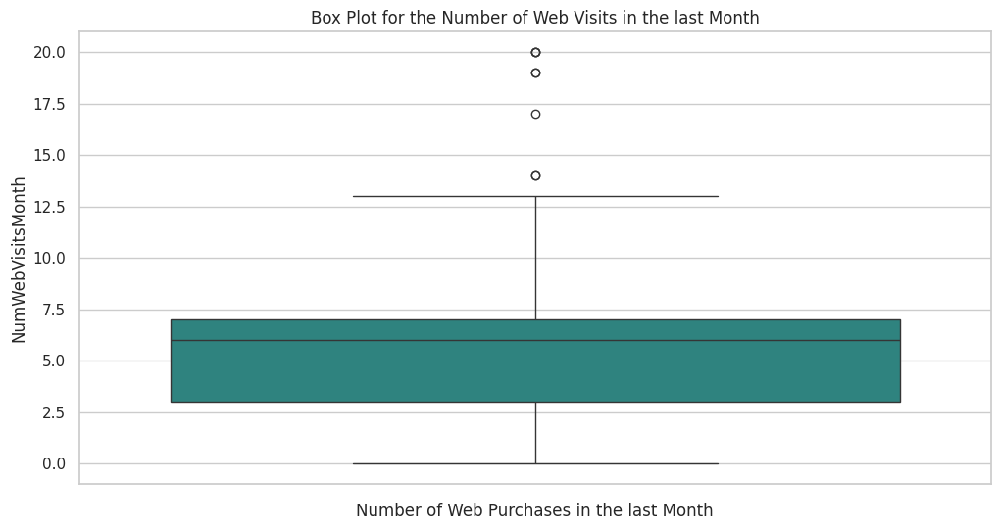

Q1 (25th percentile): 3.0
Median (50th percentile): 6.0
Q3 (75th percentile): 7.0
IQR (Interquartile Range): 4.0
Lower Whisker: -3.0
Upper Whisker: 13.0


In [64]:
# Plotting the Box Plot for 'NumWebVisitsMonth'
plt.figure(figsize=(12, 6))
sns.boxplot(y=df['NumWebVisitsMonth'], palette='viridis')
plt.title('Box Plot for the Number of Web Visits in the last Month')
plt.xlabel('Number of Web Purchases in the last Month')
plt.show()

# Calculating Quartiles and IQR for 'NumWebVisitsMonth'
q1 = df['NumWebVisitsMonth'].quantile(0.25)
median = df['NumWebVisitsMonth'].quantile(0.50)
q3 = df['NumWebVisitsMonth'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Printing the Summary Statistics for 'NumWebVisitsMonth'
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

<ipython-input-65-1938cc0ccd33>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumWebPurchases'], palette='viridis')
<ipython-input-65-1938cc0ccd33>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumCatalogPurchases'], palette='viridis')
<ipython-input-65-1938cc0ccd33>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['NumStorePurchases'], palette='viridis')
<ipython-input-65-1938cc0ccd33>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable 

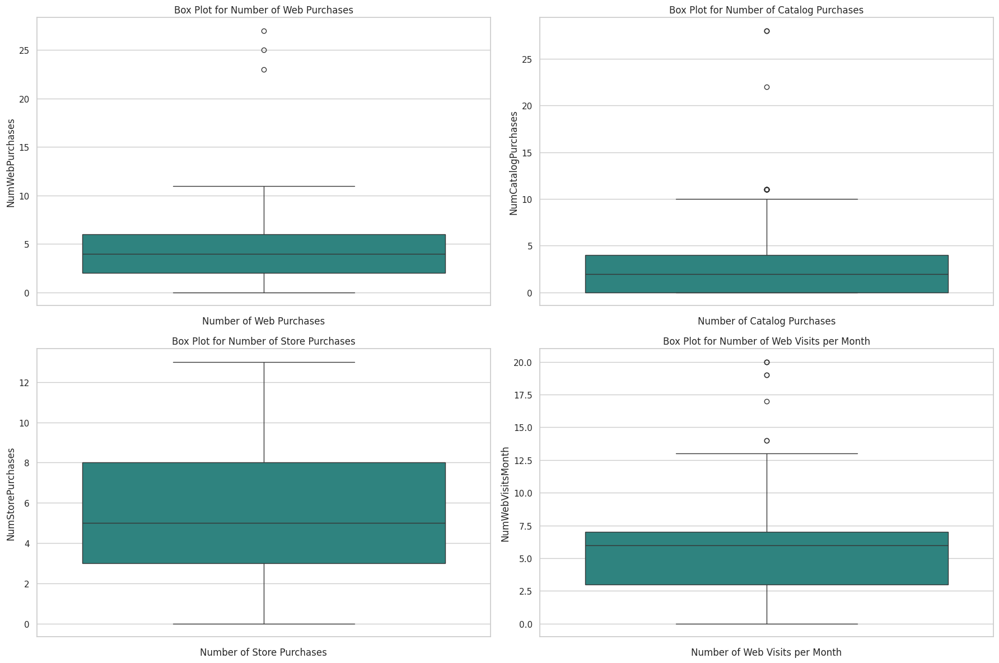

In [65]:
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
sns.boxplot(y=df['NumWebPurchases'], palette='viridis')
plt.title('Box Plot for Number of Web Purchases')
plt.xlabel('Number of Web Purchases')

plt.subplot(2, 2, 2)
sns.boxplot(y=df['NumCatalogPurchases'], palette='viridis')
plt.title('Box Plot for Number of Catalog Purchases')
plt.xlabel('Number of Catalog Purchases')

plt.subplot(2, 2, 3)
sns.boxplot(y=df['NumStorePurchases'], palette='viridis')
plt.title('Box Plot for Number of Store Purchases')
plt.xlabel('Number of Store Purchases')

plt.subplot(2, 2, 4)
sns.boxplot(y=df['NumWebVisitsMonth'], palette='viridis')
plt.title('Box Plot for Number of Web Visits per Month')
plt.xlabel('Number of Web Visits per Month')

plt.tight_layout()
plt.show()

**Disparity between Website Traffic and Online Purchases**
- There is a disparity betwen website traffic and online purchases. The higher number of website visits in the last month indicates the number of people visiting the website is growing, but it does not increase the conversion rate of online purchases.

**Preference for In-Store Shopping**
- The box plot for 'NumStorePurchases' shows higher median and upper quartiles compared to other methods for purchases suggest that customers still prefer in-store shoppings.

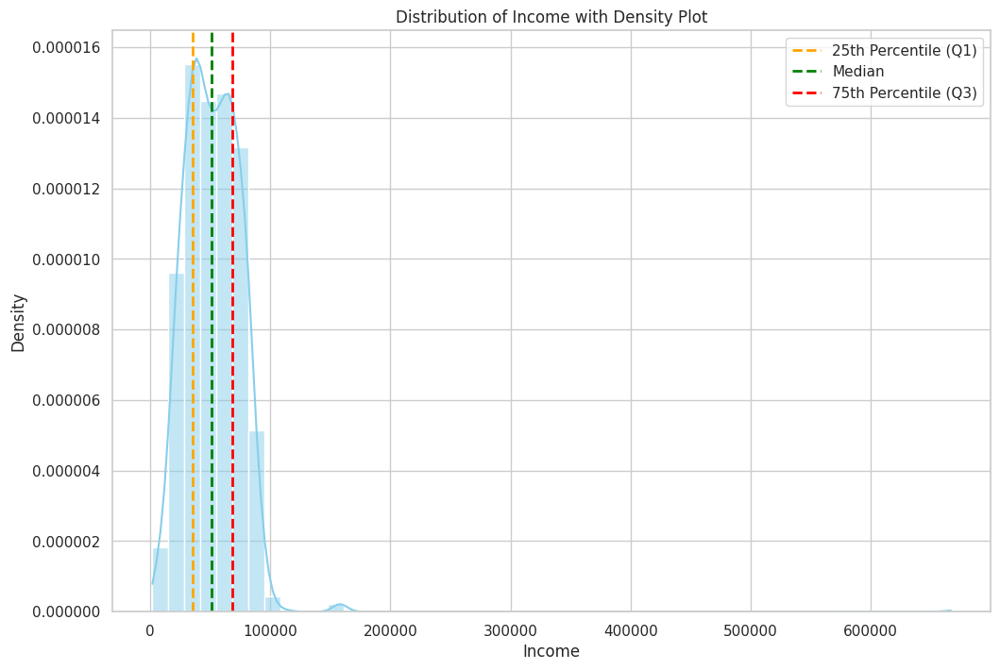

In [66]:
# Calculate quartiles
q1 = df['Income'].quantile(0.25)
median = df['Income'].quantile(0.50)
q3 = df['Income'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Create a figure with subplots
plt.figure(figsize=(12, 8))
sns.histplot(df['Income'], stat="density", kde=True, bins=50, color='skyblue')  # Adjust aspect ratio and use histplot for continuous data

# Plot quartile lines
plt.axvline(q1, color='orange', linestyle='dashed', linewidth=2, label='25th Percentile (Q1)')
plt.axvline(median, color='green', linestyle='dashed', linewidth=2, label='Median')
plt.axvline(q3, color='red', linestyle='dashed', linewidth=2, label='75th Percentile (Q3)')

# Formatting the plot
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Income with Density Plot')
plt.xlabel('Income')
plt.ylabel('Density')
plt.legend()



<ipython-input-67-d656ffd720dc>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['Income'], palette='viridis')


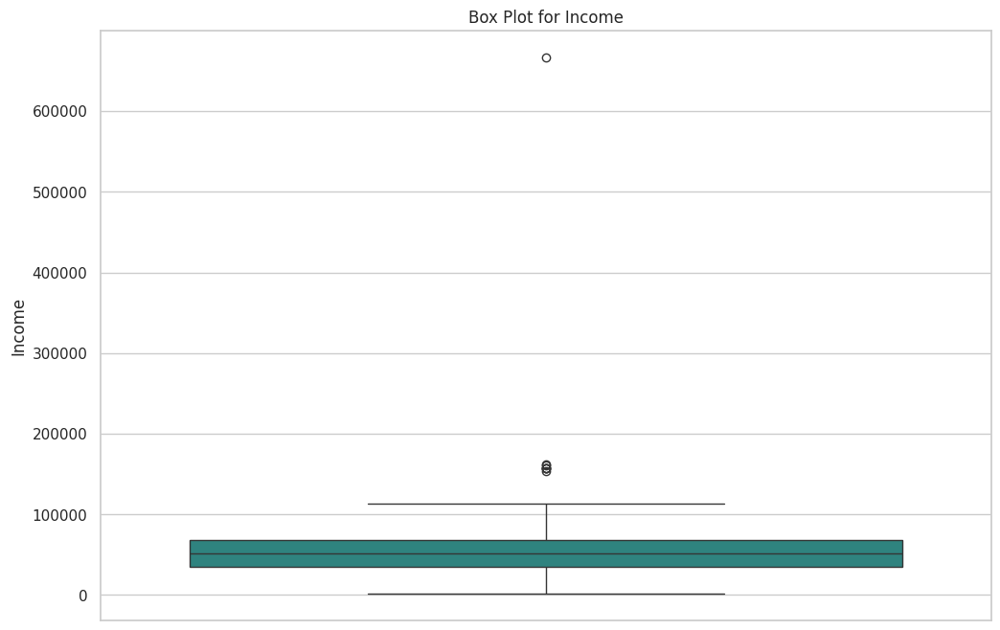

Q1 (25th percentile): 34936.5
Median (50th percentile): 51132.5
Q3 (75th percentile): 68487.0
IQR (Interquartile Range): 33550.5
Lower Whisker: -15389.25
Upper Whisker: 118812.75


In [67]:
# Calculate quartiles
q1 = df['Income'].quantile(0.25)
median = df['Income'].quantile(0.50)
q3 = df['Income'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Plotting the Box Plot for Income
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['Income'], palette='viridis')

# Adding titles and labels
plt.title('Box Plot for Income')
plt.ylabel('Income')
plt.xlabel('')

# Show plot
plt.show()

# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

**Income distribution Insights**
- Compared to typical heavily right-skewed income distribution, the income distribution of this dataset has shown a more balanced distribution with significant number of middle-class individuals. The income for the half of customers ranges from \$35,303 to \$68,522 that might be considered as middle-class income and the median income is \$51,381.

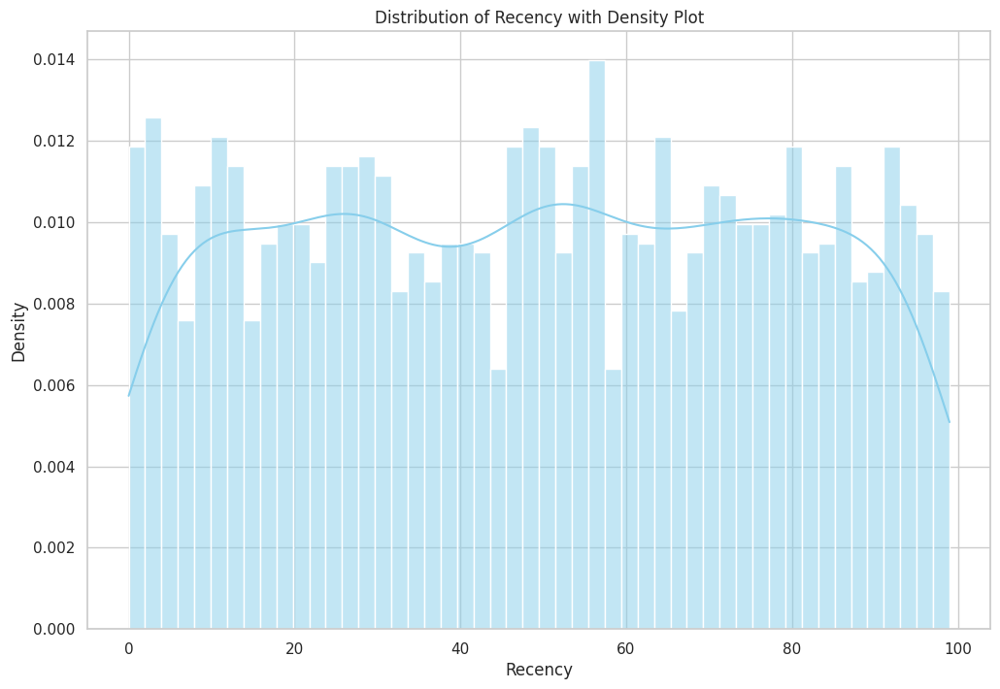

In [68]:
plt.figure(figsize=(12, 8))
sns.histplot(df['Recency'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Recency with Density Plot')
plt.xlabel('Recency')
plt.ylabel('Density')
plt.show()

**Characteristics of the Distribution of Recency:**
1. Lack of typical patterns:
- There is any clear peaks or patterns on the bar plot indicating there is not dominant recency values where most customers are clustered.
- Instead, the recency values are spread out across a wide range, suggesting diverse customer behavior.
2. Varied Distribution:
- The heights of the bars vary significantly, showing that customers have made their last purchases at many different times rather than clustering around a few sepcific recency values.

<ipython-input-69-bdb98dafbe5c>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['Recency'], palette='viridis')


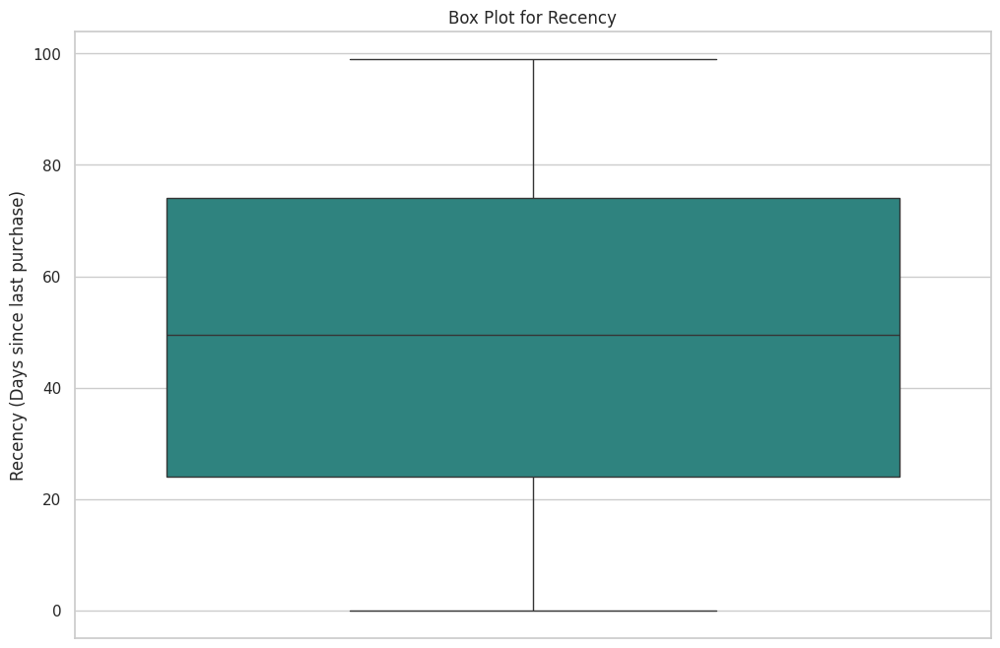

Q1 (25th percentile): 24.0
Median (50th percentile): 49.5
Q3 (75th percentile): 74.0
IQR (Interquartile Range): 50.0
Lower Whisker: -51.0
Upper Whisker: 149.0


In [69]:
# Calculate quartiles
q1 = df['Recency'].quantile(0.25)
median = df['Recency'].quantile(0.50)
q3 = df['Recency'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

plt.figure(figsize=(12, 8))
sns.boxplot(y=df['Recency'], palette='viridis')
plt.title('Box Plot for Recency')
plt.ylabel('Recency (Days since last purchase)')
plt.xlabel('')
plt.show()

# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

**The Interpretation for the Box Plot for Recency**
1. Q1: 24.0
- 25% of the customers made their last purchase within the last 24 days.
- This result indicated the quarter of the customer base has very recent purchase activity.
2. Median: 49.0
- 50% of the customers made their last purchase within the last 49 days.
- The medain recency is 49 days, indicating that the typical customer last purchased about a month and a half ago.
3. The box spans from Q1 (24 days) to Q3 (74 days), indicating that the middle 50% of customers made their last purchase within the last 50-day range.
4. A wider box width that the middle 50% of the customeres hvae a wide range of recency values, suggesting varied engagement patterns.

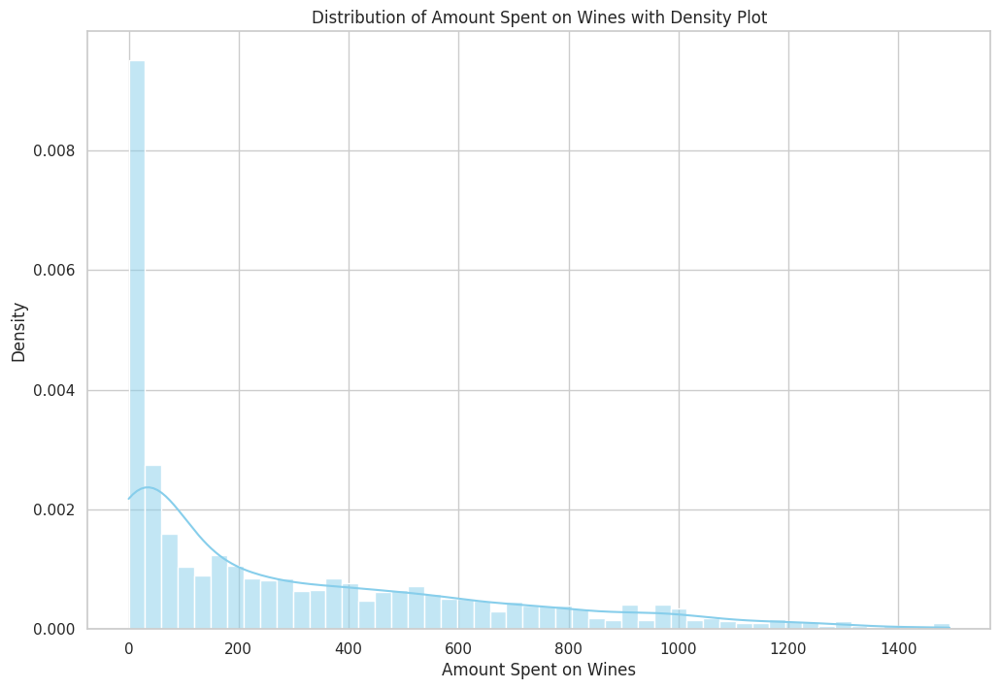

In [70]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntWines'], stat="density", kde=True, bins=50, color='skyblue')  # Use histplot for single plot
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount Spent on Wines with Density Plot')
plt.xlabel('Amount Spent on Wines')
plt.ylabel('Density')
plt.show()

<ipython-input-71-3692707bfa61>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntWines'], palette='viridis')


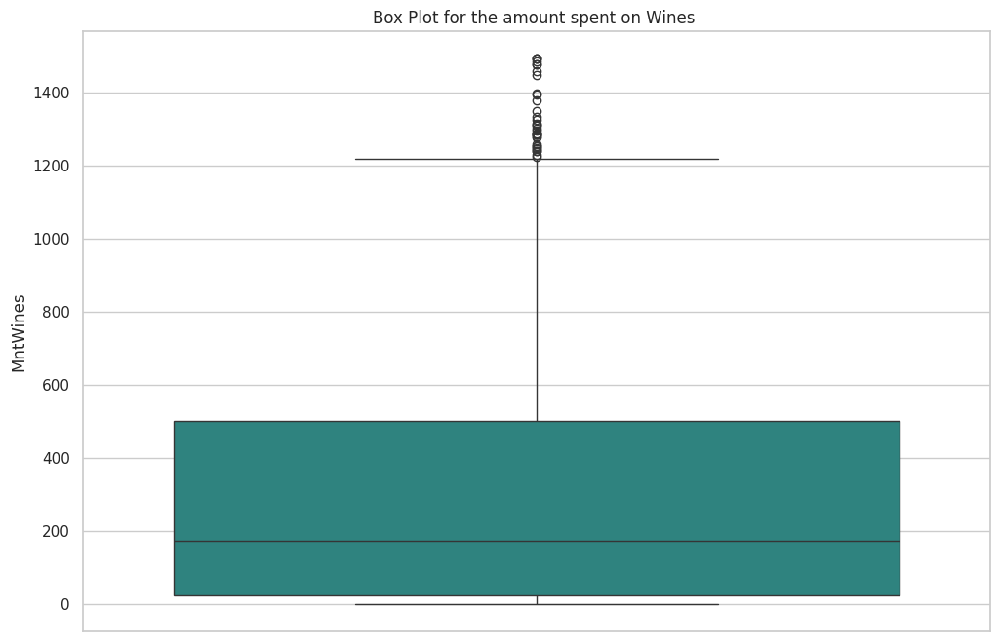

Q1 (25th percentile): 23.0
Median (50th percentile): 172.5
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [71]:
# Calculate quartiles
q1 = df['MntWines'].quantile(0.25)
median = df['MntWines'].quantile(0.50)
q3 = df['MntWines'].quantile(0.75)
iqr = q3 - q1
lower_whisker = q1 - 1.5 * iqr
upper_whisker = q3 + 1.5 * iqr

# Plotting the Box Plot for Income
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntWines'], palette='viridis')

# Adding titles and labels
plt.title('Box Plot for the amount spent on Wines ')
plt.ylabel('MntWines')
plt.xlabel('')

# Show plot
plt.show()

# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

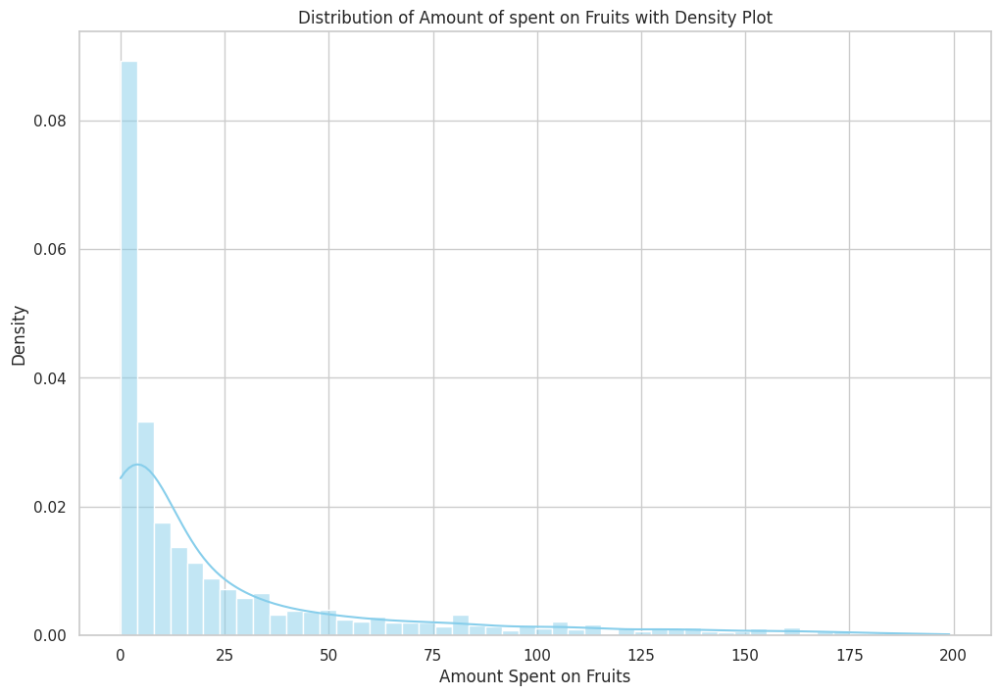

In [72]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntFruits'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Fruits with Density Plot')
plt.xlabel('Amount Spent on Fruits')
plt.ylabel('Density')
plt.show()

<ipython-input-73-d573c03a2269>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntFruits'], palette='viridis')


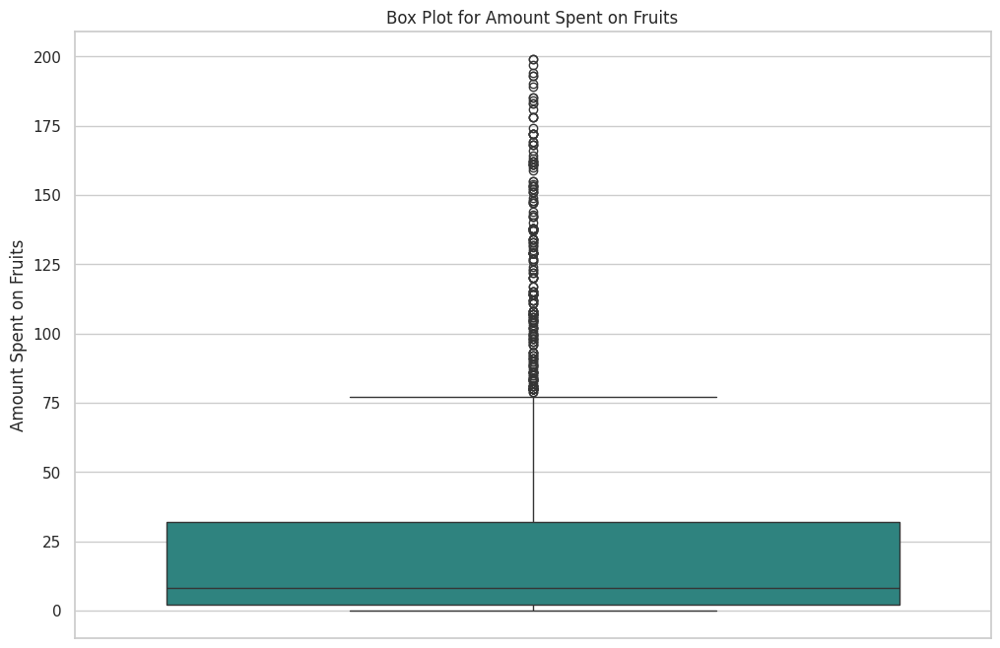

Q1 (25th percentile): 23.0
Median (50th percentile): 172.5
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [73]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntFruits'], palette='viridis')
plt.title('Box Plot for Amount Spent on Fruits')
plt.ylabel('Amount Spent on Fruits')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

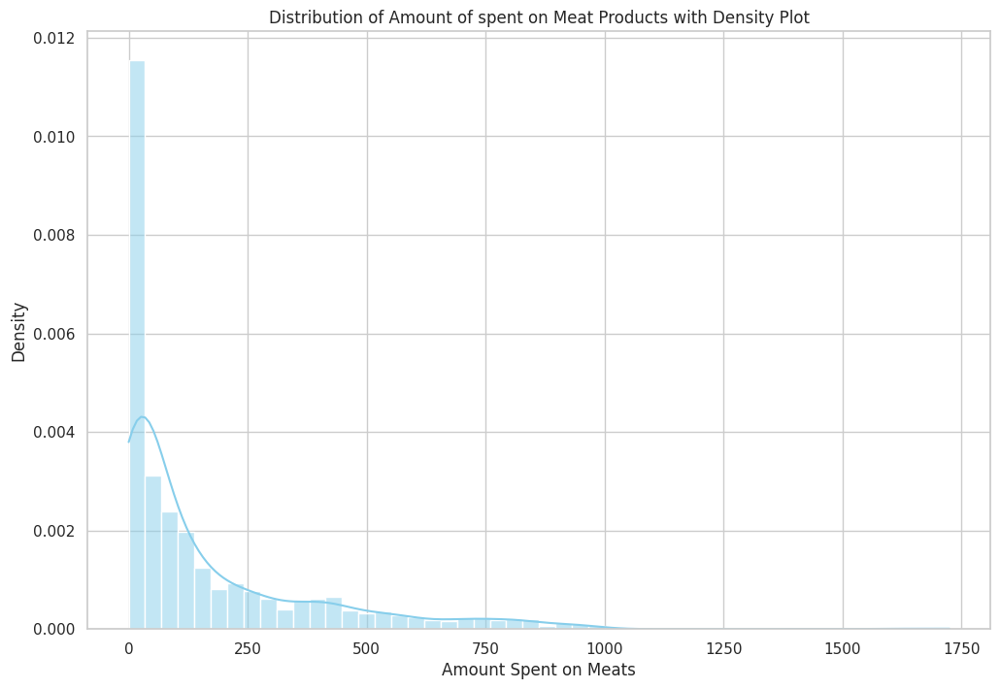

In [74]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntMeatProducts'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Meat Products with Density Plot')
plt.xlabel('Amount Spent on Meats')
plt.ylabel('Density')
plt.show()

<ipython-input-75-69735651005d>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntMeatProducts'], palette='viridis')


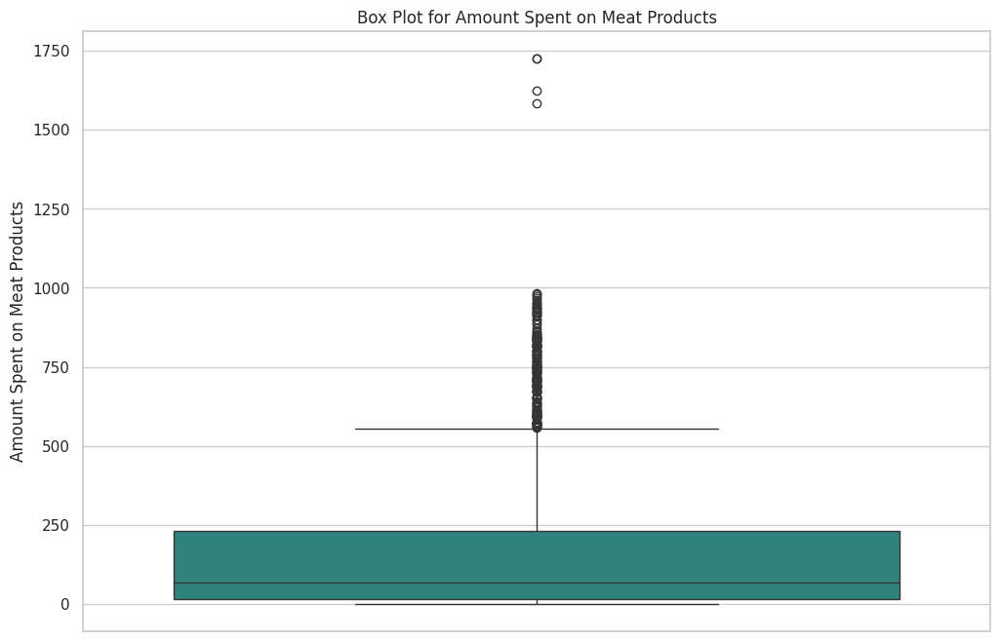

Q1 (25th percentile): 23.0
Median (50th percentile): 172.5
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [75]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntMeatProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Meat Products')
plt.ylabel('Amount Spent on Meat Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

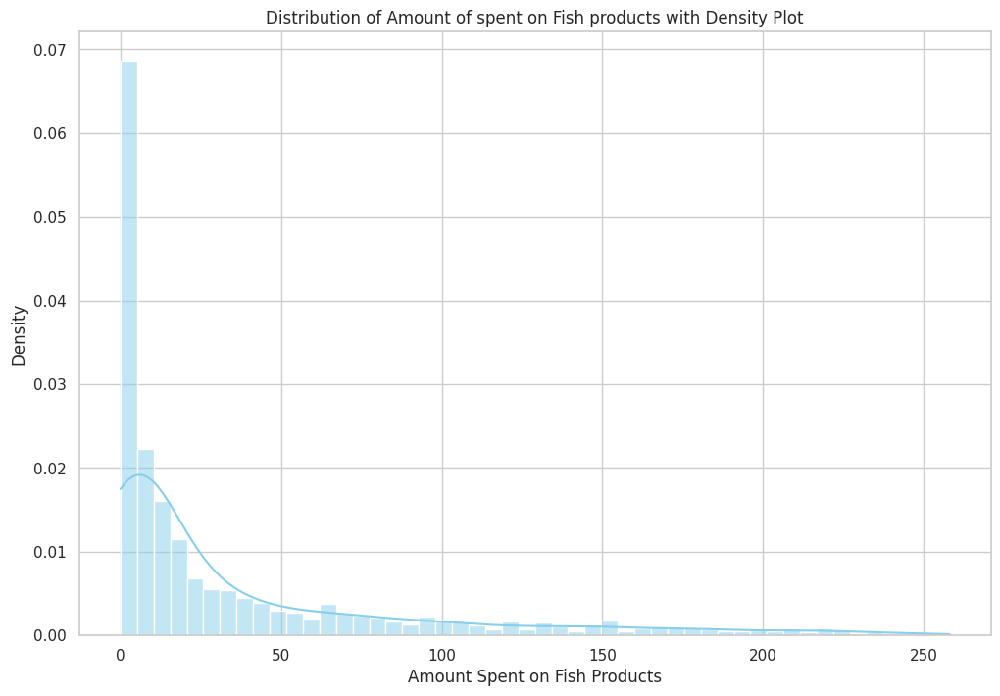

In [76]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntFishProducts'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Fish products with Density Plot')
plt.xlabel('Amount Spent on Fish Products')
plt.ylabel('Density')
plt.show()

<ipython-input-77-e4216f28f38f>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntFishProducts'], palette='viridis')


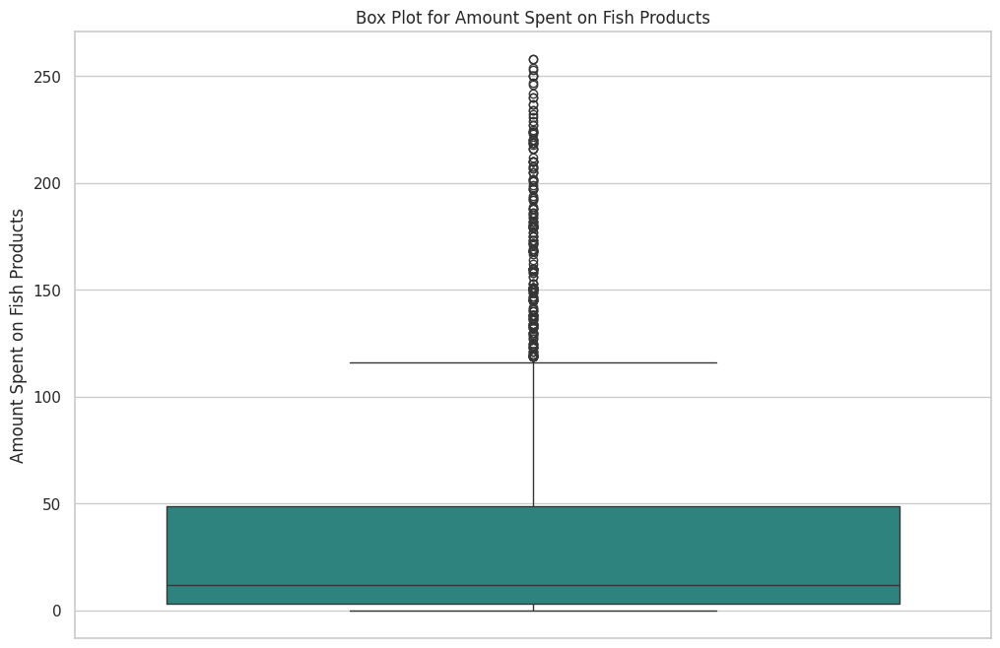

Q1 (25th percentile): 23.0
Median (50th percentile): 172.5
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [77]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntFishProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Fish Products')
plt.ylabel('Amount Spent on Fish Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

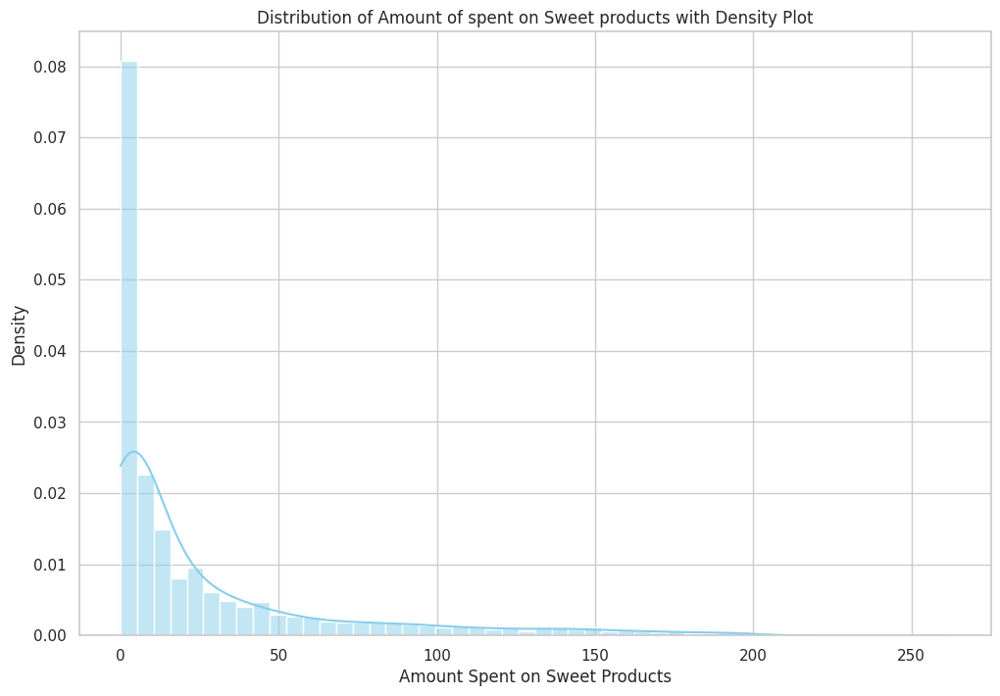

In [78]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntSweetProducts'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Sweet products with Density Plot')
plt.xlabel('Amount Spent on Sweet Products')
plt.ylabel('Density')
plt.show()

<ipython-input-79-d7da45ddc4f4>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntSweetProducts'], palette='viridis')


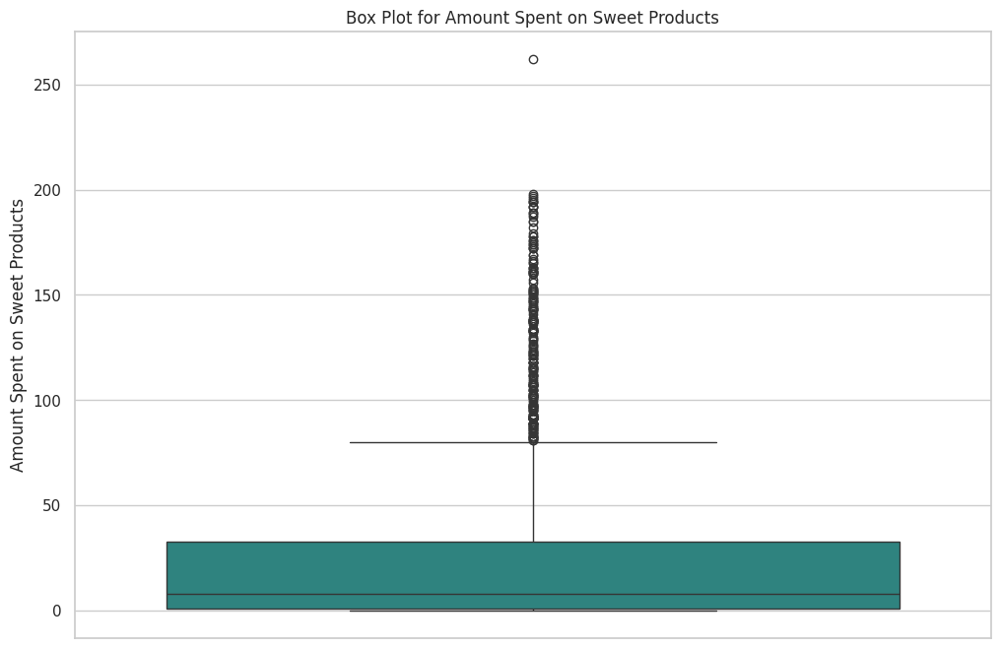

Q1 (25th percentile): 23.0
Median (50th percentile): 172.5
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [79]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntSweetProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Sweet Products')
plt.ylabel('Amount Spent on Sweet Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

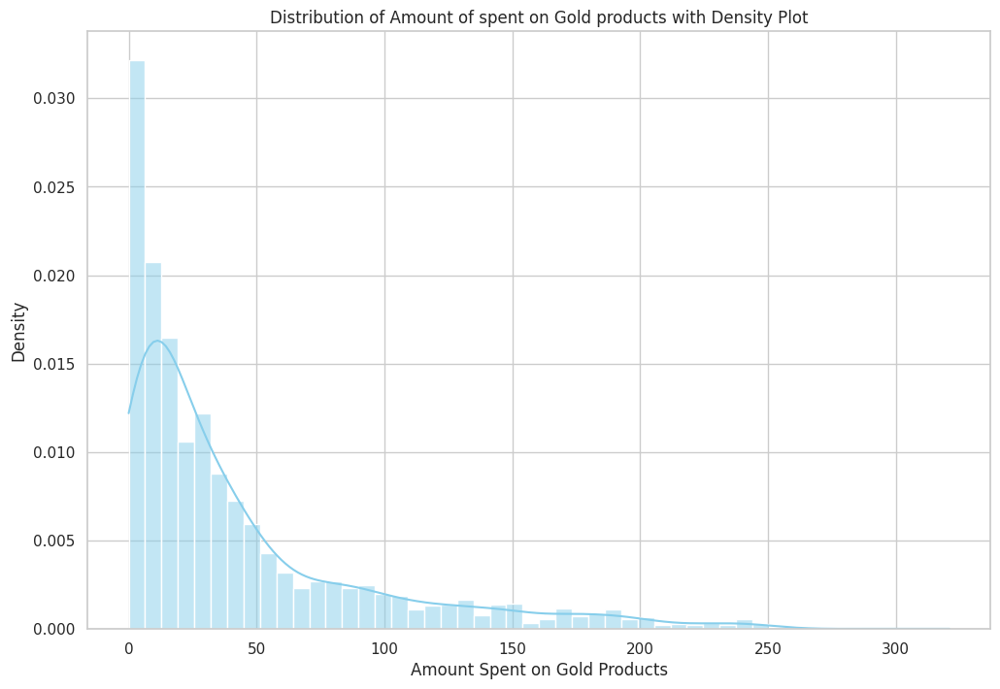

In [80]:
plt.figure(figsize=(12, 8))
sns.histplot(df['MntGoldProds'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of Amount of spent on Gold products with Density Plot')
plt.xlabel('Amount Spent on Gold Products')
plt.ylabel('Density')
plt.show()

<ipython-input-81-a9a0ddf1e696>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntGoldProds'], palette='viridis')


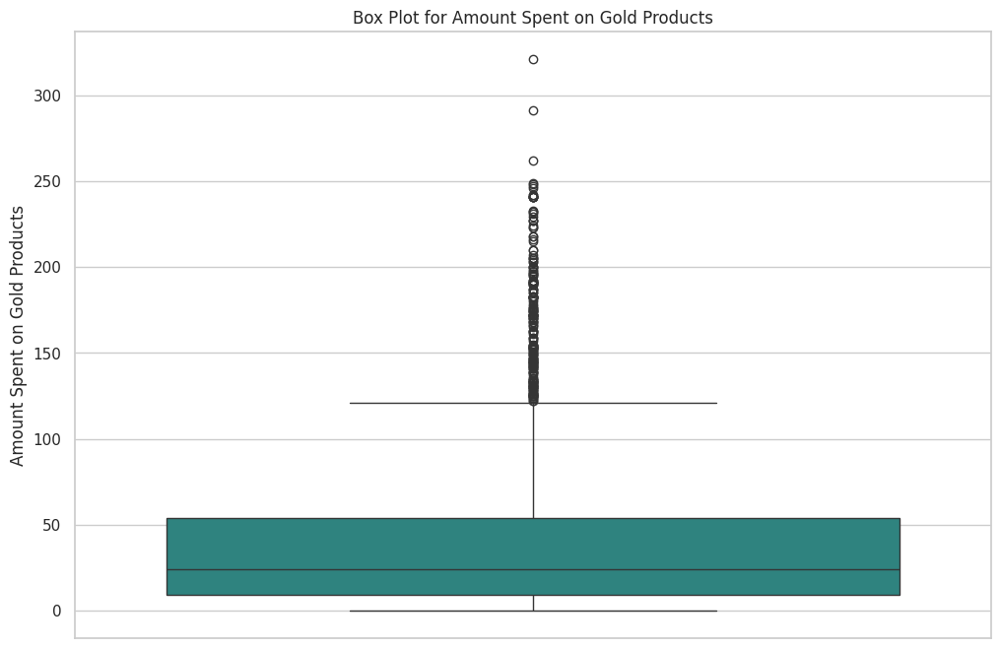

Q1 (25th percentile): 23.0
Median (50th percentile): 172.5
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [81]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['MntGoldProds'], palette='viridis')
plt.title('Box Plot for Amount Spent on Gold Products')
plt.ylabel('Amount Spent on Gold Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

<ipython-input-82-cdb00d0d7bb8>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntWines'], palette='viridis')
<ipython-input-82-cdb00d0d7bb8>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntFruits'], palette='viridis')
<ipython-input-82-cdb00d0d7bb8>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['MntMeatProducts'], palette='viridis')
<ipython-input-82-cdb00d0d7bb8>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `

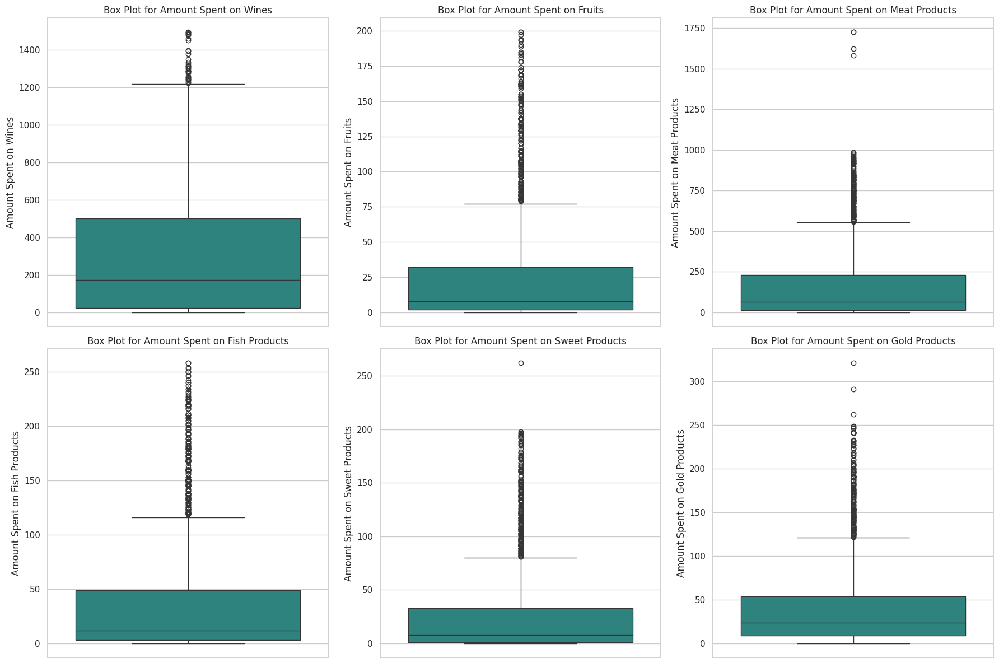

In [82]:
# Plotting the Box Plots for Various Spending Categories
plt.figure(figsize=(18, 12))  # Set figure size

# Subplot for each category
plt.subplot(2, 3, 1)
sns.boxplot(y=df['MntWines'], palette='viridis')
plt.title('Box Plot for Amount Spent on Wines')
plt.ylabel('Amount Spent on Wines')
plt.xlabel('')

plt.subplot(2, 3, 2)
sns.boxplot(y=df['MntFruits'], palette='viridis')
plt.title('Box Plot for Amount Spent on Fruits')
plt.ylabel('Amount Spent on Fruits')
plt.xlabel('')

plt.subplot(2, 3, 3)
sns.boxplot(y=df['MntMeatProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Meat Products')
plt.ylabel('Amount Spent on Meat Products')
plt.xlabel('')

plt.subplot(2, 3, 4)
sns.boxplot(y=df['MntFishProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Fish Products')
plt.ylabel('Amount Spent on Fish Products')
plt.xlabel('')

plt.subplot(2, 3, 5)
sns.boxplot(y=df['MntSweetProducts'], palette='viridis')
plt.title('Box Plot for Amount Spent on Sweet Products')
plt.ylabel('Amount Spent on Sweet Products')
plt.xlabel('')

plt.subplot(2, 3, 6)
sns.boxplot(y=df['MntGoldProds'], palette='viridis')
plt.title('Box Plot for Amount Spent on Gold Products')
plt.ylabel('Amount Spent on Gold Products')
plt.xlabel('')

# Adjust layout
plt.tight_layout()
plt.show()



- Both histograms and box plots for all these products have shown right-skewness with longer-tails and upper whiskers.
- Most Spending is concentrated at lower values for each category with fewer instances of very high spending.
- The median for Wines is higher than other categories indicating that a significant amount of budget was spent on wines.
- The interquartile range of Wines is wider than the other categories suggesting that there is consierable variability in spending on wines.

In [83]:
spend_columns = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']
df['spend'] = df[spend_columns].sum(axis=1)

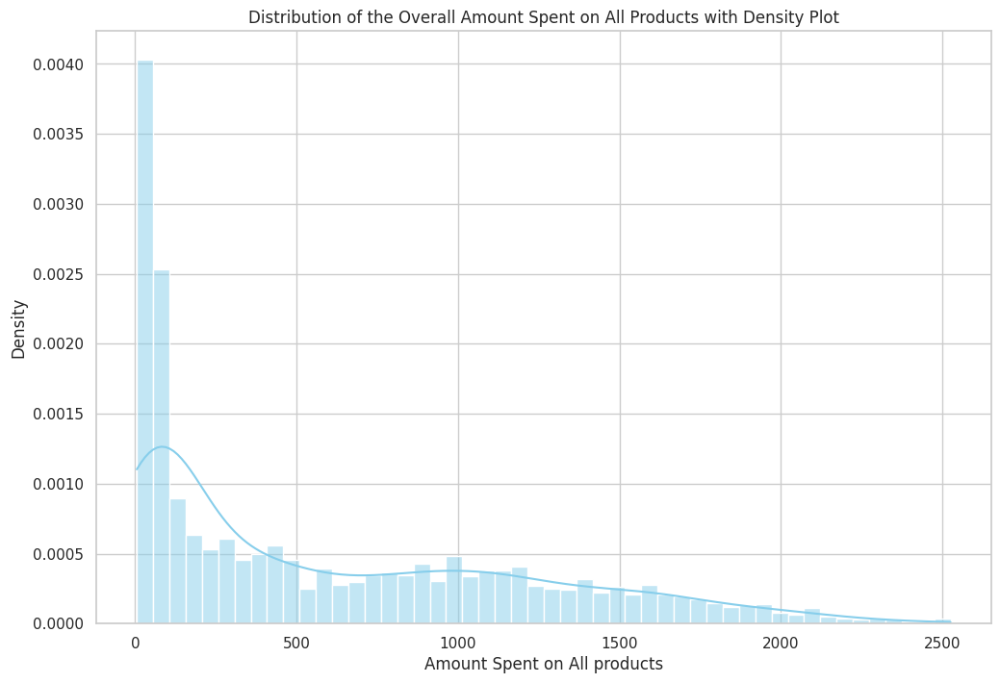

In [84]:
plt.figure(figsize=(12, 8))
sns.histplot(df['spend'], stat="density", kde=True, bins=50, color='skyblue')
plt.ticklabel_format(style='plain', axis='both')
plt.title('Distribution of the Overall Amount Spent on All Products with Density Plot')
plt.xlabel('Amount Spent on All products')
plt.ylabel('Density')
plt.show()

<ipython-input-85-f9d2130f7198>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=df['spend'], palette='viridis')


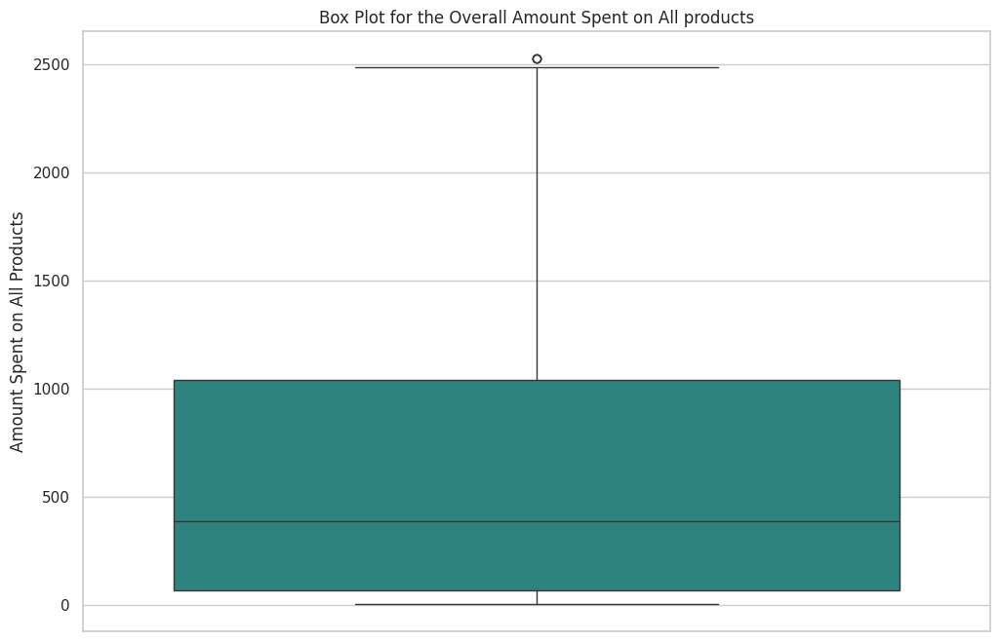

Q1 (25th percentile): 23.0
Median (50th percentile): 172.5
Q3 (75th percentile): 502.0
IQR (Interquartile Range): 479.0
Lower Whisker: -695.5
Upper Whisker: 1220.5


In [85]:
plt.figure(figsize=(12, 8))  # Set figure size
sns.boxplot(y=df['spend'], palette='viridis')
plt.title('Box Plot for the Overall Amount Spent on All products')
plt.ylabel('Amount Spent on All Products')
plt.xlabel('')
plt.show()
# Print the exact values of each quartile
print(f"Q1 (25th percentile): {q1}")
print(f"Median (50th percentile): {median}")
print(f"Q3 (75th percentile): {q3}")
print(f"IQR (Interquartile Range): {iqr}")
print(f"Lower Whisker: {lower_whisker}")
print(f"Upper Whisker: {upper_whisker}")

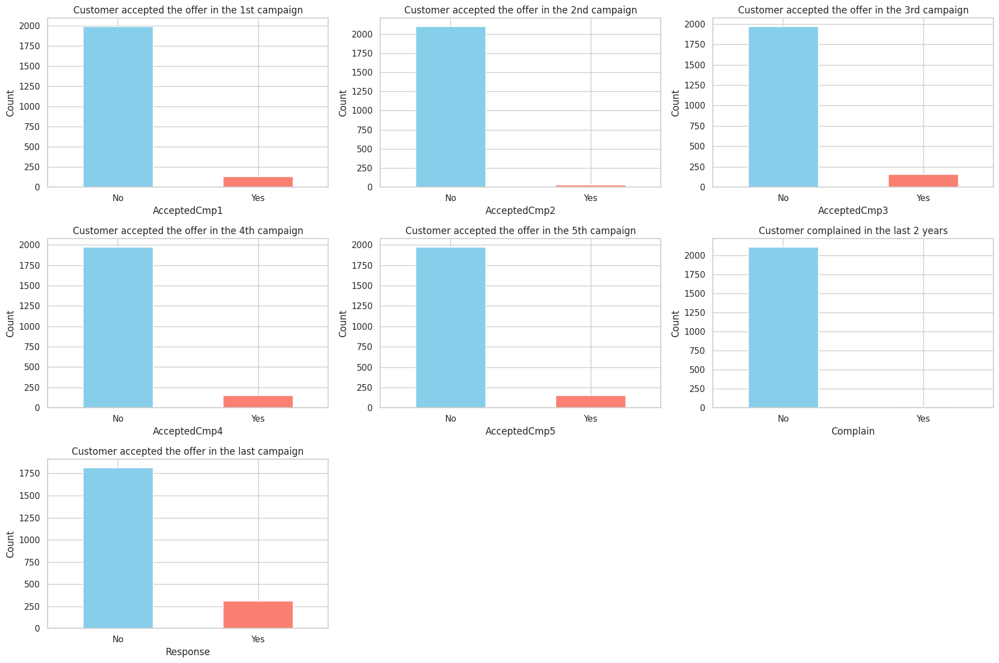

In [86]:
binary_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain', 'Response']
custom_titles = {
     'AcceptedCmp1': 'Customer accepted the offer in the 1st campaign',
    'AcceptedCmp2': 'Customer accepted the offer in the 2nd campaign',
    'AcceptedCmp3': 'Customer accepted the offer in the 3rd campaign',
    'AcceptedCmp4': 'Customer accepted the offer in the 4th campaign',
    'AcceptedCmp5': 'Customer accepted the offer in the 5th campaign',
    'Complain': 'Customer complained in the last 2 years',
    'Response': 'Customer accepted the offer in the last campaign'}

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(18, 12))

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each binary column
for i, col in enumerate(binary_columns):
    title = custom_titles.get(col, col)
    ax = df[col].value_counts().plot(kind='bar', ax=axes[i], title=title, color=['skyblue', 'salmon'])
    ax.set(ylabel='Count')
    ax.set_xticklabels(['No', 'Yes'], rotation=0)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [87]:
# List of campaign columns
campaign_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']

# Create a new column 'AnyAcceptedCmp' which is 1 if any of the campaign columns is 1, otherwise 0
df['AnyAcceptedCmp'] = df[campaign_columns].max(axis=1)

<ipython-input-88-b40a0eb438b7>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=df['AnyAcceptedCmp'].value_counts().index, y=df['AnyAcceptedCmp'].value_counts(), palette=['salmon', 'skyblue'])
<ipython-input-88-b40a0eb438b7>:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(['No', 'Yes'])


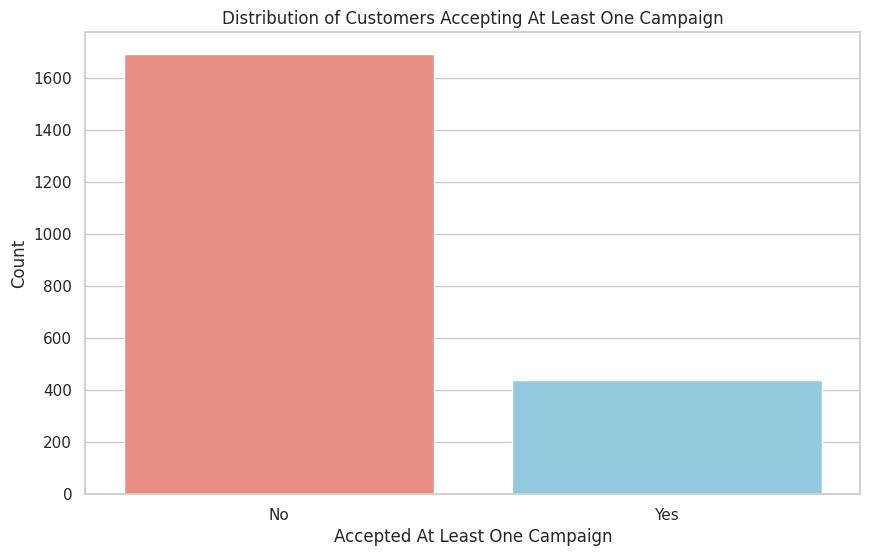

In [88]:
# Plotting the bar plot for 'AnyAcceptedCmp'
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=df['AnyAcceptedCmp'].value_counts().index, y=df['AnyAcceptedCmp'].value_counts(), palette=['salmon', 'skyblue'])
ax.set_xticklabels(['No', 'Yes'])
plt.title('Distribution of Customers Accepting At Least One Campaign')
plt.xlabel('Accepted At Least One Campaign')
plt.ylabel('Count')
plt.show()

In [89]:
# Summary statistics for the new column 'AnyAcceptedCmp'
any_accepted_cmp_summary = df['AnyAcceptedCmp'].value_counts()
print("AnyAcceptedCmp Summary:")
print(any_accepted_cmp_summary)

# Contingency table for 'AnyAcceptedCmp' and 'Response'
contingency_table = pd.crosstab(df['AnyAcceptedCmp'], df['Response'])
print("\nContingency Table:")
print(contingency_table)

# Chi-square test to check the significance
chi2, p, dof, expected = stats.chi2_contingency(contingency_table)
print("\nChi-square Statistic:", chi2)
print("p-value:", p)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:")
print(expected)

AnyAcceptedCmp Summary:
AnyAcceptedCmp
0    1692
1     438
Name: count, dtype: int64

Contingency Table:
Response           0    1
AnyAcceptedCmp           
0               1555  137
1                263  175

Chi-square Statistic: 279.8978527913293
p-value: 7.904161384400765e-63
Degrees of Freedom: 1
Expected Frequencies:
[[1444.15774648  247.84225352]
 [ 373.84225352   64.15774648]]


In [90]:
campaign_columns = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5']
df = df.drop(columns=campaign_columns)

**Justification for Creating a New Column 'AnyAcceptedCmp'**
1. Addressing Imbalance in Campaign Columns:
- For each campaign column ('AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5'), the proportion of the value '1' (indicating acceptance) is extremely small.
- To avoid overfitting caused by the imbalance in these specific values, a new column with binary values was created:
 - '1' (Yes) if customers accepted at least one campaign out of the five.
 - '0' (No) if customers did not accept any campaign.

2. Statistical Significance:
- The p-value calculated for the new column 'AnyAcceptedCmp' indicates that it is statistically significant in relation to the result variable 'Response'.
- This significance suggests that the new variable has a meaningful impact on predicting customer behavior, thus justifying its creation and use in place of the individual campaign columns.


In [91]:
# Dynamically select numerical columns
num_cols = df.dtypes[df.dtypes != 'object'].index.to_list()

# Remove unwanted columns, if they exist in the list
unwanted_columns = ['ID', 'AnyAcceptedCmp', 'Response', 'Complain']
for col in unwanted_columns:
    if col in num_cols:
        num_cols.remove(col)

In [92]:
num_cols

['Income',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'age',
 'length',
 'spend']

In [93]:
corr = df[num_cols].corr()
corr

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,age,length,spend
Income,1.000000,-0.006808,0.578348,0.429977,0.582024,0.438276,0.440950,0.323901,-0.079169,0.390799,0.585192,0.532856,-0.550359,0.158975,-0.016692,0.665110
Recency,-0.006808,1.000000,0.015033,-0.009347,0.015517,-0.006252,0.017220,0.017879,0.012969,-0.004339,0.018338,-0.003871,-0.008479,0.015261,0.032957,0.015699
MntWines,0.578348,0.015033,1.000000,0.395925,0.574027,0.404646,0.398990,0.387382,0.006641,0.551856,0.637244,0.642643,-0.325463,0.162752,0.157281,0.895326
MntFruits,0.429977,-0.009347,0.395925,1.000000,0.549170,0.587526,0.565607,0.395773,-0.130065,0.311175,0.483647,0.465861,-0.416346,0.007629,0.061463,0.616062
MntMeatProducts,0.582024,0.015517,0.574027,0.549170,1.000000,0.571603,0.534032,0.357431,-0.114160,0.314062,0.734854,0.490684,-0.538165,0.026152,0.087585,0.847244
MntFishProducts,0.438276,-0.006252,0.404646,0.587526,0.571603,1.000000,0.573522,0.424310,-0.140771,0.309089,0.529203,0.456959,-0.444444,0.033867,0.072545,0.642368
MntSweetProducts,0.440950,0.017220,0.398990,0.565607,0.534032,0.573522,1.000000,0.359330,-0.115572,0.344707,0.493132,0.456644,-0.420279,0.014624,0.081541,0.608684
MntGoldProds,0.323901,0.017879,0.387382,0.395773,0.357431,0.424310,0.359330,1.000000,0.052677,0.410342,0.437223,0.386825,-0.246440,0.057529,0.139942,0.523266
NumDealsPurchases,-0.079169,0.012969,0.006641,-0.130065,-0.114160,-0.140771,-0.115572,0.052677,1.000000,0.237639,-0.005535,0.066664,0.341266,0.075343,0.179914,-0.063264
NumWebPurchases,0.390799,-0.004339,0.551856,0.311175,0.314062,0.309089,0.344707,0.410342,0.237639,1.000000,0.391478,0.514486,-0.063377,0.157835,0.166778,0.532002


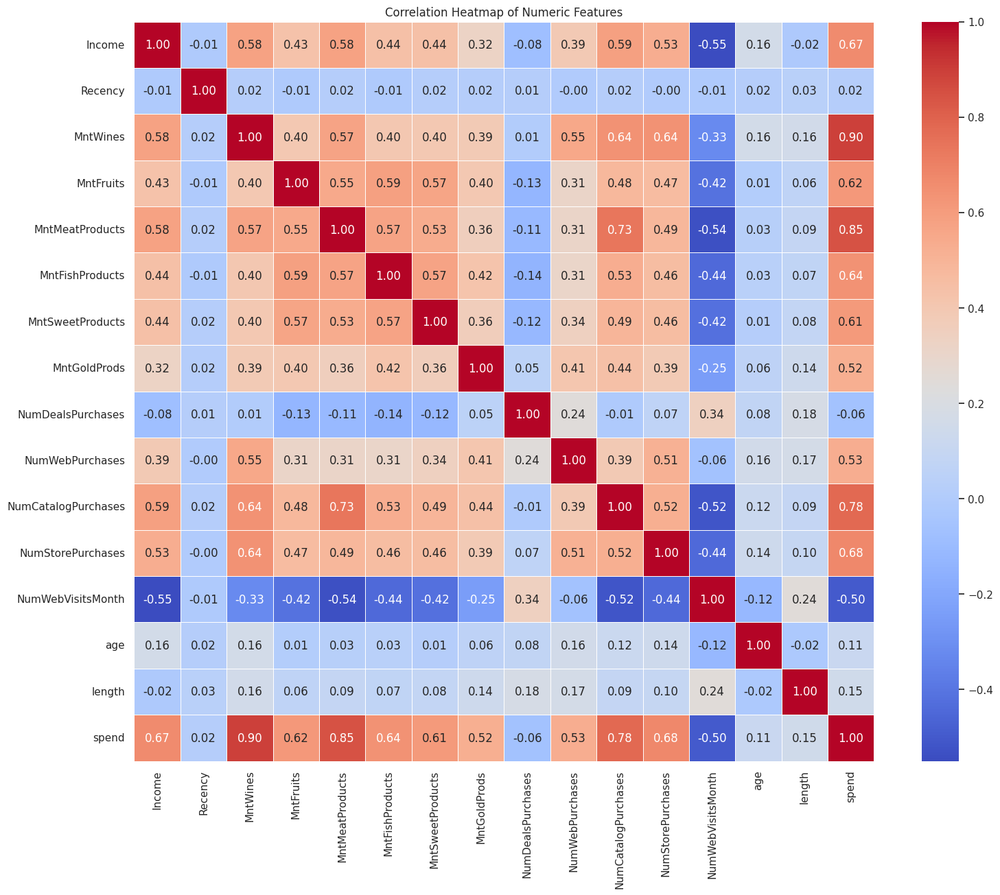

In [94]:
plt.figure(figsize=(18,14))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=0.5)
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

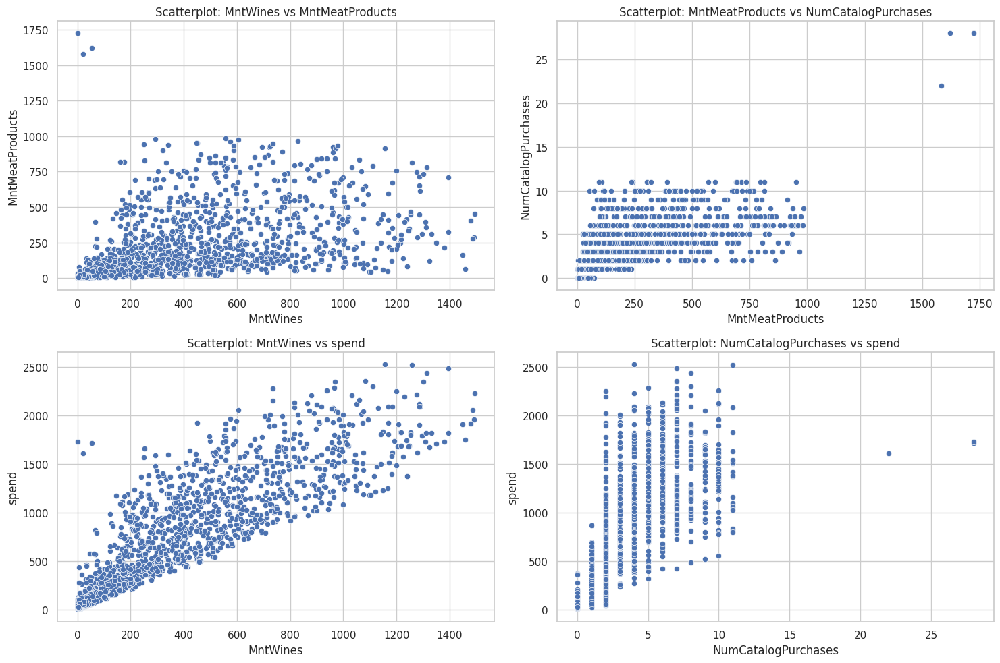

In [95]:
# Example of pairs with correlation above 0.7 (based on your heatmap)
pairs_to_plot = [
    ('MntWines', 'MntMeatProducts'),
    ('MntMeatProducts', 'NumCatalogPurchases'),
    ('MntWines', 'spend'),
    ('NumCatalogPurchases', 'spend')
]

# Create scatterplots for each pair
fig, axes = plt.subplots(2, 2, figsize=(15, 10))  # Create a 2x2 grid for the plots

for i, (x, y) in enumerate(pairs_to_plot):
    row, col = divmod(i, 2)  # Determine the row and column index
    sns.scatterplot(x=df[x], y=df[y], ax=axes[row, col])
    axes[row, col].set_title(f'Scatterplot: {x} vs {y}')
    axes[row, col].set_xlabel(x)
    axes[row, col].set_ylabel(y)

plt.tight_layout()
plt.show()


**Findings from correlations**
- There seems to be a strong correlation between spend and amount spent on wines.
- In contrast, the other three correlations do not have strong correlation between variables. Outliners elevate regression lines between them, making an illusion of stronger correlations than actually exist.
- Despit high variability in the data, the relationship between spend and amount spent on wines exhibit a strong positive correlation.

##**4.Summary Table**

In [96]:
pip install tableone

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.6/41.6 kB 2.9 MB/s eta 0:00:00


In [97]:
%pip install tableone

In [98]:
from tableone import TableOne

In [99]:
df

,ID,Education,Marital_Status,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,age,Has_Kids_Teenagers,length,spend,AnyAcceptedCmp
0,5524,Graduation,Single,58138.0,58,635,88,546,172,88,88,3,8,10,4,7,0,1,67,No,12,1617,0
1,2174,Graduation,Single,46344.0,38,11,1,6,2,1,6,2,1,1,2,5,0,0,70,Yes,10,27,0
2,4141,Graduation,Together,71613.0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,59,No,11,776,0
3,6182,Graduation,Together,26646.0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,40,Yes,10,53,0
4,5324,Advanced degree,Married,58293.0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,43,Yes,10,422,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,Graduation,Married,61223.0,46,709,43,182,42,118,247,2,9,3,4,5,0,0,57,Yes,11,1341,0
2236,4001,Advanced degree,Together,64014.0,56,406,0,30,0,0,8,7,8,2,5,7,0,0,78,Yes,10,444,1
2237,7270,Graduation,Divorced,56981.0,91,908,48,217,32,12,24,1,2,3,13,6,0,0,43,No,10,1241,1
2238,8235,Advanced degree,Together,69245.0,8,428,30,214,80,30,61,2,6,5,10,3,0,0,68,Yes,10,843,0


In [100]:
for column in df.columns:
    print(column)
columns = list(df.columns)

ID
Education
Marital_Status
Income
Recency
MntWines
MntFruits
MntMeatProducts
MntFishProducts
MntSweetProducts
MntGoldProds
NumDealsPurchases
NumWebPurchases
NumCatalogPurchases
NumStorePurchases
NumWebVisitsMonth
Complain
Response
age
Has_Kids_Teenagers
length
spend
AnyAcceptedCmp


In [101]:
print("Columns = ")
print(columns)

Columns = 
['ID', 'Education', 'Marital_Status', 'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'Response', 'age', 'Has_Kids_Teenagers', 'length', 'spend', 'AnyAcceptedCmp']


In [102]:
binary_columns = [col for col in df.columns if df[col].nunique() == 2]
print("Binary columns:")
print(binary_columns)

Binary columns:
['Complain', 'Response', 'Has_Kids_Teenagers', 'AnyAcceptedCmp']


In [103]:
binary_columns = [col for col in df.columns if df[col].nunique() == 2 and col not in ['Education', 'Response','Has_Kids_Teenagers']]
print("Binary columns:")
print(binary_columns)

Binary columns:
['Complain', 'AnyAcceptedCmp']


In [104]:
categorical = [col for col in df.columns if df[col].dtype == 'object']
print("Categorical = ")
print(categorical)

Categorical = 
['Education', 'Marital_Status', 'Has_Kids_Teenagers']


In [105]:
combined_columns = categorical + binary_columns
print("Combined Columns =")
print(combined_columns)

Combined Columns =
['Education', 'Marital_Status', 'Has_Kids_Teenagers', 'Complain', 'AnyAcceptedCmp']


In [106]:
numerical = [col for col in df.columns if df[col].dtype != 'object' and col not in ['Response'] and col not in binary_columns and col not in ['ID']]
print("Numerical = ")
print(numerical)

Numerical = 
['Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'age', 'length', 'spend']


In [107]:
groupby = 'Response'
labels={'Response': 'Result'}

In [108]:
table2 = TableOne(df, columns=columns, categorical=combined_columns, continuous=numerical,
                  groupby=groupby,rename=labels, label_suffix=True,
                  dip_test=True, normal_test=True, tukey_test=True, pval=True,smd=True, htest_name=True)
print(table2)

                                               Grouped by Result                                                                                              
                                                         Missing            Overall                  0                  1 SMD (0,1) P-Value               Test
n                                                                              2130               1818                312                                     
Education, n (%)               Advanced degree                           805 (37.8)         662 (36.4)         143 (45.8)     0.218   0.002        Chi-squared
                               Graduation                               1079 (50.7)         934 (51.4)         145 (46.5)                                     
                               Other                                     246 (11.5)         222 (12.2)           24 (7.7)                                     
Marital_Status, n (%)          Divorced       

##**5. Non-parametric Test**

The hypotheses between Income and Response variables

\$H_0$: The two population locations are the same

$H_1$: The population distribution of income for responders is to the right of the population distribution of income for non-responders

In [109]:
from scipy.stats import mannwhitneyu

# Split the data into responders and non-responders
group_responders = df[df['Response'] == 1]['Income']
group_non_responders = df[df['Response'] == 0]['Income']

# Perform the one-sided Wilcoxon Rank Sum Test
stat, p_value = mannwhitneyu(group_non_responders, group_responders, alternative='less')

# Print results
print("Wilcoxon Rank Sum Test Results (One-Sided):")
print(f"Test Statistic: {stat}")
print(f"P-Value: {p_value}")

# Interpret results
if p_value < 0.05:
    print("Reject the null hypothesis: Responders have higher incomes than non-responders.")
else:
    print("Fail to reject the null hypothesis: No evidence that responders have higher incomes than non-responders.")


Wilcoxon Rank Sum Test Results (One-Sided):
Test Statistic: 209702.0
P-Value: 8.937931462269925e-14
Reject the null hypothesis: Responders have higher incomes than non-responders.


The hypotheses between Recency and Response variables

\$H_0$: The two population locations are the same

$H_1$: The population distribution of Recency for responders is to the left of the population distribution of Recency for non-responders

In [110]:
from scipy.stats import ranksums

# Define the groups
group_0 = df[df['Response'] == 0]['Recency']  # Recency for non-responders
group_1 = df[df['Response'] == 1]['Recency']  # Recency for responders

# Perform the Wilcoxon rank-sum test (one-sided)
stat, p_value = ranksums(group_1, group_0)

# Adjust p-value for one-sided test
p_value_one_sided = p_value / 2 if stat < 0 else (1 - p_value / 2)

# Display results
print("Wilcoxon Rank-Sum Test Results:")
print(f"Test Statistic: {stat}")
print(f"One-Sided P-Value: {p_value_one_sided}")

# Interpretation
if p_value_one_sided < 0.05:
    print("Reject the null hypothesis: Responders tend to have lower Recency (shop more recently) than non-responders.")
else:
    print("Fail to reject the null hypothesis: No significant difference in Recency between responders and non-responders.")


Wilcoxon Rank-Sum Test Results:
Test Statistic: -9.294075911341158
One-Sided P-Value: 7.424521790332825e-21
Reject the null hypothesis: Responders tend to have lower Recency (shop more recently) than non-responders.


For spending on variables such as 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', the hypothese for Wilcoxn Rank-Sum Test:

\$H_0$: The distribution of spending for the two groups (e.g.,those who responded versus those who did not respond) are the same.

$H_1$: The distribution of spending for the two groups are not the same. The spending distribution of responders is to the right of the population distribution of spending for non-responders.

In [111]:
from scipy.stats import ranksums

# Define variables for analysis
variables = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']

# Perform Wilcoxon Rank-Sum Test for each variable
results = []
for var in variables:
    group_0 = df[df['Response'] == 0][var]  # Non-responders
    group_1 = df[df['Response'] == 1][var]  # Responders

    # Perform the test
    stat, p_value = ranksums(group_1, group_0)

    # Store results
    results.append({'Variable': var, 'Statistic': stat, 'P-Value': p_value})

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Display results
print("Wilcoxon Rank-Sum Test Results for Spending Variables:")
print(results_df)


Wilcoxon Rank-Sum Test Results for Spending Variables:
           Variable  Statistic       P-Value
0          MntWines   9.055891  1.354567e-19
1         MntFruits   6.890112  5.574857e-12
2   MntMeatProducts  10.320745  5.678081e-25
3   MntFishProducts   5.413129  6.193283e-08
4  MntSweetProducts   6.796851  1.069308e-11
5      MntGoldProds   8.213054  2.156320e-16


For purchasing methods such as 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', the hypothese for Wilcoxn Rank-Sum Test:

\$H_0$: The distribution of the number of purchases through a specific channel for the two groups (e.g.,those who responded versus those who did not respond) are the same.

$H_1$: The distribution of the number of purchases through a specific channel for the two groups are not the same. The distribution of the number of purchases through a specific channel for responders is to the right of the distribution of the number of purchases through a specific channel for non-responders.

In [112]:
# Define variables for analysis
variables = ['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']

# Perform Wilcoxon Rank-Sum Test for each variable
results = []
for var in variables:
    group_0 = df[df['Response'] == 0][var]  # Non-responders
    group_1 = df[df['Response'] == 1][var]  # Responders

    # Perform the test
    stat, p_value = ranksums(group_1, group_0)

    # Store results
    results.append({'Variable': var, 'Statistic': stat, 'P-Value': p_value})

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Display results
print("Wilcoxon Rank-Sum Test Results for Spending Variables:")
print(results_df)


Wilcoxon Rank-Sum Test Results for Spending Variables:
              Variable  Statistic       P-Value
0    NumDealsPurchases  -1.806236  7.088144e-02
1      NumWebPurchases   7.836772  4.622776e-15
2  NumCatalogPurchases  10.479817  1.069505e-25
3    NumStorePurchases   2.324254  2.011189e-02
4    NumWebVisitsMonth   0.343253  7.314084e-01


At 0.05 significance level, the null hypotheses for 'NumDealsPurchases', 'NumStorePurchases', and  'NumWebVisitsMonth' cannot be rejected.
In conclusion, the distribution of the number of purchases for these channels are the same for the two groups.

- The hypotheses between Age and Response variables

\$H_0$: The two population locations are the same

$H_1$: The population distribution of Age for responders is to the right of the population distribution of Age for non-responders

- The hypotheses between Total Spending and Response variables

\$H_0$: The two population locations are the same

$H_1$: The population distribution of Total Spending for responders is to the right of the population distribution of Total Spending for non-responders

- The hypotheses between Length (how long customers have been registered in a store) and Response variables

\$H_0$: The two population locations are the same

$H_1$: The population distribution of Length for responders is to the right of the population distribution of Length for non-responders

In [113]:
# Define variables for analysis
variables = ['age', 'spend', 'length']

# Perform Wilcoxon Rank-Sum Test for each variable
results = []
for var in variables:
    group_0 = df[df['Response'] == 0][var]  # Non-responders
    group_1 = df[df['Response'] == 1][var]  # Responders

    # Perform the test
    stat, p_value = ranksums(group_1, group_0)

    # Store results
    results.append({'Variable': var, 'Statistic': stat, 'P-Value': p_value})

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Display results
print("Wilcoxon Rank-Sum Test Results for Spending Variables:")
print(results_df)

Wilcoxon Rank-Sum Test Results for Spending Variables:
  Variable  Statistic       P-Value
0      age  -1.453518  1.460800e-01
1    spend  10.905171  1.088880e-27
2   length   6.826393  8.707599e-12


At 0.05 significance level, the null hypotheses for Age cannot be rejected.
In conclusion, the distribution of Age are the same for the two groups.

##**6.  Chi-squared Test of Independence**

In [114]:
# Define variables
categorical_variable = 'Education'  # Education levels
target_variable = 'Response'       # Response (target variable)

# Create contingency table with counts
contingency_table = pd.crosstab(df[target_variable], df[categorical_variable], margins=True, margins_name="Total")
contingency_table.index.name = target_variable
contingency_table.columns.name = categorical_variable

# Add row-wise and column-wise proportions
total_counts = contingency_table.loc["Total", "Total"]
row_proportions = contingency_table.div(contingency_table["Total"], axis=0) * 100
column_proportions = contingency_table.div(contingency_table.loc["Total"], axis=1) * 100

# Format the table with counts and proportions
formatted_table = contingency_table.astype(str) + " (" + column_proportions.round(2).astype(str) + "%)"
formatted_table["Total"] = contingency_table["Total"].astype(str) + " (" + row_proportions["Total"].round(2).astype(str) + "%)"
print("Formatted Contingency Table:")
print(formatted_table)

Formatted Contingency Table:
Education Advanced degree     Graduation         Other          Total
Response                                                             
0            662 (82.24%)   934 (86.56%)  222 (90.24%)  1818 (100.0%)
1            143 (17.76%)   145 (13.44%)    24 (9.76%)   312 (100.0%)
Total        805 (100.0%)  1079 (100.0%)  246 (100.0%)  2130 (100.0%)


In [115]:
from scipy.stats import chi2_contingency
# Perform chi-square test of independence
chi2, p, dof, ex = chi2_contingency(contingency_table.iloc[:-1, :-1])  # Exclude 'Total' row/column
print("\nChi-Square Test Results:")
print(f"Chi-Square Value: {chi2}, P-value: {p}, Degrees of Freedom: {dof}")


Chi-Square Test Results:
Chi-Square Value: 12.223163494711024, P-value: 0.0022170412387838047, Degrees of Freedom: 2


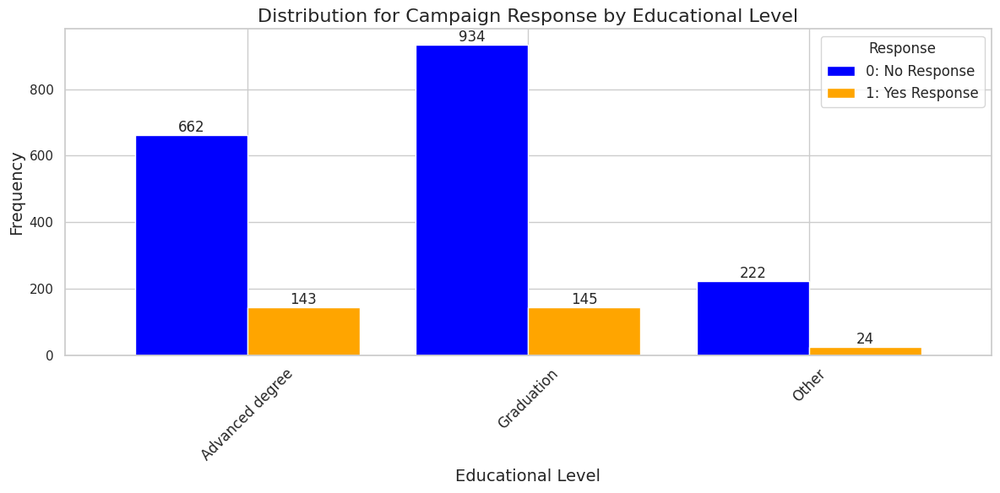

In [116]:
# Define variables
categorical_variable = 'Education'  # Replace with your actual column name for education levels
target_variable = 'Response'       # Response (0 = No, 1 = Yes)

# Create a contingency table with counts
contingency_table = pd.crosstab(df[categorical_variable], df[target_variable])

# Plotting a side-by-side bar chart
ax = contingency_table.plot(kind='bar', figsize=(12, 6), width=0.8, color=['blue', 'orange'])

# Add frequency labels on each bar
for container in ax.containers:
    ax.bar_label(container, label_type='edge')

# Customize chart
plt.title('Distribution for Campaign Response by Educational Level', fontsize=16)
plt.xlabel('Educational Level', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Response', labels=['0: No Response', '1: Yes Response'], fontsize=12)
plt.tight_layout()

# Show plot
plt.show()

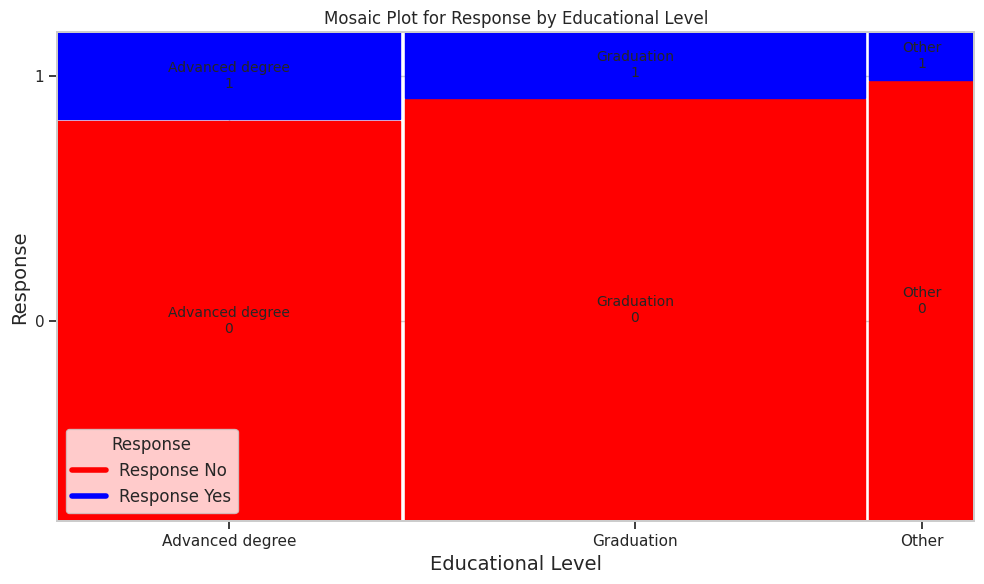

In [117]:
from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.pyplot as plt
import pandas as pd


# Define variables
categorical_variable = 'Education'  # Column for educational levels
target_variable = 'Response'       # Response (0 = No, 1 = Yes)

# Prepare data for mosaic plot
mosaic_data = pd.crosstab(df[categorical_variable], df[target_variable])

# Define custom color mapping for Response (0 -> red, 1 -> blue)
color_mapping = {
    (edu_level, '0'): 'red' for edu_level in mosaic_data.index
}
color_mapping.update({
    (edu_level, '1'): 'blue' for edu_level in mosaic_data.index
})

# Function for defining bar properties
def props(key):
    return {'color': color_mapping[key]}

# Create the mosaic plot
fig, ax = plt.subplots(figsize=(10, 6))
mosaic_dict = mosaic_data.stack().rename_axis(index=['Education', 'Response']).reset_index().set_index(['Education', 'Response'])[0].to_dict()
mosaic(
    mosaic_dict,
    title='Mosaic Plot for Response by Educational Level',
    properties=props,
    ax=ax
)

# Add legend manually
legend_labels = {
    '0': 'Response No',
    '1': 'Response Yes'
}
handles = [
    plt.Line2D([0], [0], color='red', lw=4, label=legend_labels['0']),
    plt.Line2D([0], [0], color='blue', lw=4, label=legend_labels['1'])
]
ax.legend(handles=handles, title='Response', fontsize=12)

# Customize axes and labels
ax.set_xlabel('Educational Level', fontsize=14)
ax.set_ylabel('Response', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()

In [118]:
# Define variables
categorical_variable = 'Marital_Status'  # Replace with your variable
target_variable = 'Response'            # Response (target variable)

# Create contingency table with counts
contingency_table = pd.crosstab(df[target_variable], df[categorical_variable], margins=True, margins_name="Total")
contingency_table.index.name = target_variable
contingency_table.columns.name = categorical_variable

# Add row-wise and column-wise proportions
row_proportions = contingency_table.div(contingency_table["Total"], axis=0) * 100
column_proportions = contingency_table.div(contingency_table.loc["Total"], axis=1) * 100

# Format the table with counts and proportions
formatted_table = contingency_table.astype(str) + " (" + column_proportions.round(2).astype(str) + "%)"
formatted_table["Total"] = contingency_table["Total"].astype(str) + " (" + row_proportions["Total"].round(2).astype(str) + "%)"

# Move the "Total" row to the top
formatted_table = pd.concat([formatted_table.loc[["Total"]], formatted_table.drop("Total")])

# Display the formatted table
print("Formatted Contingency Table:")
print(formatted_table)


Formatted Contingency Table:
Marital_Status      Divorced       Married        Single      Together  \
Response                                                                 
Total           231 (100.0%)  857 (100.0%)  470 (100.0%)  572 (100.0%)   
0               183 (79.22%)  759 (88.56%)  364 (77.45%)  512 (89.51%)   
1                48 (20.78%)   98 (11.44%)  106 (22.55%)   60 (10.49%)   

Marital_Status          Total  
Response                       
Total           2130 (100.0%)  
0               1818 (100.0%)  
1                312 (100.0%)  


In [119]:
# Perform chi-square test of independence
chi2, p, dof, ex = chi2_contingency(contingency_table.iloc[:-1, :-1])  # Exclude 'Total' row/column
print("\nChi-Square Test Results:")
print(f"Chi-Square Value: {chi2}, P-value: {p}, Degrees of Freedom: {dof}")


Chi-Square Test Results:
Chi-Square Value: 45.42563940835278, P-value: 7.512794088073144e-10, Degrees of Freedom: 3


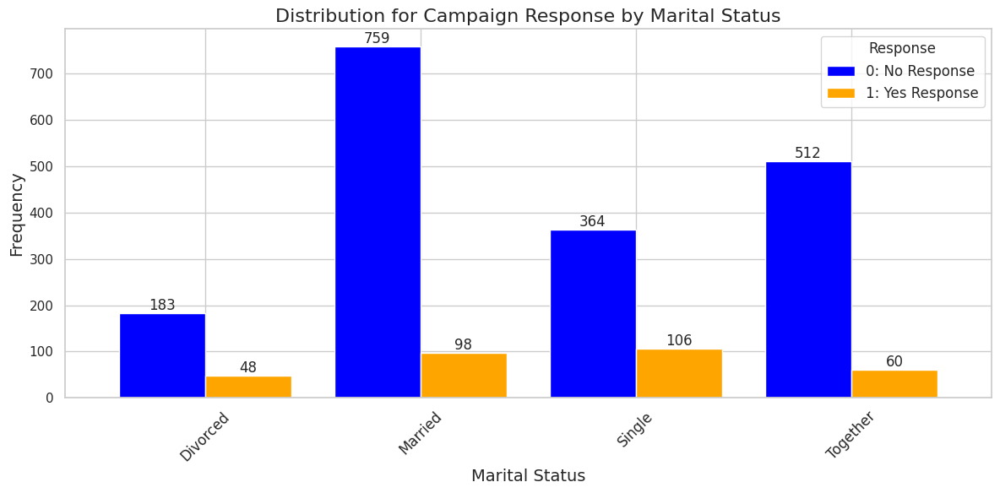

In [120]:
# Define variables
categorical_variable = 'Marital_Status'
target_variable = 'Response'       # Response (0 = No, 1 = Yes)

# Create a contingency table with counts
contingency_table = pd.crosstab(df[categorical_variable], df[target_variable])

# Plotting a side-by-side bar chart
ax = contingency_table.plot(kind='bar', figsize=(12, 6), width=0.8, color=['blue', 'orange'])

# Add frequency labels on each bar
for container in ax.containers:
    ax.bar_label(container, label_type='edge')

# Customize chart
plt.title('Distribution for Campaign Response by Marital Status', fontsize=16)
plt.xlabel('Marital Status', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Response', labels=['0: No Response', '1: Yes Response'], fontsize=12)
plt.tight_layout()

# Show plot
plt.show()

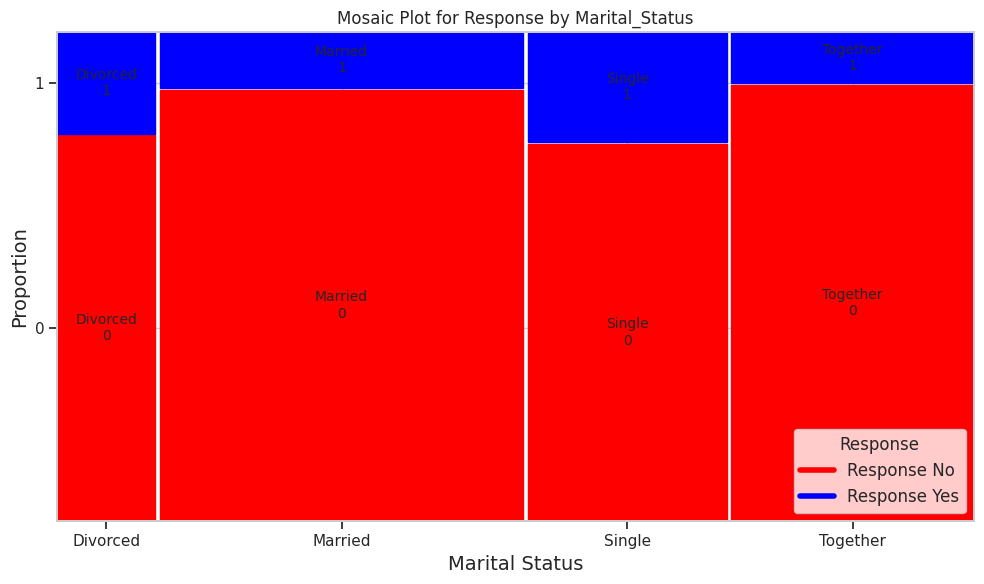

In [121]:
# Define variables
categorical_variable = 'Marital_Status'
target_variable = 'Response'  # Response (0 = No, 1 = Yes)

# Prepare data for mosaic plot
mosaic_data = pd.crosstab(df[categorical_variable], df[target_variable])

# Define custom color mapping for Response (0 -> red, 1 -> blue)
color_mapping = {}
for category in mosaic_data.index:
    color_mapping[(category, '0')] = 'red'  # Response 0 -> red
    color_mapping[(category, '1')] = 'blue'  # Response 1 -> blue

# Function for defining bar properties
def props(key):
    return {'color': color_mapping[(key[0], str(key[1]))]}  # Ensure keys are matched as strings

# Create the mosaic plot
fig, ax = plt.subplots(figsize=(10, 6))
mosaic_dict = (
    mosaic_data.stack()
    .rename_axis(index=['Marital_Status', 'Response'])
    .reset_index()
    .set_index(['Marital_Status', 'Response'])[0]
    .to_dict()
)
mosaic(
    mosaic_dict,
    title='Mosaic Plot for Response by Marital_Status',
    properties=props,
    ax=ax
)

# Add legend manually
legend_labels = {
    '0': 'Response No',
    '1': 'Response Yes'
}
handles = [
    plt.Line2D([0], [0], color='red', lw=4, label=legend_labels['0']),
    plt.Line2D([0], [0], color='blue', lw=4, label=legend_labels['1'])
]
ax.legend(handles=handles, title='Response', fontsize=12)

# Customize axes and labels
ax.set_xlabel('Marital Status', fontsize=14)
ax.set_ylabel('Proportion', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()



In [122]:
# Define variables
categorical_variable = 'Complain'  # Education levels
target_variable = 'Response'       # Response (target variable)

# Create contingency table with counts
contingency_table = pd.crosstab(df[target_variable], df[categorical_variable], margins=True, margins_name="Total")
contingency_table.index.name = target_variable
contingency_table.columns.name = categorical_variable

# Add row-wise and column-wise proportions
total_counts = contingency_table.loc["Total", "Total"]
row_proportions = contingency_table.div(contingency_table["Total"], axis=0) * 100
column_proportions = contingency_table.div(contingency_table.loc["Total"], axis=1) * 100

# Format the table with counts and proportions
formatted_table = contingency_table.astype(str) + " (" + column_proportions.round(2).astype(str) + "%)"
formatted_table["Total"] = contingency_table["Total"].astype(str) + " (" + row_proportions["Total"].round(2).astype(str) + "%)"
print("Formatted Contingency Table:")
print(formatted_table)

Formatted Contingency Table:
Complain              0            1          Total
Response                                           
0         1801 (85.36%)   17 (85.0%)  1818 (100.0%)
1          309 (14.64%)    3 (15.0%)   312 (100.0%)
Total     2110 (100.0%)  20 (100.0%)  2130 (100.0%)


In [123]:
from scipy.stats import fisher_exact

# Extract 2x2 contingency table from your formatted table
# Example: Replace these values with the actual counts from your contingency table
complain_no = contingency_table.at[0, 0]  # Response = 0, Complain = 0
complain_yes = contingency_table.at[0, 1] # Response = 0, Complain = 1
response_yes_complain_no = contingency_table.at[1, 0]  # Response = 1, Complain = 0
response_yes_complain_yes = contingency_table.at[1, 1] # Response = 1, Complain = 1

# Define the 2x2 table for Fisher's Exact Test
fisher_table = [[complain_no, complain_yes],
                [response_yes_complain_no, response_yes_complain_yes]]

# Perform Fisher's Exact Test
odds_ratio, p_value = fisher_exact(fisher_table)

# Display results
print("Fisher's Exact Test Results:")
print(f"Odds Ratio: {odds_ratio}")
print(f"P-Value: {p_value}")


Fisher's Exact Test Results:
Odds Ratio: 1.0285551113649343
P-Value: 1.0


In [124]:
# Define variables
categorical_variable = 'Has_Kids_Teenagers'
target_variable = 'Response'       # Response (target variable)

# Create contingency table with counts
contingency_table = pd.crosstab(df[target_variable], df[categorical_variable], margins=True, margins_name="Total")
contingency_table.index.name = target_variable
contingency_table.columns.name = categorical_variable

# Add row-wise and column-wise proportions
total_counts = contingency_table.loc["Total", "Total"]
row_proportions = contingency_table.div(contingency_table["Total"], axis=0) * 100
column_proportions = contingency_table.div(contingency_table.loc["Total"], axis=1) * 100

# Format the table with counts and proportions
formatted_table = contingency_table.astype(str) + " (" + column_proportions.round(2).astype(str) + "%)"
formatted_table["Total"] = contingency_table["Total"].astype(str) + " (" + row_proportions["Total"].round(2).astype(str) + "%)"
print("Formatted Contingency Table:")
print(formatted_table)

Formatted Contingency Table:
Has_Kids_Teenagers            No            Yes          Total
Response                                                      
0                   446 (73.84%)  1372 (89.91%)  1818 (100.0%)
1                   158 (26.16%)   154 (10.09%)   312 (100.0%)
Total               604 (100.0%)  1526 (100.0%)  2130 (100.0%)


In [125]:
# Perform chi-square test of independence
chi2, p, dof, ex = chi2_contingency(contingency_table.iloc[:-1, :-1])  # Exclude 'Total' row/column
print("\nChi-Square Test Results:")
print(f"Chi-Square Value: {chi2}, P-value: {p}, Degrees of Freedom: {dof}")


Chi-Square Test Results:
Chi-Square Value: 88.0711870408844, P-value: 6.314070133117859e-21, Degrees of Freedom: 1


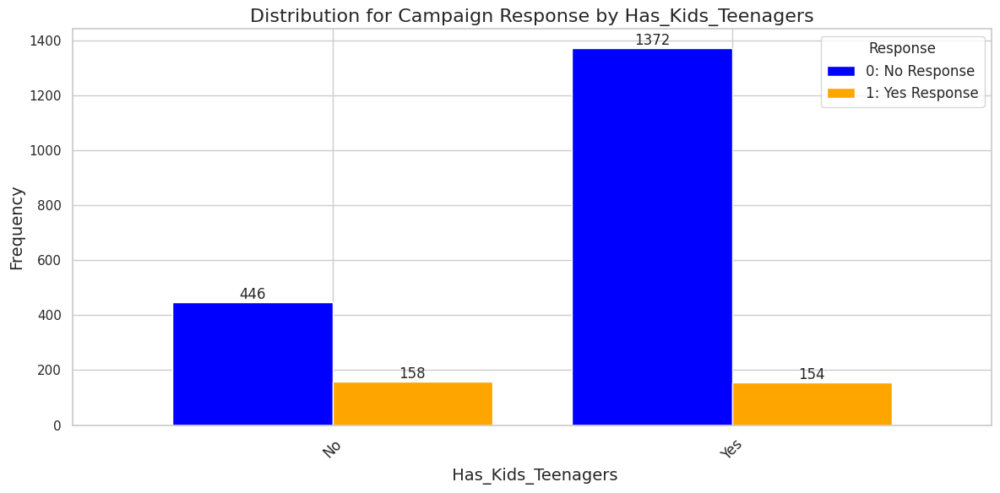

In [126]:
# Define variables
categorical_variable = 'Has_Kids_Teenagers'
target_variable = 'Response'       # Response (0 = No, 1 = Yes)

# Create a contingency table with counts
contingency_table = pd.crosstab(df[categorical_variable], df[target_variable])

# Plotting a side-by-side bar chart
ax = contingency_table.plot(kind='bar', figsize=(12, 6), width=0.8, color=['blue', 'orange'] )

# Add frequency labels on each bar
for container in ax.containers:
    ax.bar_label(container, label_type='edge')

# Customize chart
plt.title('Distribution for Campaign Response by Has_Kids_Teenagers', fontsize=16)
plt.xlabel(' Has_Kids_Teenagers', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title='Response', labels=['0: No Response', '1: Yes Response'], fontsize=12)
plt.tight_layout()

# Show plot
plt.show()

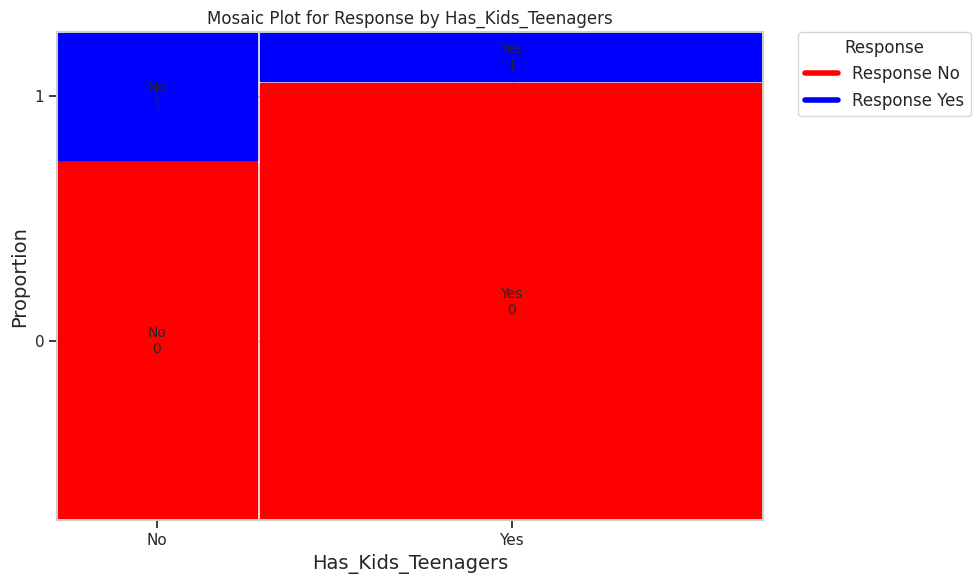

In [147]:
# Define variables
categorical_variable = 'Has_Kids_Teenagers'
target_variable = 'Response'  # Response (0 = No, 1 = Yes)

# Prepare data for mosaic plot
mosaic_data = pd.crosstab(df[categorical_variable], df[target_variable])

# Define custom color mapping for Response (0 -> blue, 1 -> red)
color_mapping = {}
for category in mosaic_data.index:
    color_mapping[(category, '0')] = 'red'  # Response 0 -> blue
    color_mapping[(category, '1')] = 'blue'  # Response 1 -> red

# Function for defining bar properties
def props(key):
    return {'color': color_mapping[(key[0], str(key[1]))]}  # Ensure keys are matched as strings

# Create the mosaic plot
fig, ax = plt.subplots(figsize=(10, 6))
mosaic_dict = (
    mosaic_data.stack()
    .rename_axis(index=['Has_Kids_Teenagers', 'Response'])
    .reset_index()
    .set_index(['Has_Kids_Teenagers', 'Response'])[0]
    .to_dict()
)
mosaic(
    mosaic_dict,
    title='Mosaic Plot for Response by Has_Kids_Teenagers',
    properties=props,
    ax=ax
)

# Add legend manually with the legend box outside the plot
legend_labels = {
    '0': 'Response No',
    '1': 'Response Yes'
}
handles = [
    plt.Line2D([0], [0], color='red', lw=4, label=legend_labels['0']),
    plt.Line2D([0], [0], color='blue', lw=4, label=legend_labels['1'])
]
ax.legend(
    handles=handles,
    title='Response',
    fontsize=12,
    loc='upper left',  # Position legend at the top-left
    bbox_to_anchor=(1.05, 1),  # Move the legend outside the plot
    borderaxespad=0.  # Reduce padding between the plot and the legend
)

# Customize axes and labels
ax.set_xlabel('Has_Kids_Teenagers', fontsize=14)
ax.set_ylabel('Proportion', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()

In [128]:
# Define variables
categorical_variable = 'AnyAcceptedCmp'
target_variable = 'Response'       # Response (target variable)

# Create contingency table with counts
contingency_table = pd.crosstab(df[target_variable], df[categorical_variable], margins=True, margins_name="Total")
contingency_table.index.name = target_variable
contingency_table.columns.name = categorical_variable

# Add row-wise and column-wise proportions
total_counts = contingency_table.loc["Total", "Total"]
row_proportions = contingency_table.div(contingency_table["Total"], axis=0) * 100
column_proportions = contingency_table.div(contingency_table.loc["Total"], axis=1) * 100

# Format the table with counts and proportions
formatted_table = contingency_table.astype(str) + " (" + column_proportions.round(2).astype(str) + "%)"
formatted_table["Total"] = contingency_table["Total"].astype(str) + " (" + row_proportions["Total"].round(2).astype(str) + "%)"
print("Formatted Contingency Table:")
print(formatted_table)

Formatted Contingency Table:
AnyAcceptedCmp              0             1          Total
Response                                                  
0                1555 (91.9%)  263 (60.05%)  1818 (100.0%)
1                  137 (8.1%)  175 (39.95%)   312 (100.0%)
Total           1692 (100.0%)  438 (100.0%)  2130 (100.0%)


In [129]:
# Perform chi-square test of independence
chi2, p, dof, ex = chi2_contingency(contingency_table.iloc[:-1, :-1])  # Exclude 'Total' row/column
print("\nChi-Square Test Results:")
print(f"Chi-Square Value: {chi2}, P-value: {p}, Degrees of Freedom: {dof}")


Chi-Square Test Results:
Chi-Square Value: 279.8978527913293, P-value: 7.904161384400765e-63, Degrees of Freedom: 1


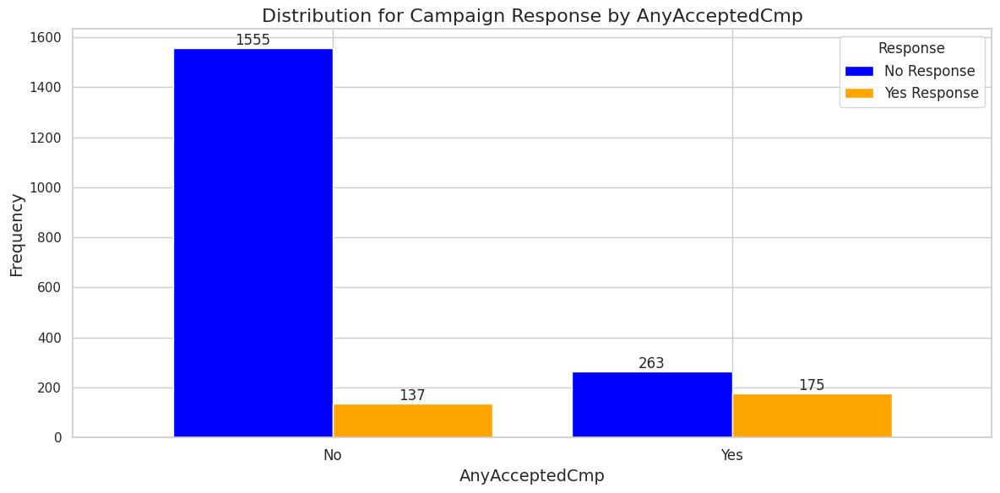

In [130]:
# Define variables
categorical_variable = 'AnyAcceptedCmp'
target_variable = 'Response'  # Response (0 = No, 1 = Yes)

# Create a contingency table with counts
contingency_table = pd.crosstab(df[categorical_variable], df[target_variable])

# Map the x-axis labels to "No" and "Yes"
contingency_table.index = contingency_table.index.map({0: "No", 1: "Yes"})

# Plotting a side-by-side bar chart
ax = contingency_table.plot(kind='bar', figsize=(12, 6), width=0.8, color=['blue', 'orange'])

# Add frequency labels on each bar
for container in ax.containers:
    ax.bar_label(container, label_type='edge')

# Customize chart
plt.title('Distribution for Campaign Response by AnyAcceptedCmp', fontsize=16)
plt.xlabel('AnyAcceptedCmp', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=0, fontsize=12)  # Align labels horizontally
plt.legend(title='Response', labels=['No Response', 'Yes Response'], fontsize=12)
plt.tight_layout()

# Show plot
plt.show()

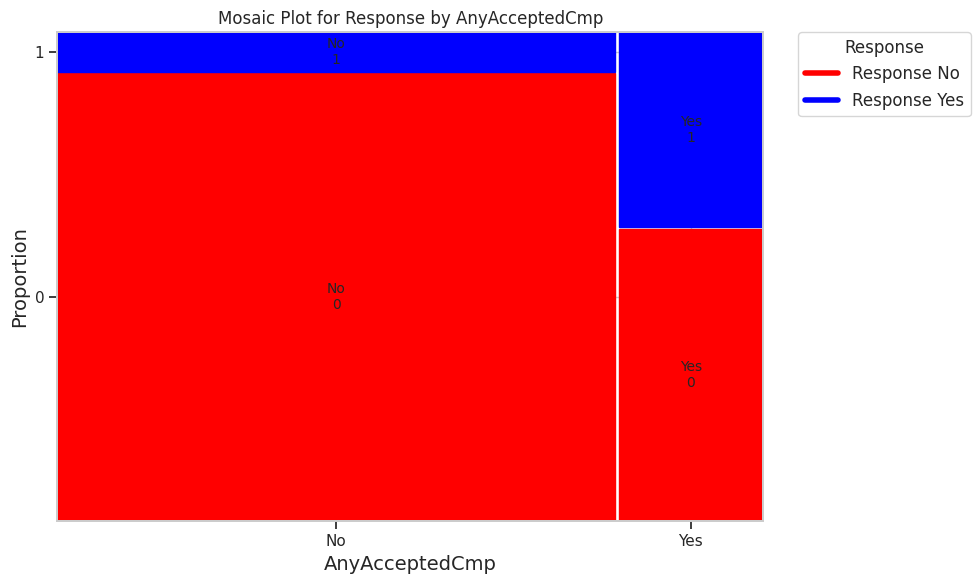

In [131]:
# Define variables
categorical_variable = 'AnyAcceptedCmp'
target_variable = 'Response'  # Response (0 = No, 1 = Yes)

# Prepare data for mosaic plot
mosaic_data = pd.crosstab(df[categorical_variable], df[target_variable])

# Map index values for better readability (e.g., 0 -> "No", 1 -> "Yes")
mosaic_data.index = mosaic_data.index.map({0: "No", 1: "Yes"})

# Define custom color mapping for Response (0 -> red, 1 -> blue)
color_mapping = {}
for category in mosaic_data.index:
    color_mapping[(category, '0')] = 'red'  # Response 0 -> red
    color_mapping[(category, '1')] = 'blue'  # Response 1 -> blue

# Function for defining bar properties
def props(key):
    return {'color': color_mapping[(key[0], str(key[1]))]}  # Ensure keys are matched as strings

# Create the mosaic plot
fig, ax = plt.subplots(figsize=(10, 6))
mosaic_dict = (
    mosaic_data.stack()
    .rename_axis(index=['AnyAcceptedCmp', 'Response'])
    .reset_index()
    .set_index(['AnyAcceptedCmp', 'Response'])[0]
    .to_dict()
)
mosaic(
    mosaic_dict,
    title='Mosaic Plot for Response by AnyAcceptedCmp',
    properties=props,
    ax=ax
)

# Add legend manually with the legend box outside the plot
legend_labels = {
    '0': 'Response No',
    '1': 'Response Yes'
}
handles = [
    plt.Line2D([0], [0], color='red', lw=4, label=legend_labels['0']),
    plt.Line2D([0], [0], color='blue', lw=4, label=legend_labels['1'])
]
ax.legend(
    handles=handles,
    title='Response',
    fontsize=12,
    loc='upper left',  # Position legend at the top-left
    bbox_to_anchor=(1.05, 1),  # Move the legend outside the plot
    borderaxespad=0.  # Reduce padding between the plot and the legend
)

# Customize axes and labels
ax.set_xlabel('AnyAcceptedCmp', fontsize=14)
ax.set_ylabel('Proportion', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()

# Show the plot
plt.show()


## **7. Modeling**

### **Part 1: Customer Segmentation**

#### **1. CART Regression**

Cluster-Based Segment Summary:
                         Income  NumWebPurchases  NumCatalogPurchases  \
Spend_Segment                                                           
High Spender       69807.642857         5.560606             5.119048   
Low Spender        51798.093525         6.057554             2.424460   
Medium Spender     80388.762069         5.572414             6.182759   
Very High Spender  35140.809573         2.027055             0.492196   

                   NumStorePurchases     length  AnyAcceptedCmp_1  \
Spend_Segment                                                       
High Spender                8.863636  10.915584          0.125541   
Low Spender                 6.736211  11.119904          0.201439   
Medium Spender              8.396552  11.175862          0.758621   
Very High Spender           3.109261  10.868887          0.079084   

                   Predicted_Spend  
Spend_Segment                       
High Spender           1109.807722  
Low 

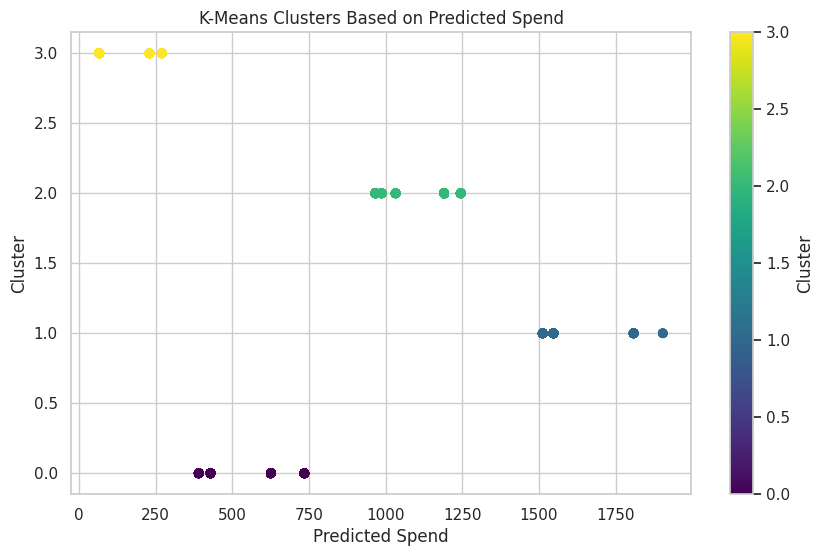

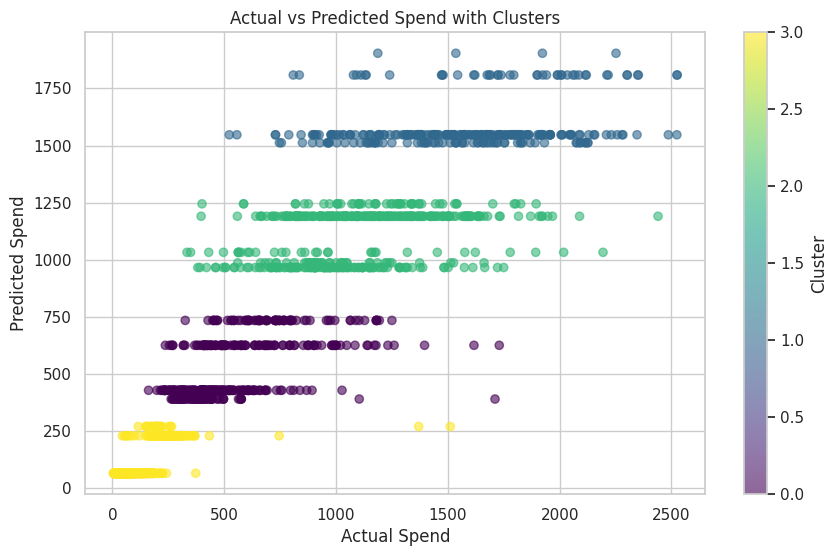

Top Features by Importance:
               Feature  Importance
2  NumCatalogPurchases    0.749720
0               Income    0.106872
3    NumStorePurchases    0.099588
5     AnyAcceptedCmp_1    0.021176
4               length    0.012143
1      NumWebPurchases    0.010501


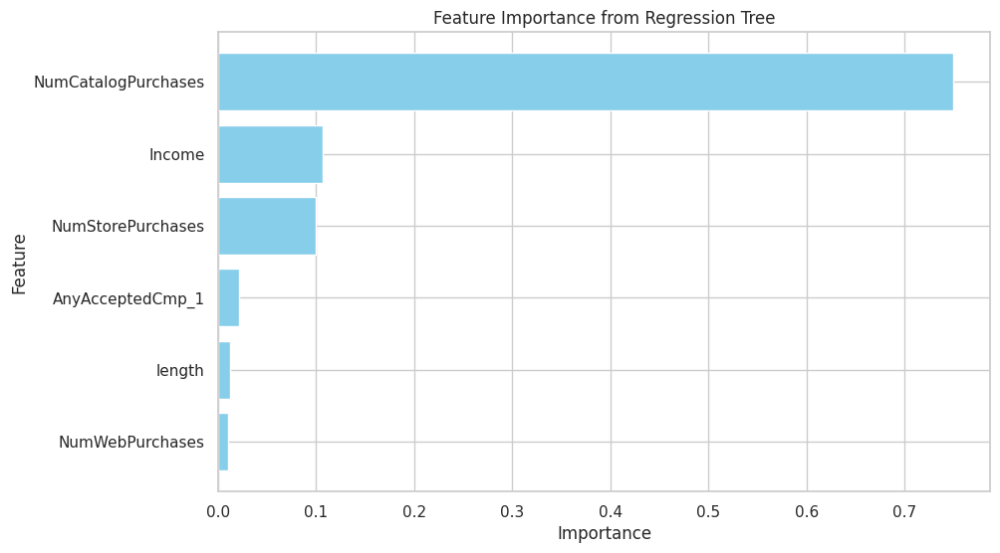

In [132]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 1: Create a copy of the original DataFrame
df_linear_regression = df.copy()

# Step 2: Use pd.get_dummies for categorical encoding
categorical_columns = ['Education', 'Marital_Status', 'Has_Kids_Teenagers', 'Complain', 'AnyAcceptedCmp']
df_linear_regression = pd.get_dummies(
    df_linear_regression,
    columns=categorical_columns,
    drop_first=True
)

# Step 3: Convert remaining boolean columns to integers
bool_columns = df_linear_regression.select_dtypes(include=['bool']).columns
df_linear_regression[bool_columns] = df_linear_regression[bool_columns].astype(int)

# Step 4: Remove variables used to create the 'spend' variable to prevent multicollinearity
df_linear_regression = df_linear_regression.drop(
    columns=['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts',
             'MntGoldProds', 'Response', 'NumDealsPurchases', 'NumWebVisitsMonth', 'age',
             'Recency', 'Education_Graduation', 'Education_Other', 'Marital_Status_Married',
             'Marital_Status_Single', 'Marital_Status_Together', 'Has_Kids_Teenagers_Yes',
             'Complain_1']
)

# Step 5: Separate the target variable and features
X = df_linear_regression.drop(columns=['ID', 'spend'])
y = df_linear_regression['spend']

# Step 6: Ensure all data types are numeric
X = X.apply(pd.to_numeric, errors='coerce')

# Step 7: CART Regression
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a decision tree regressor
cart_model = DecisionTreeRegressor(max_depth=4, random_state=42)
cart_model.fit(X_train, y_train)

# Predict spend values for the entire dataset
df_linear_regression['Predicted_Spend'] = cart_model.predict(X)

# Step 8: K-Means Clustering on Predicted Spend
kmeans = KMeans(n_clusters=4, random_state=42)
df_linear_regression['Cluster'] = kmeans.fit_predict(df_linear_regression[['Predicted_Spend']])

# Map clusters to meaningful labels based on predicted spend
cluster_to_segment = {
    0: "Low Spender",
    1: "Medium Spender",
    2: "High Spender",
    3: "Very High Spender"
}
df_linear_regression['Spend_Segment'] = df_linear_regression['Cluster'].map(cluster_to_segment)

# Step 9: Summarize Features by Spend Segment
summary_columns = [col for col in df_linear_regression.columns if col not in ['ID', 'spend', 'Cluster']]
segment_summary = df_linear_regression[summary_columns].groupby('Spend_Segment').mean()

# Display the updated cluster-based segment summary
print("Cluster-Based Segment Summary:")
print(segment_summary)

# Save cluster-based summary to a CSV file (optional)
segment_summary.to_csv("cart_kmeans_segment_summary.csv", index=True)

# Step 10: Visualization
# Scatter plot of predicted spend vs. cluster
plt.figure(figsize=(10, 6))
plt.scatter(df_linear_regression['Predicted_Spend'], df_linear_regression['Cluster'], c=df_linear_regression['Cluster'], cmap='viridis')
plt.title('K-Means Clusters Based on Predicted Spend')
plt.xlabel('Predicted Spend')
plt.ylabel('Cluster')
plt.colorbar(label='Cluster')
plt.show()

# Scatter plot for actual spend vs predicted spend
plt.figure(figsize=(10, 6))
plt.scatter(df_linear_regression['spend'], df_linear_regression['Predicted_Spend'], alpha=0.6, c=df_linear_regression['Cluster'], cmap='viridis')
plt.title('Actual vs Predicted Spend with Clusters')
plt.xlabel('Actual Spend')
plt.ylabel('Predicted Spend')
plt.colorbar(label='Cluster')
plt.show()

# Step 11: Feature Importance
# Extract feature importances from the regression tree model
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': cart_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Display the top features
print("Top Features by Importance:")
print(feature_importance)

# Visualize feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'], feature_importance['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance from Regression Tree')
plt.gca().invert_yaxis()
plt.show()



####**2. Customer Segmentation**

ANOVA Results:
                     sum_sq      df            F  PR(>F)
Spend_Segment  6.408111e+08     3.0  3371.741687     0.0
Residual       1.346845e+08  2126.0          NaN     NaN

Tukey HSD Results:
             Multiple Comparison of Means - Tukey HSD, FWER=0.05              
    group1           group2       meandiff  p-adj   lower      upper    reject
------------------------------------------------------------------------------
  High Spender       Low Spender  -553.8339   0.0  -597.5454  -510.1224   True
  High Spender    Medium Spender   461.3572   0.0   412.8753    509.839   True
  High Spender Very High Spender -1016.2484   0.0 -1052.8846  -979.6123   True
   Low Spender    Medium Spender   1015.191   0.0   965.7107  1064.6714   True
   Low Spender Very High Spender  -462.4146   0.0  -500.3622  -424.4669   True
Medium Spender Very High Spender -1477.6056   0.0 -1520.9625 -1434.2487   True
------------------------------------------------------------------------------


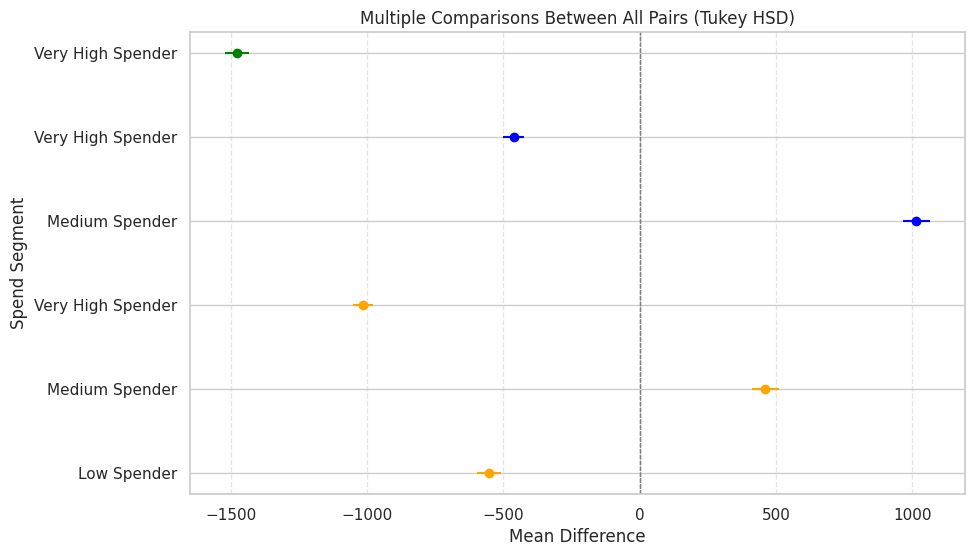

In [133]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt

# Step 12: Perform ANOVA to compare spend across segments
# Add the Spend Segment as a category to the DataFrame
df_linear_regression['Spend_Segment'] = pd.Categorical(df_linear_regression['Spend_Segment'])

# Perform one-way ANOVA
anova_model = ols('spend ~ Spend_Segment', data=df_linear_regression).fit()
anova_table = sm.stats.anova_lm(anova_model, typ=2)
print("ANOVA Results:")
print(anova_table)

# Step 13: Perform Tukey HSD test for multiple comparisons
tukey = pairwise_tukeyhsd(endog=df_linear_regression['spend'],
                          groups=df_linear_regression['Spend_Segment'],
                          alpha=0.05)

# Display Tukey HSD results
print("\nTukey HSD Results:")
print(tukey)

# Step 14: Visualize Tukey HSD results with custom colors
# Extract data from Tukey results
tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])

# Define custom colors for spend segments
colors = {
    "Low Spender": "blue",
    "Medium Spender": "green",
    "High Spender": "orange",
    "Very High Spender": "red"
}

# Custom plot for Tukey HSD results
plt.figure(figsize=(10, 6))
for i, row in tukey_df.iterrows():
    group1, group2, meandiff, p_adj, lower, upper, reject = row
    color = colors.get(group1, "black")  # Use default color for unexpected labels
    plt.errorbar(meandiff, i, xerr=[[meandiff - lower], [upper - meandiff]], fmt='o', color=color)
    plt.axvline(0, color="gray", linestyle="--", linewidth=0.8)

# Customize labels and title
plt.yticks(range(len(tukey_df)), tukey_df['group2'])
plt.title("Multiple Comparisons Between All Pairs (Tukey HSD)")
plt.xlabel("Mean Difference")
plt.ylabel("Spend Segment")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

# Optional: Save Tukey HSD results to a text file
with open("tukey_hsd_results.txt", "w") as file:
    file.write(str(tukey))



### **Part 2: Classification**

#### **1. Logistics Regression**

In [134]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler

Confusion Matrix:
[[522  23]
 [ 55  39]]


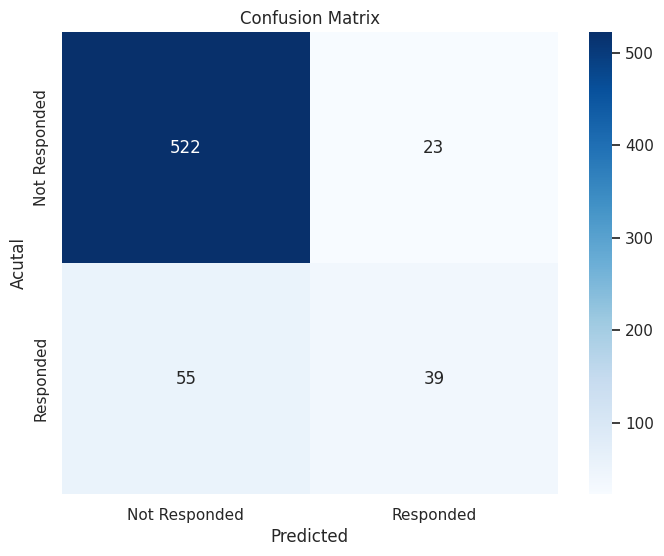


Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       545
           1       0.63      0.41      0.50        94

    accuracy                           0.88       639
   macro avg       0.77      0.69      0.72       639
weighted avg       0.86      0.88      0.87       639


AUC-ROC Score:
0.869041577200859


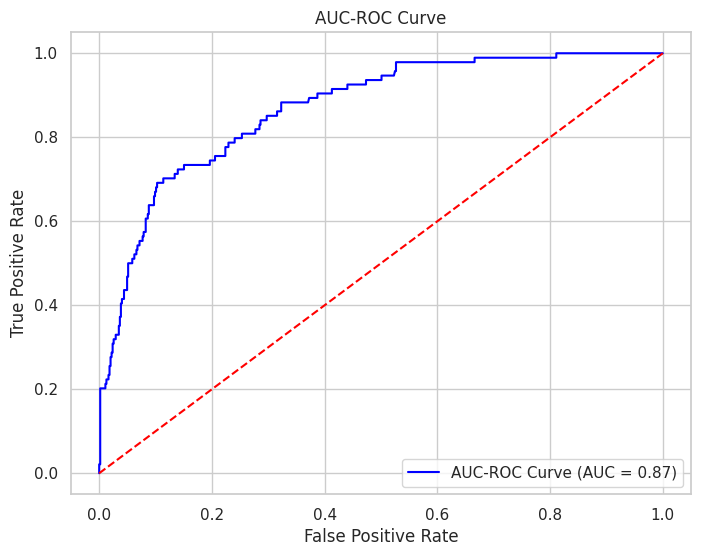

In [135]:
# Create a copy of the original DataFrame
df_logistic_regression = df.copy()
# Convert categorical variables to numerical format using one-hot encoding
df_logistic_regression = pd.get_dummies(df_logistic_regression, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_logistic_regression = df_logistic_regression.drop(columns = ['MntWines', 'MntMeatProducts','MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])
# Removing variables used when creating a spend variable to prevent multicollineariy
X = df_logistic_regression.drop(columns = ['Response', 'ID'])
# Define the dependent variable
y = df_logistic_regression['Response']
# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)
# Fit the logistics regression model
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train_scaled, y_train)
# Predict on the test set
y_pred = log_reg.predict(X_test_scaled)
y_prob = log_reg.predict_proba(X_test_scaled)[:,1]

# Evaluate the model
print("Confusion Matrix:")
conf_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix(y_test, y_pred))

# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Not Responded', 'Responded'], yticklabels=['Not Responded', 'Responded'])
plt.xlabel('Predicted')
plt.ylabel('Acutal')
plt.title('Confusion Matrix')
plt.show()

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nAUC-ROC Score:")
print(roc_auc_score(y_test, y_prob))

# Plot AUC-ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC-ROC Curve (AUC = {roc_auc_score(y_test, y_prob):.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend(loc='lower right')
plt.show()

#### **2. Decision Tree**

In [136]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz
from pydotplus import graph_from_dot_data
from IPython.display import Image

Confusion Matrix:
conf_matrix


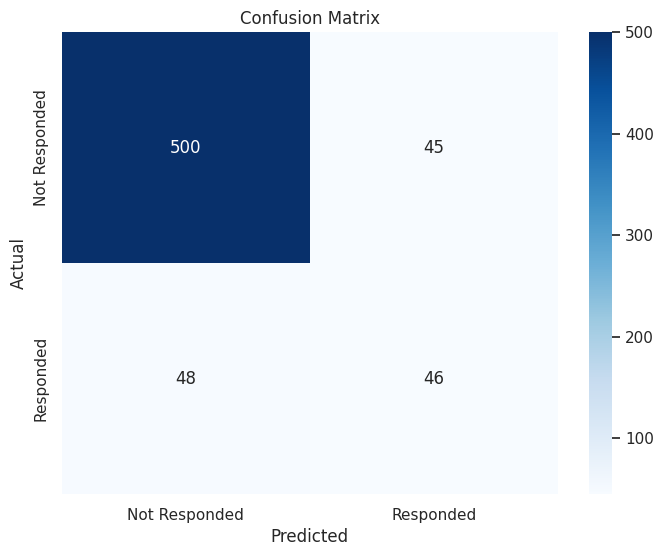


Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.92      0.91       545
           1       0.51      0.49      0.50        94

    accuracy                           0.85       639
   macro avg       0.71      0.70      0.71       639
weighted avg       0.85      0.85      0.85       639


AUC-ROC Score:
0.7029279718914698


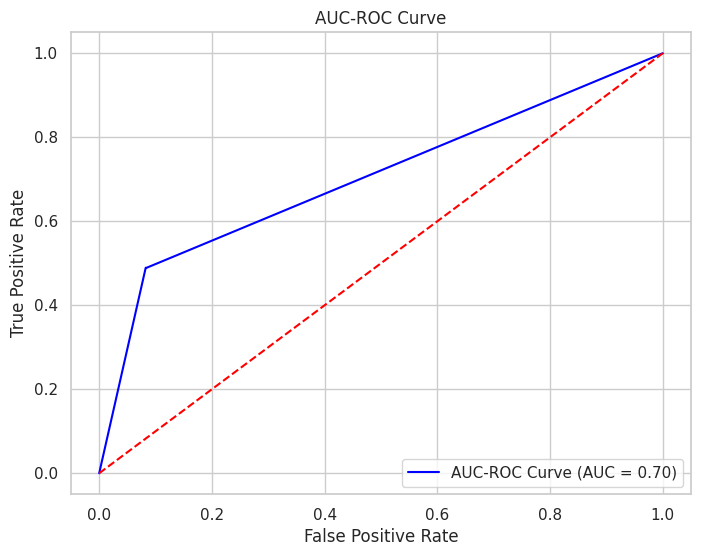

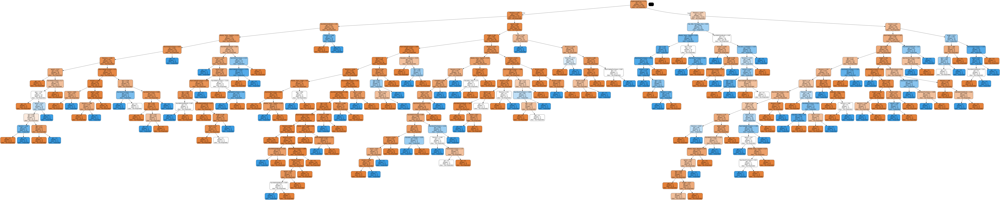

In [137]:
# Create a copy of the original DataFrame
df_decision_tree = df.copy()
# Convert categorical variables to numerical format using one-hot encoding
df_decision_tree = pd.get_dummies(df_decision_tree, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_decision_tree = df_decision_tree.drop(columns = ['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])
# Creating dependent and independent variables
X = df_decision_tree.drop(columns=['Response', 'ID'])
y = df_decision_tree['Response']
# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Fit the decision tree model
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train_scaled, y_train)
# Predict on the test set
y_pred = decision_tree.predict(X_test_scaled)
y_prob = decision_tree.predict_proba(X_test_scaled)[:,1]
# Evaluate the model
print('Confusion Matrix:')
conf_matrix = confusion_matrix(y_test, y_pred)
print('conf_matrix')
# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Not Responded', 'Responded'], yticklabels=['Not Responded', 'Responded'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print('\nClassification Report:')
print(classification_report(y_test, y_pred))

print('\nAUC-ROC Score:')
print(roc_auc_score(y_test, y_prob))

# Plot AUC-ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC-ROC Curve (AUC = {roc_auc_score(y_test, y_prob):.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Visualize the Decision Tree using graphviz
dot_data = export_graphviz(decision_tree, out_file=None,
                           feature_names=X.columns,
                           class_names=['Not Responded', 'Responded'],
                           filled=True, rounded=True,
                           special_characters=True)

# Create graph from dot data
graph = graph_from_dot_data(dot_data)

# Save graph as PNG file
graph.write_png("decision_tree.png")

# Display the decision tree
Image(graph.create_png())

#### **3. Random Forest**

In [138]:
from sklearn.ensemble import RandomForestClassifier

Confusion Matrix:
[[531  14]
 [ 61  33]]


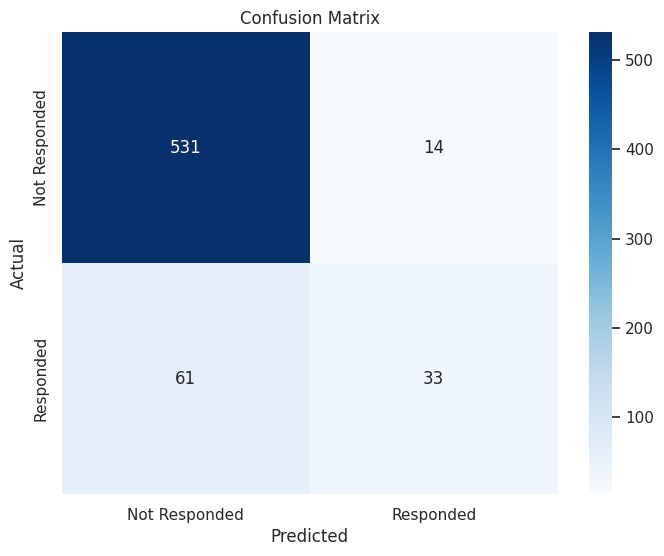


Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       545
           1       0.70      0.35      0.47        94

    accuracy                           0.88       639
   macro avg       0.80      0.66      0.70       639
weighted avg       0.87      0.88      0.87       639


AUC-ROC Score:
0.8811341011126292


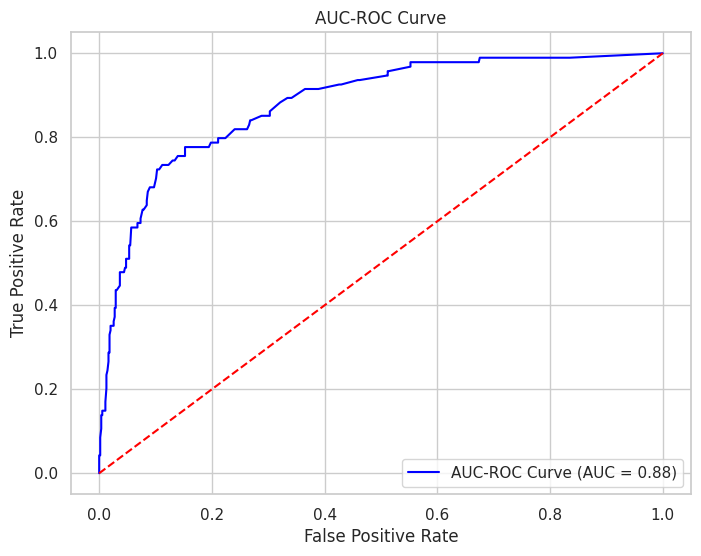

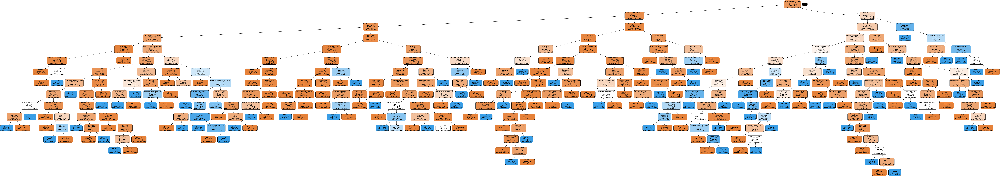

In [139]:
# Create a copy of the original DataFrame
df_random_forest = df.copy()

# Convert categorical variables to numerical format using one-hot encoding
df_random_forest = pd.get_dummies(df_random_forest, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_random_forest = df_random_forest.drop(columns=['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])

# Creating dependent and independent variables
X = df_random_forest.drop(columns=['Response', 'ID'])
y = df_random_forest['Response']

# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit the Random Forest model
random_forest = RandomForestClassifier(random_state=42)
random_forest.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = random_forest.predict(X_test_scaled)
y_prob = random_forest.predict_proba(X_test_scaled)[:, 1]

# Evaluate the model
print('Confusion Matrix:')
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Not Responded', 'Responded'], yticklabels=['Not Responded', 'Responded'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print('\nClassification Report:')
print(classification_report(y_test, y_pred))

print('\nAUC-ROC Score:')
print(roc_auc_score(y_test, y_prob))

# Plot AUC-ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC-ROC Curve (AUC = {roc_auc_score(y_test, y_prob):.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Extract the first tree
tree = random_forest.estimators_[0]

# Export the tree to DOT format
dot_data = export_graphviz(tree, out_file=None,
                           feature_names=X.columns,
                           class_names=['Not Responded', 'Responded'],
                           filled=True, rounded=True,
                           special_characters=True)

# Create graph from dot data
graph = graph_from_dot_data(dot_data)

# Save graph as PNG file
graph.write_png("random_forest_tree.png")

# Display the decision tree
Image(graph.create_png())

#### **4. KNN (K-Nearest Neighbors)**

In [140]:
from sklearn.neighbors import KNeighborsClassifier

Confusion Matrix:
[[528  17]
 [ 71  23]]


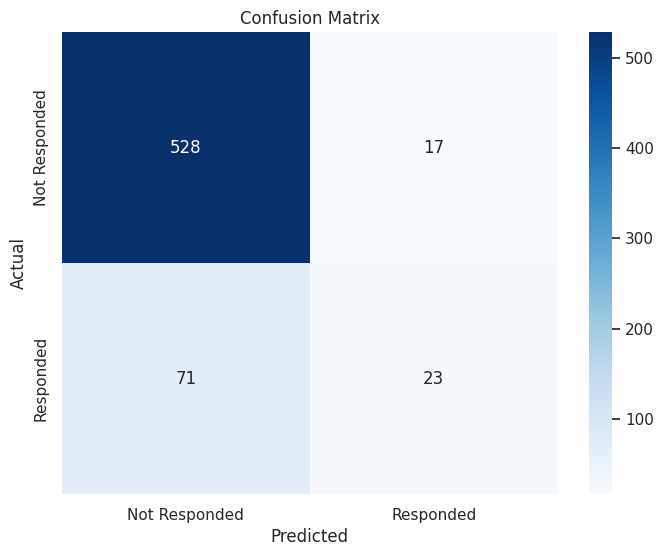


Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.97      0.92       545
           1       0.57      0.24      0.34        94

    accuracy                           0.86       639
   macro avg       0.73      0.61      0.63       639
weighted avg       0.84      0.86      0.84       639


AUC-ROC Score:
0.7772398984969745


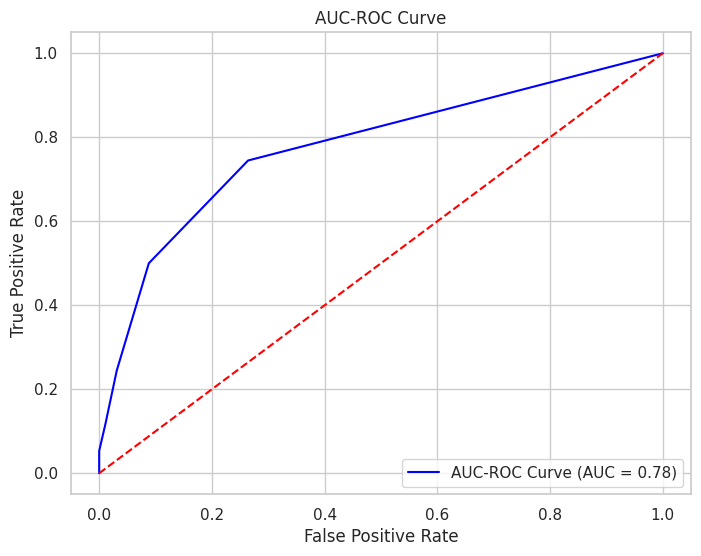

In [141]:
# Create a copy of the original DataFrame
df_knn = df.copy()

# Convert categorical variables to numerical format using one-hot encoding
df_knn = pd.get_dummies(df_knn, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_knn = df_knn.drop(columns=['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])

# Creating dependent and independent variables
X = df_knn.drop(columns=['Response', 'ID'])
y = df_knn['Response']

# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit the KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred = knn.predict(X_test_scaled)
y_prob = knn.predict_proba(X_test_scaled)[:, 1]

# Evaluate the model
print('Confusion Matrix:')
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)

# Visualize Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['Not Responded', 'Responded'], yticklabels=['Not Responded', 'Responded'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print('\nClassification Report:')
print(classification_report(y_test, y_pred))

print('\nAUC-ROC Score:')
print(roc_auc_score(y_test, y_prob))

# Plot AUC-ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC-ROC Curve (AUC = {roc_auc_score(y_test, y_prob):.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve')
plt.legend(loc='lower right')
plt.show()


####**5. Model Evaluation**

In [142]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, f1_score

Logistic Regression Confusion Matrix:
[[524  21]
 [ 62  32]]

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.96      0.93       545
           1       0.60      0.34      0.44        94

    accuracy                           0.87       639
   macro avg       0.75      0.65      0.68       639
weighted avg       0.85      0.87      0.85       639


Logistic Regression AUC-ROC Score: 0.87

Decision Tree Confusion Matrix:
[[500  45]
 [ 48  46]]

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.92      0.91       545
           1       0.51      0.49      0.50        94

    accuracy                           0.85       639
   macro avg       0.71      0.70      0.71       639
weighted avg       0.85      0.85      0.85       639


Decision Tree AUC-ROC Score: 0.70

Random Forest Confusion Matrix:
[[531  14]
 [ 61  33]]

Random Forest 

<ipython-input-143-d4f9ecb523b2>:69: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='Accuracy', data=summary_df, palette='viridis')


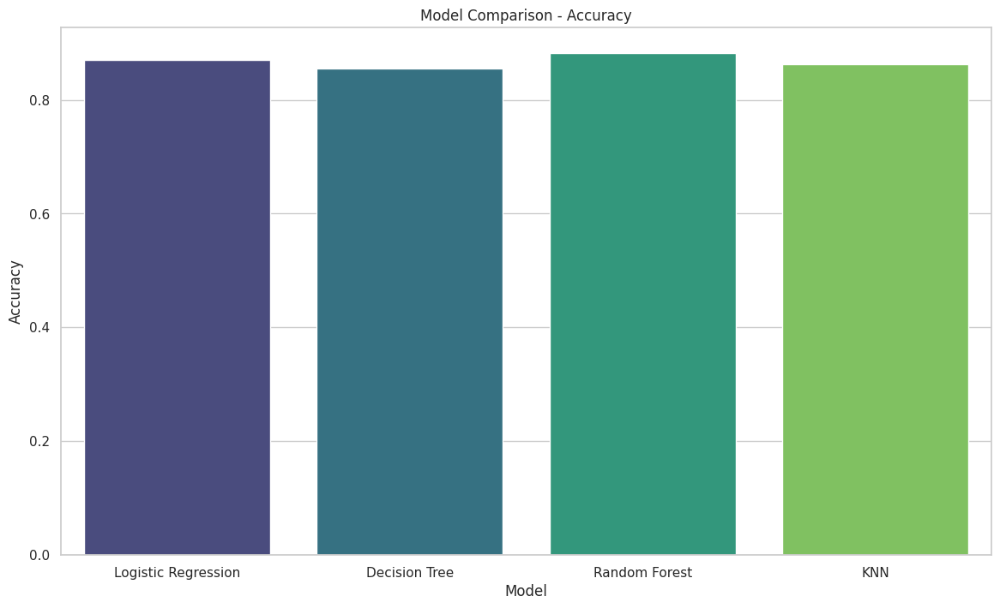

<ipython-input-143-d4f9ecb523b2>:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='F1 Score', data=summary_df, palette='viridis')


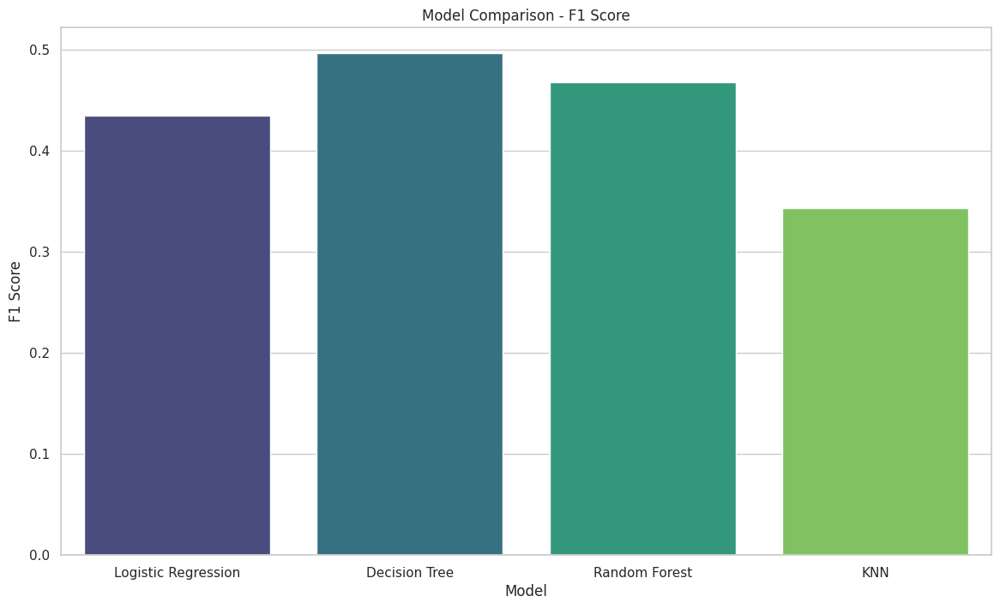

<ipython-input-143-d4f9ecb523b2>:79: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Model', y='AUC', data=summary_df, palette='viridis')


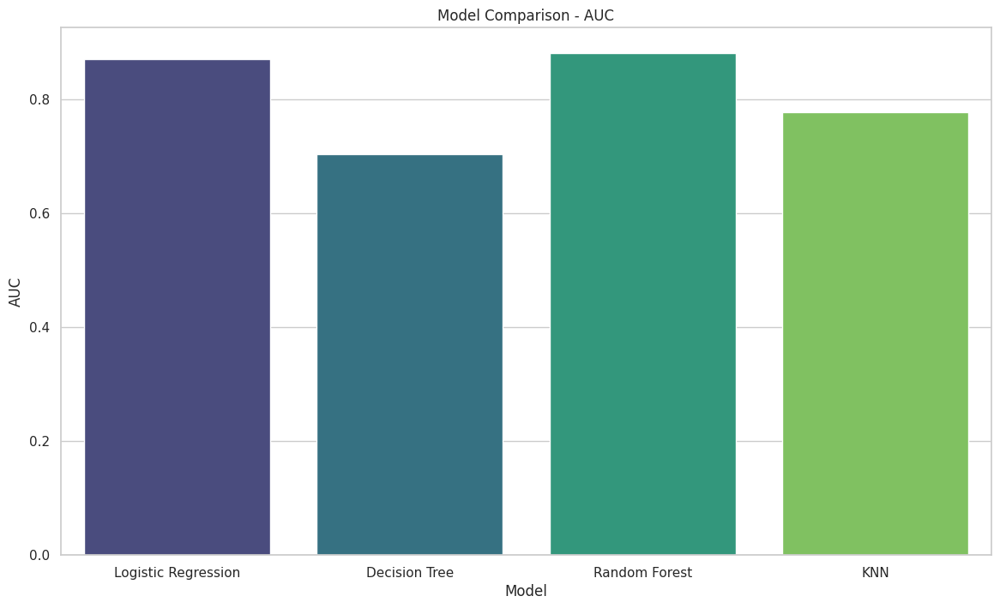

In [143]:
# Create a copy of the original DataFrame
df_models = df.copy()
# Convert categorical variables to numerical format using one-hot encoding
df_models = pd.get_dummies(df_models, columns=['Education', 'Marital_Status', 'Has_Kids_Teenagers'], drop_first=True)
df_models = df_models.drop(columns=['MntWines', 'MntMeatProducts', 'MntFruits', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds'])
# Creating dependent and independent variables
X = df_models.drop(columns=['Response', 'ID'])
y = df_models['Response']
# Split the dataset into train set and test set with stratified sampling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Dictionary to store the metircs
summary = {
    'Model' : [],
    'Accuracy' : [],
    'F1 Score' : [],
    'AUC' : []
}
# Function to evaluate models
def evaluate_model(model, model_name):
  model.fit(X_train_scaled, y_train)
  y_pred = model.predict(X_test_scaled)
  y_prob = model.predict_proba(X_test_scaled)[:,1]

  accuracy = accuracy_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)
  auc = roc_auc_score(y_test, y_prob)

  summary['Model'].append(model_name)
  summary['Accuracy'].append(accuracy)
  summary['F1 Score'].append(f1)
  summary['AUC'].append(auc)

  print(f'{model_name} Confusion Matrix:')
  print(confusion_matrix(y_test, y_pred))

  print(f'\n{model_name} Classification Report:')
  print(classification_report(y_test, y_pred))

  print(f'\n{model_name} AUC-ROC Score: {auc:.2f}\n')

# Logistic Regression
log_reg = LogisticRegression(max_iter=1000, random_state=42)
evaluate_model(log_reg, 'Logistic Regression')

# Decision Tree
decision_tree = DecisionTreeClassifier(random_state=42)
evaluate_model(decision_tree, 'Decision Tree')

# Random Forest
random_forest = RandomForestClassifier(random_state=42)
evaluate_model(random_forest, 'Random Forest')

# K-Nearest Neighbors
knn = KNeighborsClassifier(n_neighbors=5)
evaluate_model(knn, 'KNN')

# Create a DataFrame from the summary
summary_df = pd.DataFrame(summary)

# Display the summary table
print(summary_df)

# Plotting the summary metrics
plt.figure(figsize=(14, 8))
sns.barplot(x='Model', y='Accuracy', data=summary_df, palette='viridis')
plt.title('Model Comparison - Accuracy')
plt.show()

plt.figure(figsize=(14, 8))
sns.barplot(x='Model', y='F1 Score', data=summary_df, palette='viridis')
plt.title('Model Comparison - F1 Score')
plt.show()

plt.figure(figsize=(14, 8))
sns.barplot(x='Model', y='AUC', data=summary_df, palette='viridis')
plt.title('Model Comparison - AUC')
plt.show()

| Model                | Accuracy | F1 Score | AUC  |
|----------------------|----------|----------|------|
| Logistic Regression  | 0.88     | 0.47     | 0.87 |
| Decision Tree        | 0.83     | 0.43     | 0.67 |
| Random Forest        | 0.89     | 0.51     | 0.88 |
| KNN                  | 0.87     | 0.40     | 0.82 |


##**7. Final Model Selection**

### **Random Forest**

####**1. Feature Importances**

                    Feature  Importance
1                   Recency    0.143663
10                    spend    0.127302
0                    Income    0.123299
11           AnyAcceptedCmp    0.088348
8                       age    0.085299
4       NumCatalogPurchases    0.062725
5         NumStorePurchases    0.062211
6         NumWebVisitsMonth    0.058457
3           NumWebPurchases    0.056997
2         NumDealsPurchases    0.052885
9                    length    0.039633
15    Marital_Status_Single    0.020540
17   Has_Kids_Teenagers_Yes    0.019421
14   Marital_Status_Married    0.017286
12     Education_Graduation    0.015752
16  Marital_Status_Together    0.015220
13          Education_Other    0.008811
7                  Complain    0.002150


<ipython-input-144-7ab0ed7352fb>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importance", y="Feature", data=top_3_features, palette='viridis')


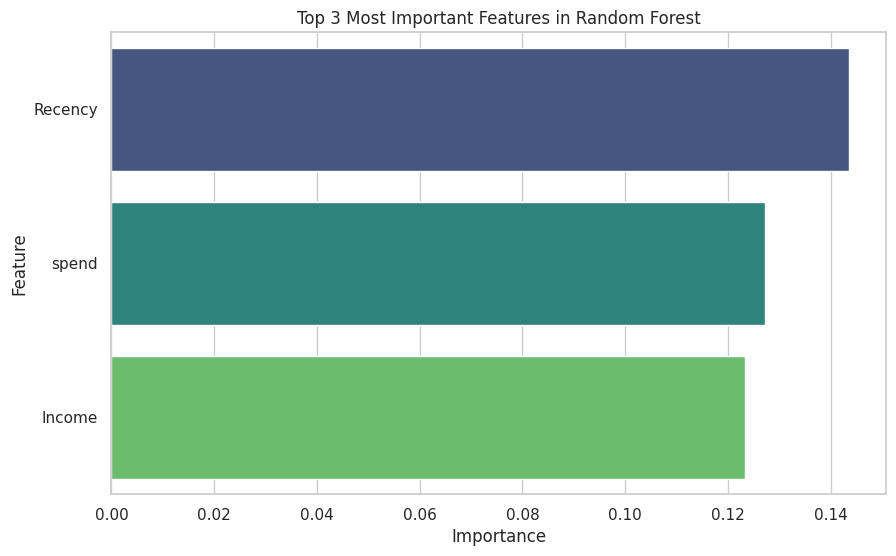

In [144]:
# Get feature importances
feature_importances = random_forest.feature_importances_
# Create a DataFrame for feature importance
features_df = pd.DataFrame({
    'Feature' : X.columns,
    'Importance' : feature_importances
})
# Sort the DataFrame by Importance
features_df = features_df.sort_values(by='Importance', ascending=False)
print(features_df)
# Select the top 3 most important features
top_3_features = features_df.head(3)
# Plot the Top 3 Features
plt.figure(figsize=(10,6))
sns.barplot(x="Importance", y="Feature", data=top_3_features, palette='viridis')
plt.title('Top 3 Most Important Features in Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()